In [1]:
from pharynx_analysis import (
    pharynx_io as pio, image_processing as ip, 
    experiment, plots, profile_processing, data_analysis
)
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import xarray as xr
from importlib import reload
from skimage import measure, transform
from collections import namedtuple
import pdb
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean
from sklearn.preprocessing import scale
import skimage
import logging
from mpl_toolkits.axes_grid1 import ImageGrid
import pandas as pd
import seaborn as sns
from skfda import FDataGrid
import skfda
from statsmodels.stats.weightstats import DescrStatsW
from scipy import signal
import matlab.engine
import matlab
import pandas as pd
from pathlib import Path
import matplotlib
from tqdm import tqdm_notebook
import matlab.engine

reload(logging)
reload(experiment)
reload(pio)
reload(ip)
reload(plots)
reload(profile_processing)
reload(data_analysis)

logging.basicConfig(format='%(asctime)s %(levelname)s:%(message)s', level=logging.DEBUG, datefmt='%I:%M:%S')

# Run Reg/Unreg Pipelines on all experiments

12:05:41 INFO:Starting full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_23-HD233_4mm_lev
12:05:41 INFO:Loading Images
12:05:41 INFO:Segmenting pharynxes
12:05:41 INFO:Centering and rotating pharynxes
100%|██████████| 28/28 [00:01<00:00, 15.88it/s]
12:05:43 INFO:Calculating midlines
100%|██████████| 28/28 [00:00<00:00, 112.20it/s]
12:05:43 INFO:Measuring under midlines
100%|██████████| 28/28 [00:00<00:00, 114.93it/s]
12:05:44 INFO:Trimming intensity data
12:05:44 INFO:Calculating redox measurements
12:05:44 INFO:Saving 2017_08_23-HD233_4mm_lev inside /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_23-HD233_4mm_lev
12:05:44 INFO:Saving region means to /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_23-HD233_4mm_lev/analyses/2019-08-26_single_reg_warp_lam=0/2017_08_23-HD233_4mm_lev-summary_table.csv
12:05:44 INFO:Saving profile data to /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_23-HD233_4mm_lev/analyses/2019-08-26_single_reg_warp_l

 54%|█████▎    | 15/28 [00:20<00:17,  1.37s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 57%|█████▋    | 16/28 [00:21<00:17,  1.44s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 61%|██████    | 17/28 [00:23<00:15,  1.45s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, 

 25%|██▌       | 7/28 [00:09<00:27,  1.29s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 29%|██▊       | 8/28 [00:10<00:25,  1.26s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 32%|███▏      | 9/28 [00:12<00:23,  1.22s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`ma

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
12:09:05 INFO:Finished full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_23-HD233_4mm_lev
  0%|          | 0/28 [00:00<?, ?it/s]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  4%|▎         | 1/28 [00:02<01:14,  2.75s/it]../pharynx_analysis/plots.py:405: Ru

 68%|██████▊   | 19/28 [00:26<00:12,  1.44s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 71%|███████▏  | 20/28 [00:27<00:10,  1.34s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 75%|███████▌  | 21/28 [00:28<00:08,  1.28s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this

  7%|▋         | 9/123 [00:12<02:35,  1.37s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  8%|▊         | 10/123 [00:13<02:32,  1.35s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  9%|▉         | 11/123 [00:15<02:27,  1.32s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface

 24%|██▎       | 29/123 [00:40<01:58,  1.26s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 24%|██▍       | 30/123 [00:41<01:54,  1.23s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 25%|██▌       | 31/123 [00:42<01:51,  1.21s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 40%|███▉      | 49/123 [01:03<01:27,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 41%|████      | 50/123 [01:04<01:25,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 41%|████▏     | 51/123 [01:08<02:20,  1.95s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 56%|█████▌    | 69/123 [01:28<01:01,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 57%|█████▋    | 70/123 [01:30<01:00,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 58%|█████▊    | 71/123 [01:31<00:59,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 72%|███████▏  | 89/123 [01:54<00:49,  1.47s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 73%|███████▎  | 90/123 [01:55<00:44,  1.36s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 74%|███████▍  | 91/123 [01:57<00:41,  1.29s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 89%|████████▊ | 109/123 [02:17<00:16,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 89%|████████▉ | 110/123 [02:18<00:14,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 90%|█████████ | 111/123 [02:19<00:13,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot inter

../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, 

  4%|▍         | 5/123 [00:06<02:30,  1.27s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  5%|▍         | 6/123 [00:07<02:26,  1.25s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  6%|▌         | 7/123 [00:08<02:21,  1.22s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

 20%|██        | 25/123 [00:29<01:53,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 21%|██        | 26/123 [00:30<02:00,  1.24s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 22%|██▏       | 27/123 [00:32<02:03,  1.29s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 37%|███▋      | 45/123 [00:55<01:46,  1.36s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 37%|███▋      | 46/123 [00:57<01:52,  1.46s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 38%|███▊      | 47/123 [00:58<01:55,  1.52s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 53%|█████▎    | 65/123 [01:29<01:20,  1.38s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 54%|█████▎    | 66/123 [01:31<01:18,  1.37s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 54%|█████▍    | 67/123 [01:32<01:18,  1.41s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 69%|██████▉   | 85/123 [02:02<00:46,  1.22s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 70%|██████▉   | 86/123 [02:03<00:44,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 71%|███████   | 87/123 [02:04<00:42,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 85%|████████▌ | 105/123 [02:25<00:21,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 86%|████████▌ | 106/123 [02:27<00:20,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 87%|████████▋ | 107/123 [02:28<00:18,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot inter

12:21:50 INFO:Saving profile data to /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_22-HD233_SAY47/analyses/2019-08-26_single_reg_warp_lam=10/2017_02_22-HD233_SAY47-profile_data.nc
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyp

 17%|█▋        | 21/123 [00:24<02:00,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 18%|█▊        | 22/123 [00:26<02:03,  1.23s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 19%|█▊        | 23/123 [00:27<02:00,  1.21s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 33%|███▎      | 41/123 [00:51<01:40,  1.22s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 34%|███▍      | 42/123 [00:52<01:38,  1.21s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 35%|███▍      | 43/123 [00:53<01:42,  1.28s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 50%|████▉     | 61/123 [01:18<01:14,  1.21s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 50%|█████     | 62/123 [01:19<01:12,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 51%|█████     | 63/123 [01:21<01:09,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 66%|██████▌   | 81/123 [02:01<00:50,  1.21s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 67%|██████▋   | 82/123 [02:03<00:49,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 67%|██████▋   | 83/123 [02:04<00:47,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 82%|████████▏ | 101/123 [02:30<00:29,  1.33s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 83%|████████▎ | 102/123 [02:31<00:27,  1.30s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 84%|████████▎ | 103/123 [02:32<00:27,  1.36s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot inter

 98%|█████████▊| 121/123 [02:54<00:02,  1.13s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 99%|█████████▉| 122/123 [02:55<00:01,  1.13s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
100%|██████████| 123/123 [02:56<00:00,  1.13s/it]
12:25:01 INFO:Starting full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_25-HD233_SAY93
12:25:01 INF

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`mat

 43%|████▎     | 15/35 [00:17<00:23,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 46%|████▌     | 16/35 [00:19<00:24,  1.27s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 49%|████▊     | 17/35 [00:20<00:22,  1.25s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

12:28:10 INFO:Finished full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_25-HD233_SAY93
  0%|          | 0/35 [00:00<?, ?it/s]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  3%|▎         | 1/35 [00:01<00:41,  1.22s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  6%|▌         | 2/35 [00:02<00:40,  1.23s/it]../pharynx_analysis/plots.py:4

 57%|█████▋    | 20/35 [00:25<00:17,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 60%|██████    | 21/35 [00:26<00:16,  1.21s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 63%|██████▎   | 22/35 [00:28<00:15,  1.21s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, 

 14%|█▍        | 5/35 [00:06<00:40,  1.36s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 17%|█▋        | 6/35 [00:08<00:40,  1.39s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 20%|██        | 7/35 [00:09<00:38,  1.37s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`ma

../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, 

  7%|▋         | 8/109 [00:09<01:57,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  8%|▊         | 9/109 [00:10<01:55,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  9%|▉         | 10/109 [00:11<01:53,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface 

 26%|██▌       | 28/109 [01:51<12:36,  9.34s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 27%|██▋       | 29/109 [01:53<09:11,  6.90s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 28%|██▊       | 30/109 [01:54<06:50,  5.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 44%|████▍     | 48/109 [02:16<01:13,  1.21s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 45%|████▍     | 49/109 [02:17<01:11,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 46%|████▌     | 50/109 [02:18<01:09,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 62%|██████▏   | 68/109 [02:42<00:51,  1.25s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 63%|██████▎   | 69/109 [02:43<00:50,  1.25s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 64%|██████▍   | 70/109 [02:44<00:48,  1.24s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 81%|████████  | 88/109 [03:09<00:28,  1.34s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 82%|████████▏ | 89/109 [03:11<00:28,  1.43s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 83%|████████▎ | 90/109 [03:12<00:25,  1.34s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 99%|█████████▉| 108/109 [03:33<00:01,  1.26s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
100%|██████████| 109/109 [03:34<00:00,  1.26s/it]
12:36:19 INFO:Starting full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_23-HD233_HD236
12:36:19 INFO:Loading Images
12:36:20 INFO:Segmenting pharynxes
12:36:21 INFO:Centering and rotating pharynxes
100%|██████████| 109/109 [00:07<00:00, 13.81it/s]
12:36:30 INFO:Calculating midlines
100%|██████████| 109/109 [00:01<00:00, 104.19it/s]
12:36:31 INFO:Measuring under midlines
100%|██████████| 109/109 [00:00<00:00, 124.57it/s]
12:36:32 INFO:Registering profiles
12:37:57 INFO:Trimming intensity data
12:37:58 INFO

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
12:38:13 INFO:Finished full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_23-HD233_HD236
  0%|          | 0/109 [00:00<?, ?it/s]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  1%|          | 1/109 [00:01<02:13,  1.23s/it]../pharynx_analysis/plots.py:405: Ru

 17%|█▋        | 19/109 [00:26<01:49,  1.22s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 18%|█▊        | 20/109 [00:27<01:46,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 19%|█▉        | 21/109 [00:28<01:43,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 36%|███▌      | 39/109 [00:49<01:23,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 37%|███▋      | 40/109 [00:50<01:21,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 38%|███▊      | 41/109 [00:51<01:19,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 54%|█████▍    | 59/109 [02:53<02:27,  2.95s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 55%|█████▌    | 60/109 [02:54<01:58,  2.42s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 56%|█████▌    | 61/109 [02:55<01:38,  2.05s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 72%|███████▏  | 79/109 [03:20<00:36,  1.21s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 73%|███████▎  | 80/109 [03:21<00:34,  1.21s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 74%|███████▍  | 81/109 [03:23<00:33,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 91%|█████████ | 99/109 [03:47<00:14,  1.42s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 92%|█████████▏| 100/109 [03:48<00:12,  1.37s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 93%|█████████▎| 101/109 [03:50<00:10,  1.34s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interf

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`mat

  9%|▉         | 10/109 [00:11<01:52,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 10%|█         | 11/109 [00:12<01:51,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 11%|█         | 12/109 [00:13<01:50,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 28%|██▊       | 30/109 [00:34<01:30,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 28%|██▊       | 31/109 [00:35<01:28,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 29%|██▉       | 32/109 [00:36<01:28,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 46%|████▌     | 50/109 [00:57<01:08,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 47%|████▋     | 51/109 [00:58<01:07,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 48%|████▊     | 52/109 [00:59<01:06,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 64%|██████▍   | 70/109 [01:22<00:51,  1.33s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 65%|██████▌   | 71/109 [01:23<00:48,  1.27s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 66%|██████▌   | 72/109 [01:24<00:45,  1.23s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 83%|████████▎ | 90/109 [01:46<00:22,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 83%|████████▎ | 91/109 [01:47<00:20,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 84%|████████▍ | 92/109 [01:48<00:19,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
12:50:06 INFO:Finished full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_03_01_HD233_HD236
  0%|          | 0/120 [00:00<?, ?it/s]../pharynx_analysis/plots.py:405: RuntimeWarn

 15%|█▌        | 18/120 [00:22<02:01,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 16%|█▌        | 19/120 [00:23<01:59,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 17%|█▋        | 20/120 [00:24<01:56,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 32%|███▏      | 38/120 [00:45<01:35,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 32%|███▎      | 39/120 [00:46<01:33,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 33%|███▎      | 40/120 [00:47<01:32,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 48%|████▊     | 58/120 [01:08<01:11,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 49%|████▉     | 59/120 [01:09<01:10,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 50%|█████     | 60/120 [01:10<01:08,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 65%|██████▌   | 78/120 [01:31<00:47,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 66%|██████▌   | 79/120 [01:32<00:46,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 67%|██████▋   | 80/120 [01:33<00:45,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 82%|████████▏ | 98/120 [01:53<00:25,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 82%|████████▎ | 99/120 [01:54<00:23,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 83%|████████▎ | 100/120 [01:55<00:22,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfa

 98%|█████████▊| 118/120 [02:16<00:02,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 99%|█████████▉| 119/120 [02:17<00:01,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
100%|██████████| 120/120 [02:18<00:00,  1.14s/it]
12:52:28 INFO:Starting full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_03_01_HD233_HD236
12:52:28 INF

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`mat

 14%|█▍        | 17/120 [00:19<01:57,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 15%|█▌        | 18/120 [00:20<01:56,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 16%|█▌        | 19/120 [00:21<01:55,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 31%|███       | 37/120 [00:42<01:38,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 32%|███▏      | 38/120 [00:43<01:35,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 32%|███▎      | 39/120 [00:44<01:33,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 48%|████▊     | 57/120 [01:05<01:11,  1.13s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 48%|████▊     | 58/120 [01:06<01:10,  1.13s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 49%|████▉     | 59/120 [01:07<01:08,  1.13s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 64%|██████▍   | 77/120 [01:27<00:50,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 65%|██████▌   | 78/120 [01:29<00:48,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 66%|██████▌   | 79/120 [01:30<00:46,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 81%|████████  | 97/120 [04:06<00:32,  1.42s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 82%|████████▏ | 98/120 [04:07<00:29,  1.34s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 82%|████████▎ | 99/120 [04:09<00:28,  1.36s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 98%|█████████▊| 117/120 [04:30<00:03,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 98%|█████████▊| 118/120 [04:31<00:02,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 99%|█████████▉| 119/120 [04:32<00:01,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot inter

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`mat

 13%|█▎        | 16/120 [00:19<01:59,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 14%|█▍        | 17/120 [00:20<01:57,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 15%|█▌        | 18/120 [00:21<01:56,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 30%|███       | 36/120 [00:42<01:35,  1.13s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 31%|███       | 37/120 [00:43<01:33,  1.13s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 32%|███▏      | 38/120 [00:44<01:32,  1.13s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 47%|████▋     | 56/120 [01:04<01:13,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 48%|████▊     | 57/120 [01:06<01:12,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 48%|████▊     | 58/120 [01:07<01:11,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 63%|██████▎   | 76/120 [01:28<00:50,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 64%|██████▍   | 77/120 [01:29<00:48,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 65%|██████▌   | 78/120 [01:31<00:47,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 80%|████████  | 96/120 [01:51<00:28,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 81%|████████  | 97/120 [01:52<00:27,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 82%|████████▏ | 98/120 [01:54<00:26,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 97%|█████████▋| 116/120 [02:14<00:04,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 98%|█████████▊| 117/120 [02:15<00:03,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 98%|█████████▊| 118/120 [02:17<00:02,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot inter

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`mat

 10%|▉         | 12/123 [00:13<02:06,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 11%|█         | 13/123 [00:14<02:04,  1.13s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 11%|█▏        | 14/123 [00:15<02:03,  1.13s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 26%|██▌       | 32/123 [00:36<01:43,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 27%|██▋       | 33/123 [00:37<01:42,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 28%|██▊       | 34/123 [00:38<01:41,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 42%|████▏     | 52/123 [00:59<01:20,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 43%|████▎     | 53/123 [01:00<01:19,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 44%|████▍     | 54/123 [01:01<01:18,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 59%|█████▊    | 72/123 [01:21<00:58,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 59%|█████▉    | 73/123 [01:23<00:56,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 60%|██████    | 74/123 [01:24<00:55,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 75%|███████▍  | 92/123 [01:45<00:35,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 76%|███████▌  | 93/123 [01:46<00:34,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 76%|███████▋  | 94/123 [05:06<29:23, 60.80s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 91%|█████████ | 112/123 [05:28<00:14,  1.31s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 92%|█████████▏| 113/123 [05:29<00:12,  1.26s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 93%|█████████▎| 114/123 [05:30<00:11,  1.23s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot inter

../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this

  7%|▋         | 9/123 [00:11<02:27,  1.29s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  8%|▊         | 10/123 [00:12<02:21,  1.25s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  9%|▉         | 11/123 [00:13<02:16,  1.22s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface

 24%|██▎       | 29/123 [00:34<01:58,  1.27s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 24%|██▍       | 30/123 [00:36<01:54,  1.23s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 25%|██▌       | 31/123 [00:38<02:13,  1.45s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 40%|███▉      | 49/123 [01:00<01:40,  1.36s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 41%|████      | 50/123 [01:01<01:35,  1.31s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 41%|████▏     | 51/123 [01:03<01:33,  1.29s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 56%|█████▌    | 69/123 [01:54<01:11,  1.33s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 57%|█████▋    | 70/123 [01:55<01:07,  1.27s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 58%|█████▊    | 71/123 [01:57<01:04,  1.23s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 72%|███████▏  | 89/123 [02:22<00:48,  1.43s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 73%|███████▎  | 90/123 [02:23<00:46,  1.41s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 74%|███████▍  | 91/123 [02:24<00:44,  1.38s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 89%|████████▊ | 109/123 [02:49<00:18,  1.32s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 89%|████████▉ | 110/123 [02:50<00:17,  1.31s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 90%|█████████ | 111/123 [02:52<00:15,  1.33s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot inter

../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, 

  4%|▍         | 5/123 [00:05<02:18,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  5%|▍         | 6/123 [00:07<02:15,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  6%|▌         | 7/123 [00:08<02:13,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

 20%|██        | 25/123 [00:29<01:53,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 21%|██        | 26/123 [00:30<01:51,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 22%|██▏       | 27/123 [00:31<01:50,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 37%|███▋      | 45/123 [00:52<01:33,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 37%|███▋      | 46/123 [00:54<01:31,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 38%|███▊      | 47/123 [00:55<01:28,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 53%|█████▎    | 65/123 [01:15<01:06,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 54%|█████▎    | 66/123 [01:17<01:04,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 54%|█████▍    | 67/123 [01:18<01:04,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 69%|██████▉   | 85/123 [01:38<00:44,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 70%|██████▉   | 86/123 [01:39<00:42,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 71%|███████   | 87/123 [01:41<00:41,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 85%|████████▌ | 105/123 [02:01<00:20,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 86%|████████▌ | 106/123 [02:02<00:19,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 87%|████████▋ | 107/123 [02:04<00:18,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot inter

01:20:50 INFO:Saving profile data to /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_15-HD233_4mM_lev/analyses/2019-08-26_single_reg_warp_lam=10/2017_08_15-HD233_4mM_lev-profile_data.nc
01:20:50 INFO:Finished full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_15-HD233_4mM_lev
01:20:50 INFO:Starting full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_15-HD233_4mM_lev
01:20:50 INFO:Loading Images
01:20:50 INFO:Segmenting pharynxes
01:20:51 INFO:Centering and rotating pharynxes
100%|██████████| 80/80 [00:04<00:00, 16.41it/s]
01:20:57 INFO:Calculating midlines
100%|██████████| 80/80 [00:00<00:00, 118.45it/s]
01:20:58 INFO:Measuring under midlines
100%|██████████| 80/80 [00:00<00:00, 124.08it/s]
01:20:58 INFO:Registering profiles
01:21:55 INFO:Trimming intensity data
01:21:55 INFO:Calculating redox measurements
01:21:56 INFO:Saving 2017_08_15-HD233_4mM_lev inside /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_15-HD233_4mM

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
01:22:05 INFO:Finished full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_15-HD233_4mM_lev
  0%|          | 0/80 [00:00<?, ?it/s]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  1%|▏         | 1/80 [00:01<01:34,  1.19s/it]../pharynx_analysis/plots.py:405: Ru

 24%|██▍       | 19/80 [00:21<01:09,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 25%|██▌       | 20/80 [00:23<01:08,  1.13s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 26%|██▋       | 21/80 [00:24<01:06,  1.13s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

 74%|███████▍  | 59/80 [06:13<00:25,  1.23s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 75%|███████▌  | 60/80 [06:14<00:26,  1.31s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 76%|███████▋  | 61/80 [06:16<00:25,  1.33s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
01:30:09 INFO:Finished full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_15-HD233_4mM_lev
  0%|          | 0/80 [00:00<?, ?it/s]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  1%|▏         | 1/80 [00:01<01:35,  1.21s/it]../pharynx_analysis/plots.py:405: Ru

 24%|██▍       | 19/80 [00:22<01:09,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 25%|██▌       | 20/80 [00:23<01:08,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 26%|██▋       | 21/80 [00:24<01:08,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

 74%|███████▍  | 59/80 [01:08<00:26,  1.27s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 75%|███████▌  | 60/80 [01:09<00:24,  1.24s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 76%|███████▋  | 61/80 [01:11<00:22,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
01:33:04 INFO:Finished full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_15-HD233_4mM_lev
  0%|          | 0/80 [00:00<?, ?it/s]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  1%|▏         | 1/80 [00:01<01:38,  1.25s/it]../pharynx_analysis/plots.py:405: Ru

 24%|██▍       | 19/80 [00:22<01:11,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 25%|██▌       | 20/80 [00:24<01:09,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 26%|██▋       | 21/80 [00:25<01:08,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

 74%|███████▍  | 59/80 [01:09<00:24,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 75%|███████▌  | 60/80 [01:10<00:23,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 76%|███████▋  | 61/80 [01:12<00:21,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`mat

 18%|█▊        | 16/90 [00:18<01:23,  1.13s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 19%|█▉        | 17/90 [00:19<01:22,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 20%|██        | 18/90 [00:20<01:21,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

 62%|██████▏   | 56/90 [01:04<00:38,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 63%|██████▎   | 57/90 [01:05<00:37,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 64%|██████▍   | 58/90 [01:06<00:36,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, 

  6%|▌         | 5/90 [00:05<01:37,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  7%|▋         | 6/90 [00:06<01:36,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  8%|▊         | 7/90 [00:08<01:34,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`ma

 50%|█████     | 45/90 [00:52<00:51,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 51%|█████     | 46/90 [00:53<00:50,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 52%|█████▏    | 47/90 [00:54<00:49,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

 94%|█████████▍| 85/90 [08:02<00:08,  1.62s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 96%|█████████▌| 86/90 [08:04<00:05,  1.48s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 97%|█████████▋| 87/90 [08:05<00:04,  1.38s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`mat

 16%|█▌        | 14/90 [00:16<01:28,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 17%|█▋        | 15/90 [00:18<01:27,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 18%|█▊        | 16/90 [00:19<01:26,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

 60%|██████    | 54/90 [01:05<00:42,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 61%|██████    | 55/90 [01:06<00:41,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 62%|██████▏   | 56/90 [01:07<00:40,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

100%|██████████| 120/120 [00:01<00:00, 101.51it/s]
01:51:35 INFO:Registering profiles
01:53:04 INFO:Trimming intensity data
01:53:05 INFO:Calculating redox measurements
01:53:06 INFO:Saving 2017_02_27-HD233_HD236 inside /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_27-HD233_HD236
01:53:06 INFO:Saving region means to /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_27-HD233_HD236/analyses/2019-08-26_single_reg_warp_lam=0/2017_02_27-HD233_HD236-summary_table.csv
01:53:06 INFO:Saving profile data to /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_27-HD233_HD236/analyses/2019-08-26_single_reg_warp_lam=0/2017_02_27-HD233_HD236-profile_data.nc
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(f

  0%|          | 0/120 [00:00<?, ?it/s]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  1%|          | 1/120 [00:01<02:52,  1.45s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  2%|▏         | 2/120 [00:02<02:53,  1.47s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplot

 33%|███▎      | 40/120 [00:54<01:35,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 34%|███▍      | 41/120 [00:55<01:34,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 35%|███▌      | 42/120 [00:56<01:33,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 50%|█████     | 60/120 [01:18<01:12,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 51%|█████     | 61/120 [01:19<01:10,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 52%|█████▏    | 62/120 [01:20<01:09,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 67%|██████▋   | 80/120 [01:42<00:48,  1.21s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 68%|██████▊   | 81/120 [01:43<00:47,  1.22s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 68%|██████▊   | 82/120 [01:44<00:48,  1.27s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 83%|████████▎ | 100/120 [02:06<00:23,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 84%|████████▍ | 101/120 [02:07<00:22,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 85%|████████▌ | 102/120 [02:08<00:21,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot inter

100%|██████████| 120/120 [02:30<00:00,  1.19s/it]
01:55:53 INFO:Starting full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_27-HD233_HD236
01:55:53 INFO:Loading Images
01:55:54 INFO:Segmenting pharynxes
01:55:55 INFO:Centering and rotating pharynxes
100%|██████████| 120/120 [00:07<00:00, 16.39it/s]
01:56:03 INFO:Calculating midlines
100%|██████████| 120/120 [00:00<00:00, 120.24it/s]
01:56:04 INFO:Measuring under midlines
100%|██████████| 120/120 [00:00<00:00, 124.77it/s]
01:56:05 INFO:Registering profiles
01:57:28 INFO:Trimming intensity data
01:57:28 INFO:Calculating redox measurements
01:57:29 INFO:Saving 2017_02_27-HD233_HD236 inside /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_27-HD233_HD236
01:57:29 INFO:Saving region means to /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_27-HD233_HD236/analyses/2019-08-26_single_reg_warp_lam=1/2017_02_27-HD233_HD236-summary_table.csv
01:57:29 INFO:Saving profile data to /Users/sean/code/wormAnalysis

01:57:41 INFO:Finished full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_27-HD233_HD236
  0%|          | 0/120 [00:00<?, ?it/s]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  1%|          | 1/120 [00:01<02:27,  1.24s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  2%|▏         | 2/120 [00:02<02:23,  1.21s/it]../pharynx_analysis/plots.p

 17%|█▋        | 20/120 [00:23<01:54,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 18%|█▊        | 21/120 [00:24<01:54,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 18%|█▊        | 22/120 [00:25<01:52,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 33%|███▎      | 40/120 [00:48<01:32,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 34%|███▍      | 41/120 [00:49<01:30,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 35%|███▌      | 42/120 [00:50<01:29,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 50%|█████     | 60/120 [01:11<01:09,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 51%|█████     | 61/120 [01:12<01:08,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 52%|█████▏    | 62/120 [01:13<01:06,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 67%|██████▋   | 80/120 [01:34<00:47,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 68%|██████▊   | 81/120 [01:35<00:46,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 68%|██████▊   | 82/120 [01:36<00:45,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 83%|████████▎ | 100/120 [01:57<00:22,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 84%|████████▍ | 101/120 [01:58<00:21,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 85%|████████▌ | 102/120 [01:59<00:20,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot inter

100%|██████████| 120/120 [02:20<00:00,  1.16s/it]
02:00:05 INFO:Starting full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_27-HD233_HD236
02:00:05 INFO:Loading Images
02:00:06 INFO:Segmenting pharynxes
02:00:07 INFO:Centering and rotating pharynxes
100%|██████████| 120/120 [00:07<00:00, 16.57it/s]
02:00:15 INFO:Calculating midlines
100%|██████████| 120/120 [00:01<00:00, 118.32it/s]
02:00:17 INFO:Measuring under midlines
100%|██████████| 120/120 [00:00<00:00, 122.93it/s]
02:00:18 INFO:Registering profiles
02:01:37 INFO:Trimming intensity data
02:01:38 INFO:Calculating redox measurements
02:01:38 INFO:Saving 2017_02_27-HD233_HD236 inside /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_27-HD233_HD236
02:01:38 INFO:Saving region means to /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_27-HD233_HD236/analyses/2019-08-26_single_reg_warp_lam=10/2017_02_27-HD233_HD236-summary_table.csv
02:01:38 INFO:Saving profile data to /Users/sean/code/wormAnalysi

02:01:49 INFO:Finished full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_02_27-HD233_HD236
  0%|          | 0/120 [00:00<?, ?it/s]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  1%|          | 1/120 [00:01<02:24,  1.22s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
  2%|▏         | 2/120 [00:02<02:21,  1.20s/it]../pharynx_analysis/plots.p

 17%|█▋        | 20/120 [00:23<01:56,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 18%|█▊        | 21/120 [00:24<01:55,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 18%|█▊        | 22/120 [00:25<01:54,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 33%|███▎      | 40/120 [00:48<01:33,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 34%|███▍      | 41/120 [00:49<01:32,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 35%|███▌      | 42/120 [00:50<01:30,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 50%|█████     | 60/120 [01:11<01:09,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 51%|█████     | 61/120 [01:12<01:09,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 52%|█████▏    | 62/120 [01:13<01:08,  1.18s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 67%|██████▋   | 80/120 [01:34<00:48,  1.20s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 68%|██████▊   | 81/120 [01:36<00:46,  1.19s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 68%|██████▊   | 82/120 [01:37<00:44,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

 83%|████████▎ | 100/120 [01:58<00:23,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 84%|████████▍ | 101/120 [01:59<00:22,  1.17s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 85%|████████▌ | 102/120 [02:00<00:20,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot inter

100%|██████████| 120/120 [11:47<00:00,  3.65s/it]
02:13:43 INFO:Starting full pipeline run for /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_25-HD233_4mm_lev
02:13:43 INFO:Loading Images
02:13:43 INFO:Segmenting pharynxes
02:13:44 INFO:Centering and rotating pharynxes
100%|██████████| 35/35 [00:03<00:00, 11.04it/s]
02:13:48 INFO:Calculating midlines
100%|██████████| 35/35 [00:00<00:00, 84.53it/s]
02:13:48 INFO:Measuring under midlines
100%|██████████| 35/35 [00:00<00:00, 107.00it/s]
02:13:48 INFO:Trimming intensity data
02:13:49 INFO:Calculating redox measurements
02:13:49 INFO:Saving 2017_08_25-HD233_4mm_lev inside /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_25-HD233_4mm_lev
02:13:49 INFO:Saving region means to /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_25-HD233_4mm_lev/analyses/2019-08-26_single_reg_warp_lam=10/2017_08_25-HD233_4mm_lev-summary_table.csv
02:13:49 INFO:Saving profile data to /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_25-H

/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/Users/sean/.local/share/virtualenvs/worm/lib/python3.7/site-packages/seaborn/axisgrid.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`mat

 49%|████▊     | 17/35 [00:22<00:23,  1.28s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 51%|█████▏    | 18/35 [00:23<00:21,  1.24s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 54%|█████▍    | 19/35 [00:24<00:19,  1.23s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

02:16:09 INFO:Saving profile data to /Users/sean/code/wormAnalysis/data/paired_ratio/2017_08_25-HD233_4mm_lev/analyses/2019-08-26_single_reg_warp_lam=1/2017_08_25-HD233_4mm_lev-profile_data.nc
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the 

 60%|██████    | 21/35 [00:25<00:16,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 63%|██████▎   | 22/35 [00:27<00:15,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 66%|██████▌   | 23/35 [00:28<00:13,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (

../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 5))
../pharynx_analysis/plots.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, 

 14%|█▍        | 5/35 [00:05<00:34,  1.16s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 17%|█▋        | 6/35 [00:06<00:33,  1.15s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(col_w * n_cols, row_h * n_rows))
 20%|██        | 7/35 [00:08<00:31,  1.14s/it]../pharynx_analysis/plots.py:405: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`ma

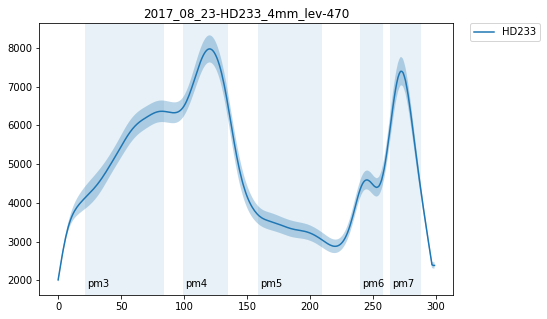

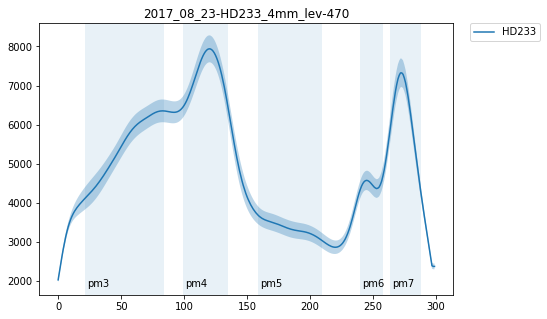

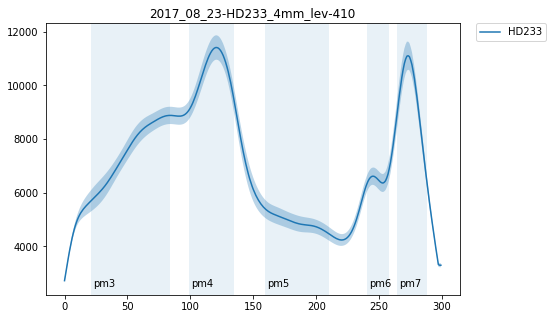

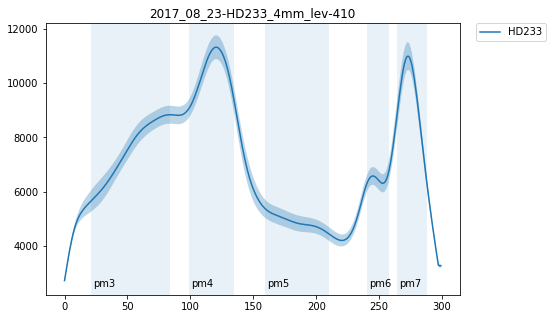

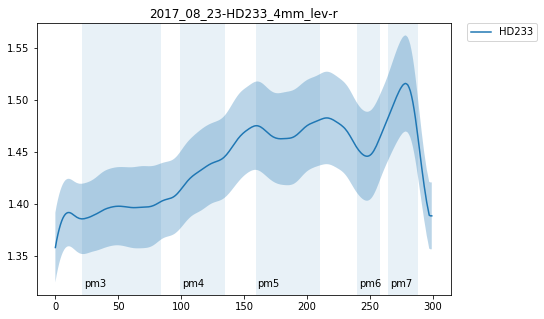

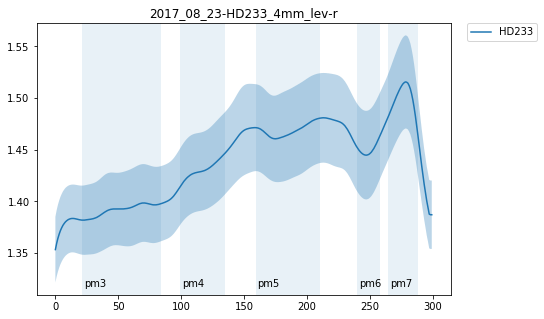

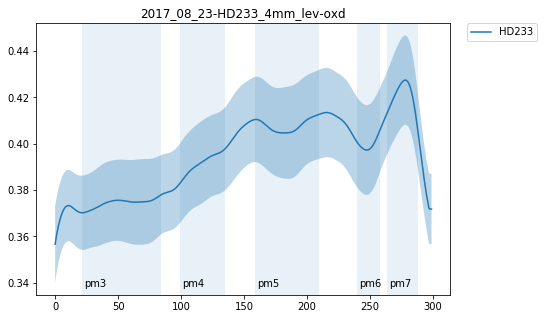

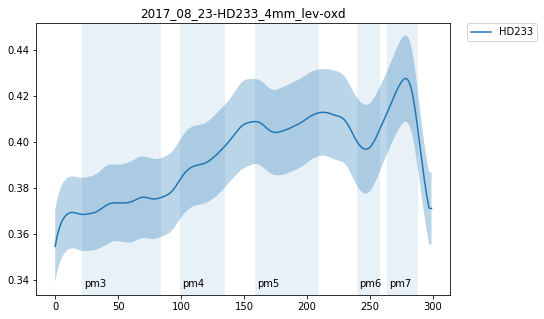

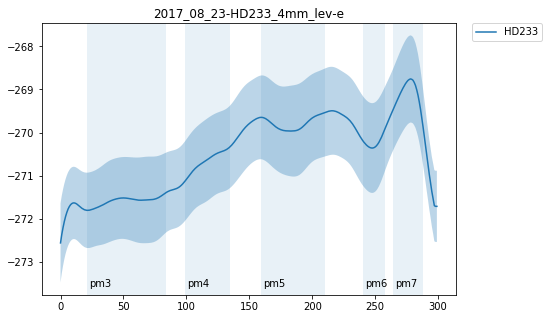

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

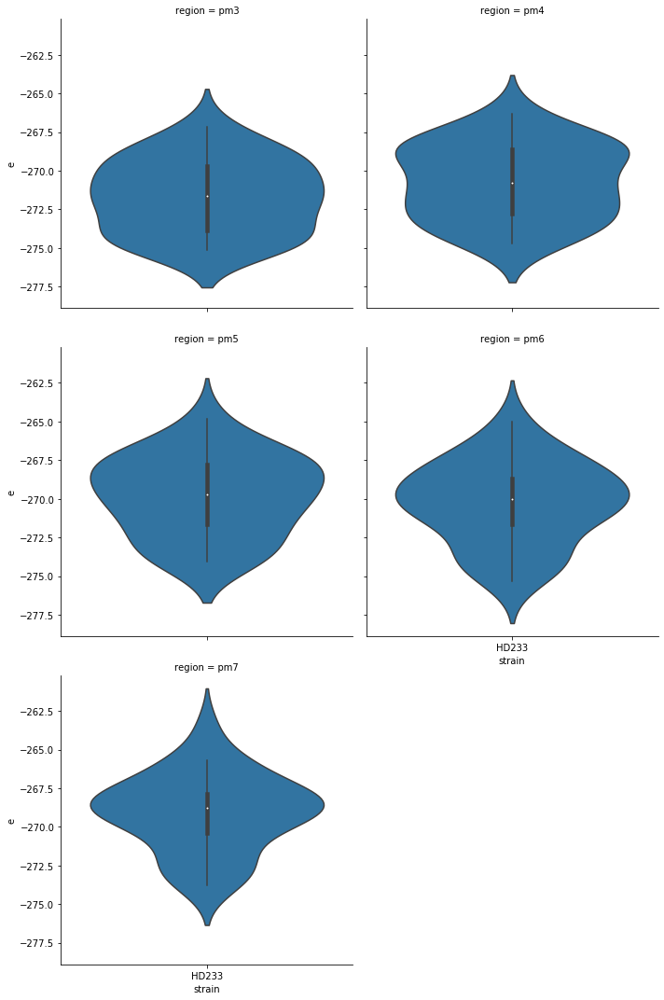

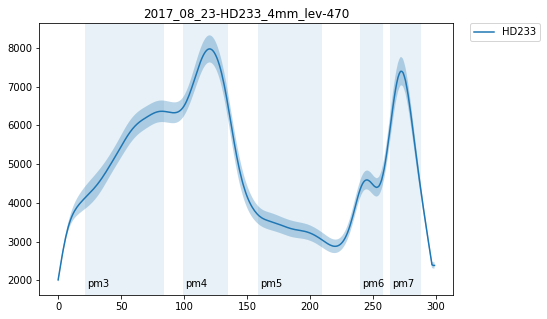

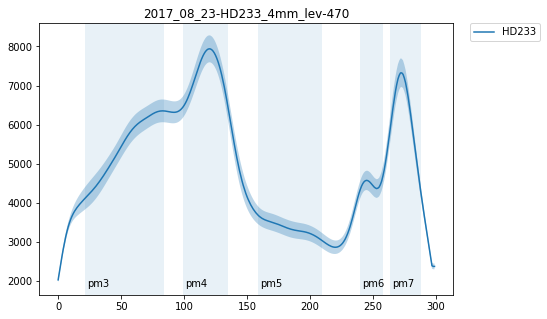

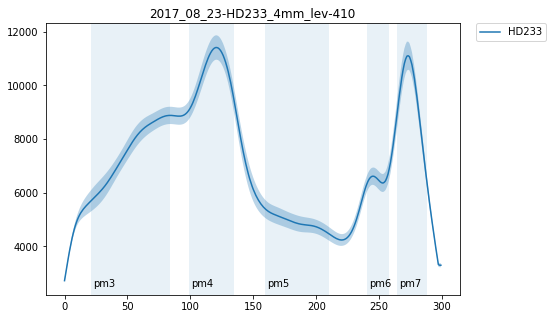

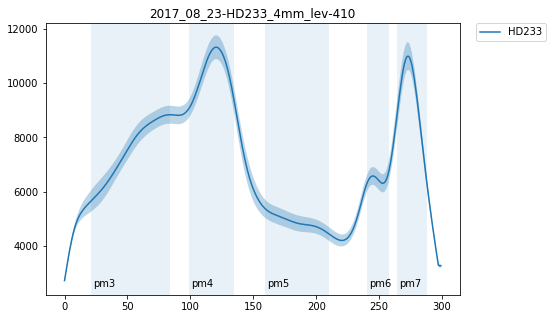

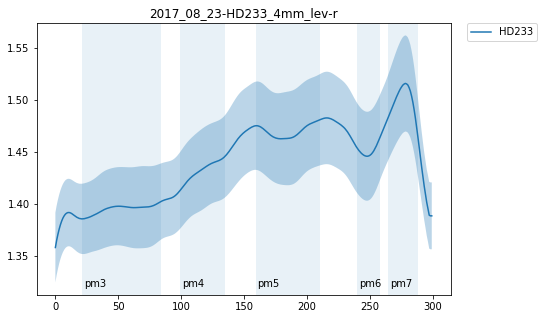

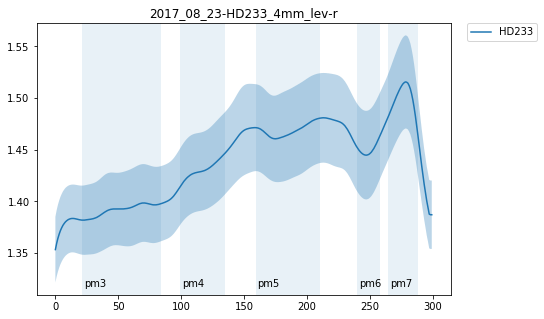

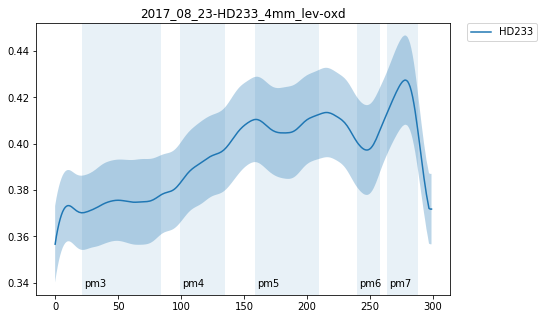

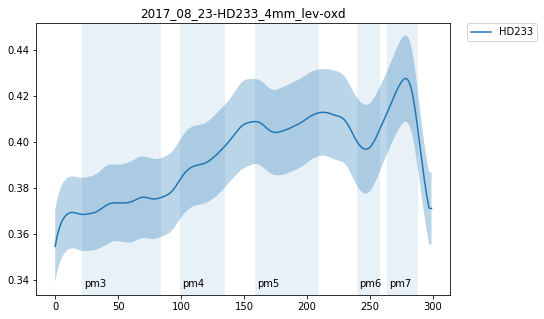

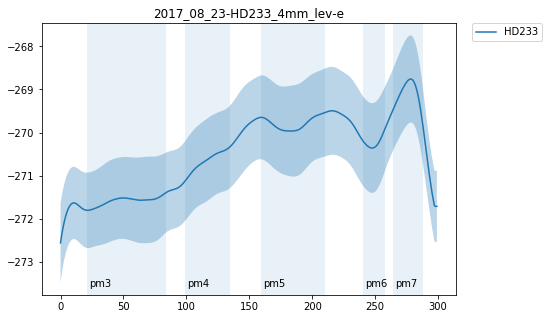

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

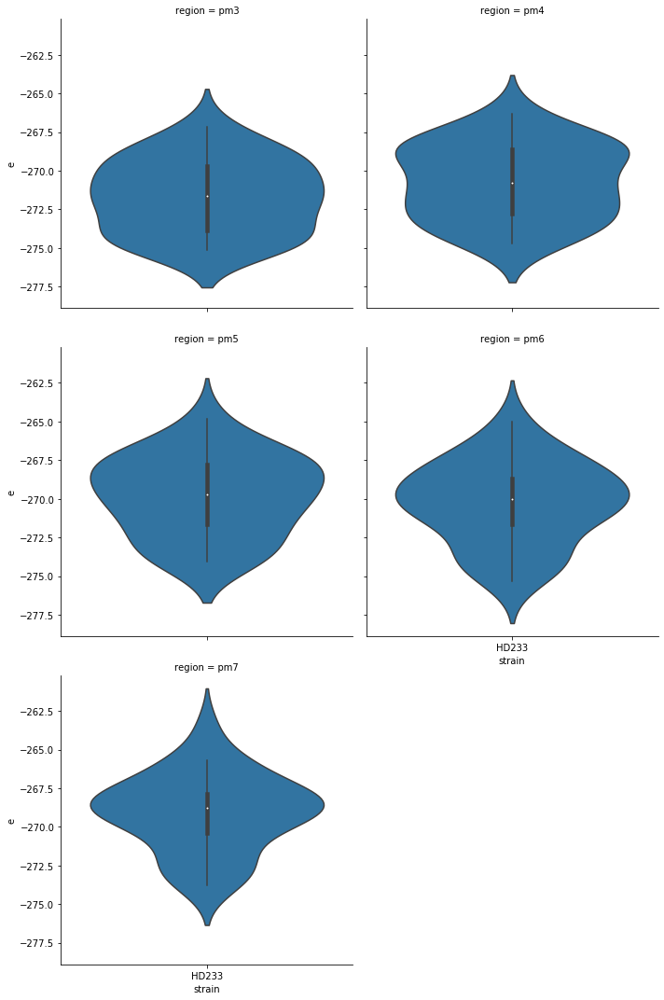

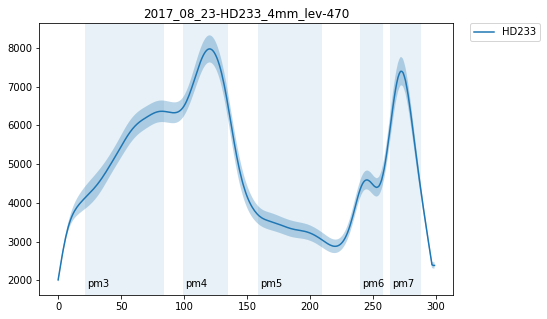

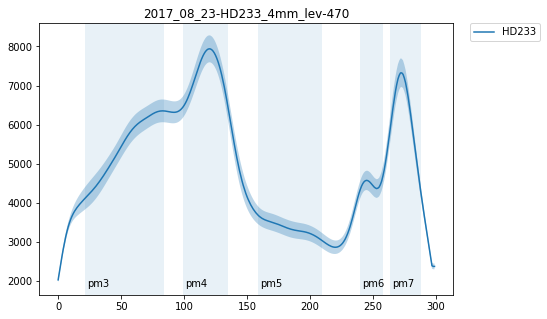

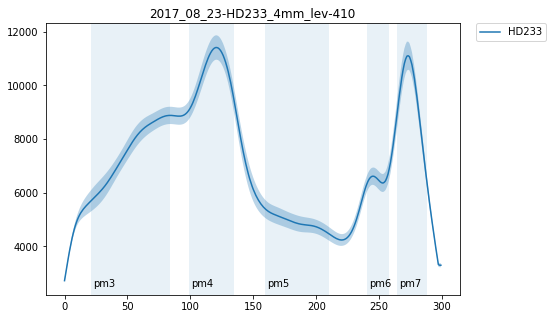

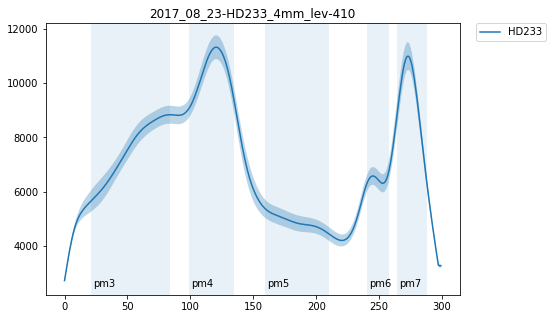

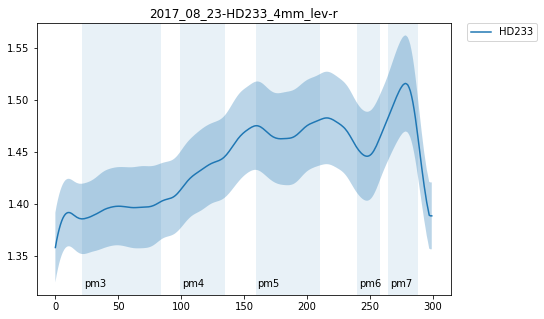

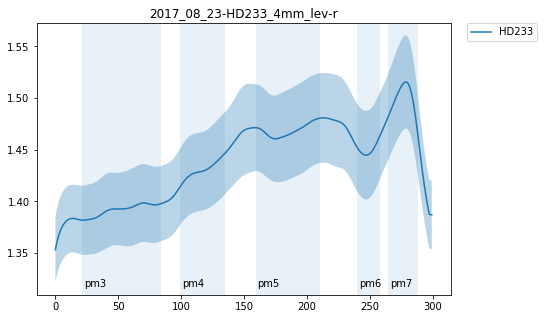

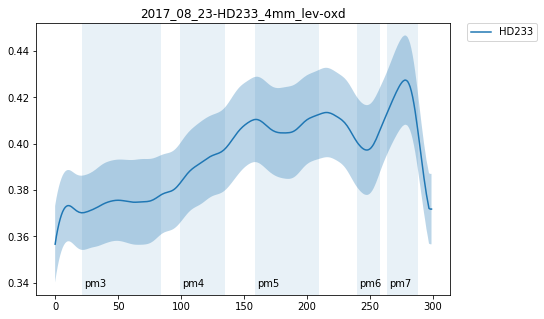

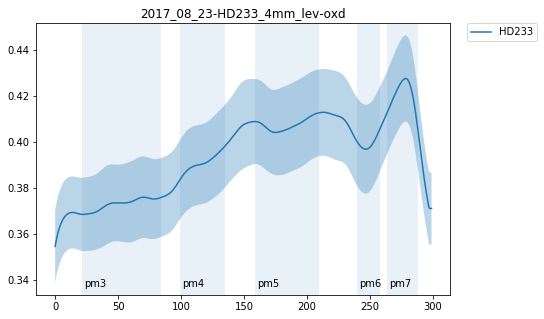

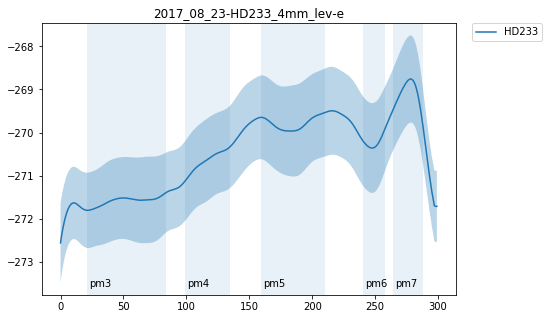

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

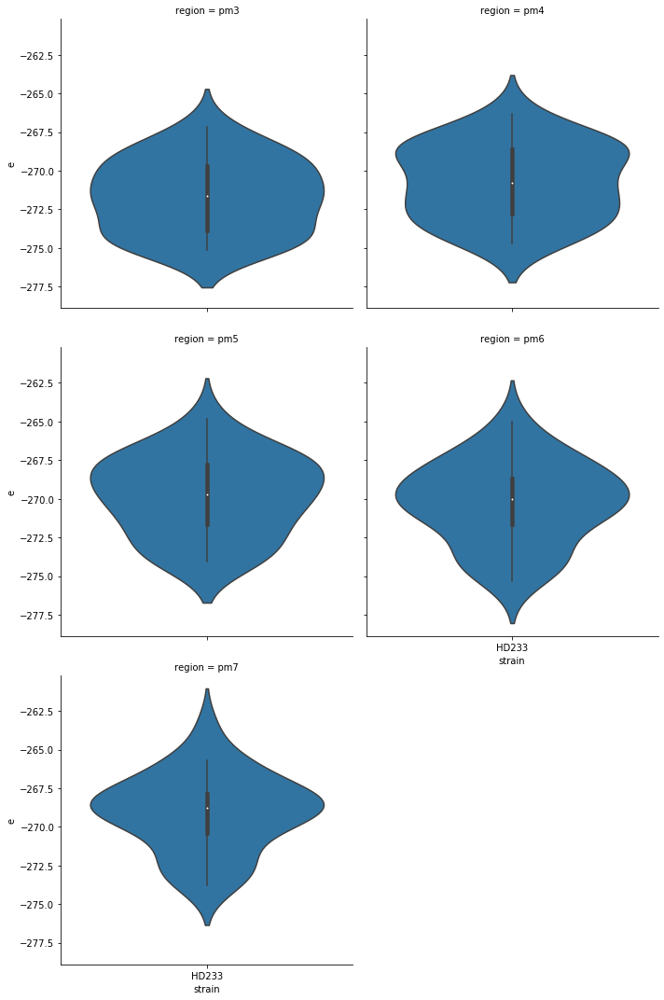

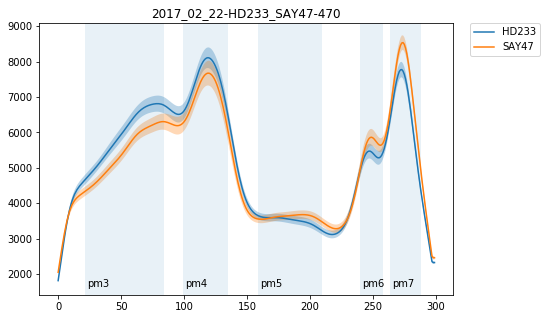

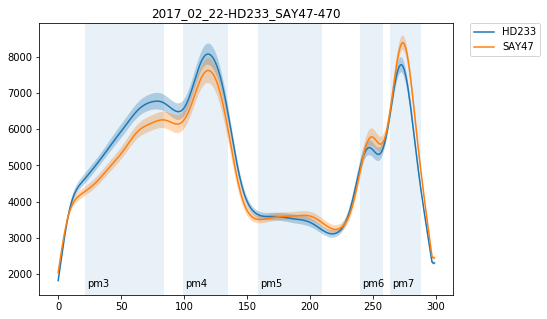

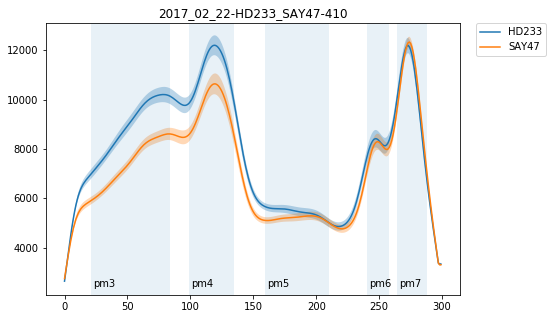

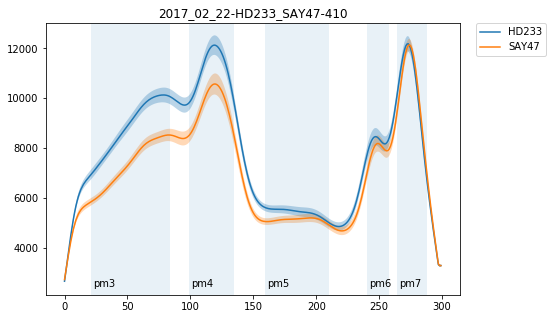

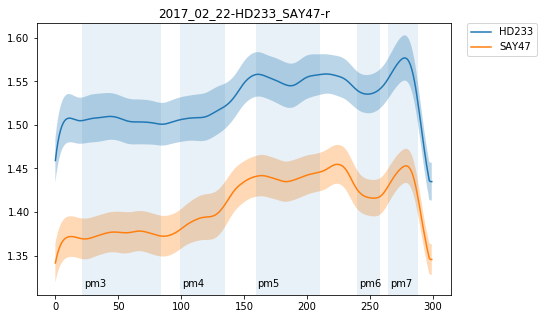

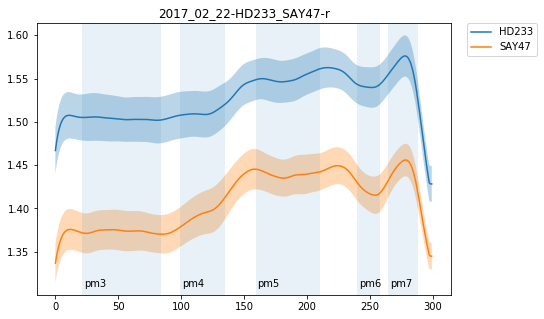

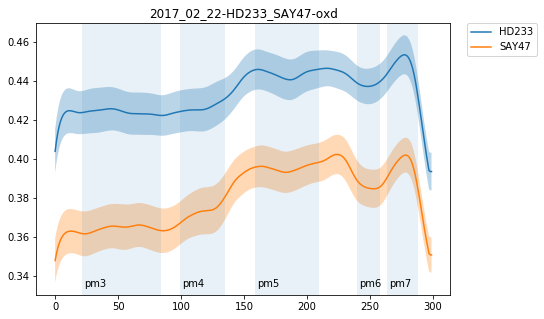

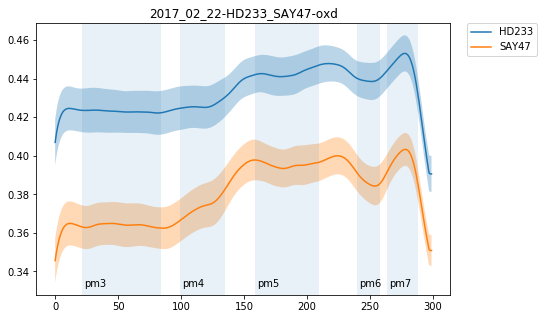

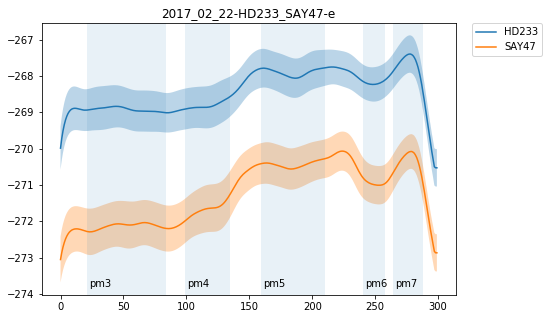

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

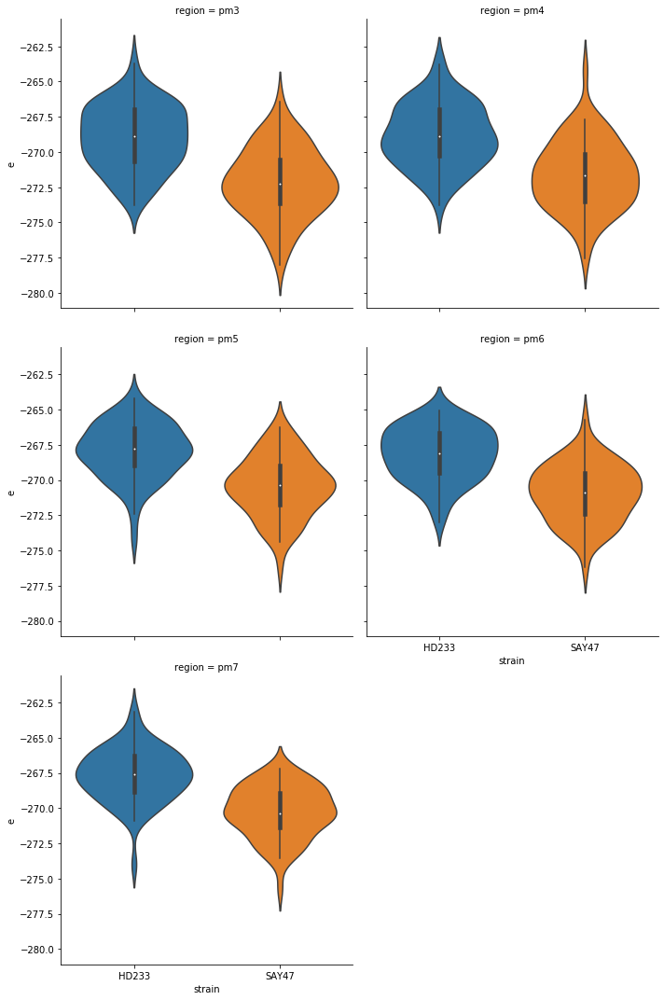

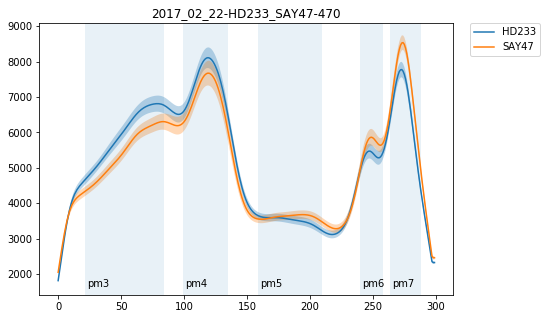

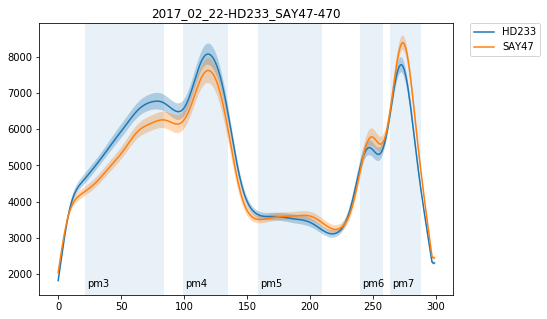

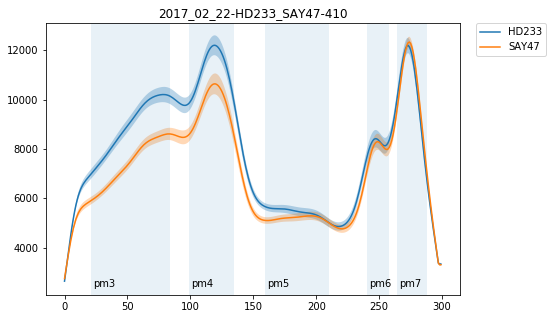

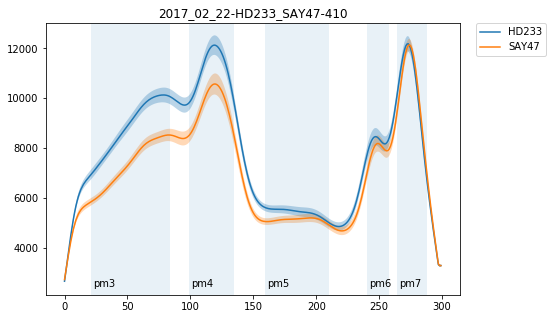

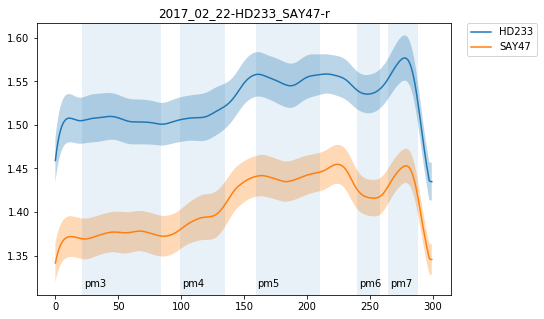

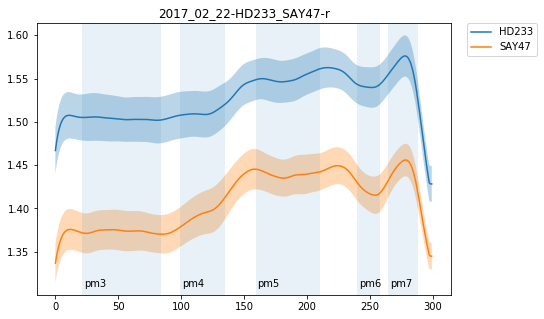

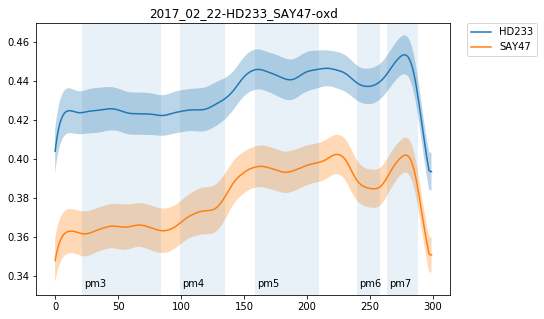

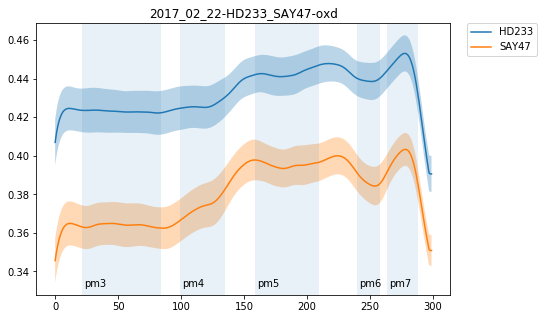

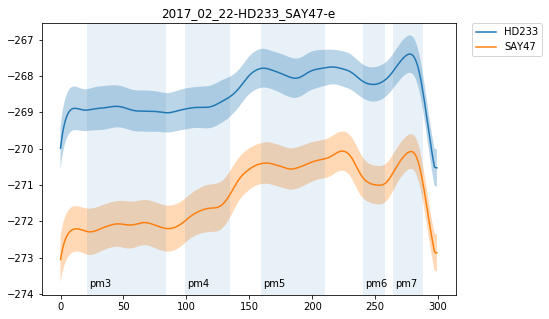

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

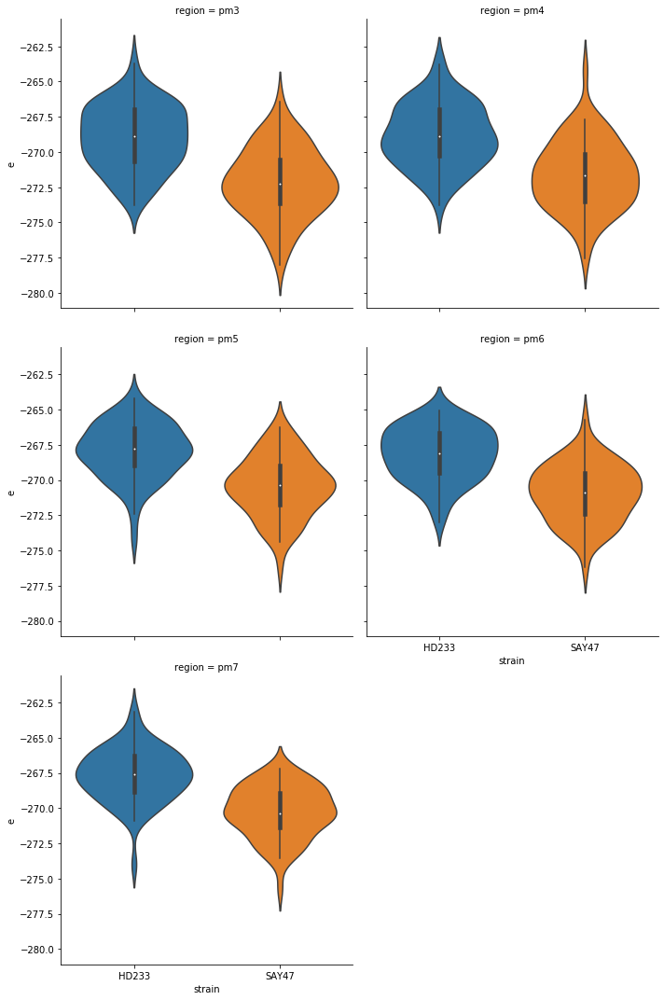

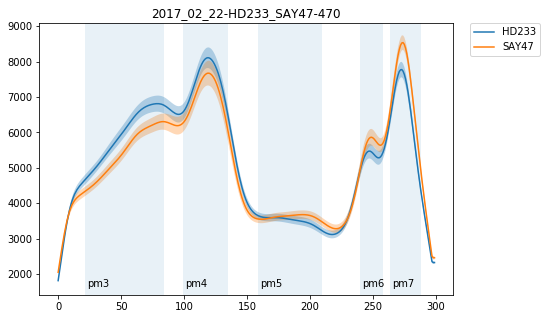

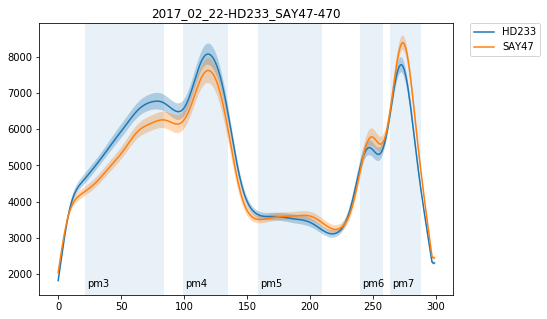

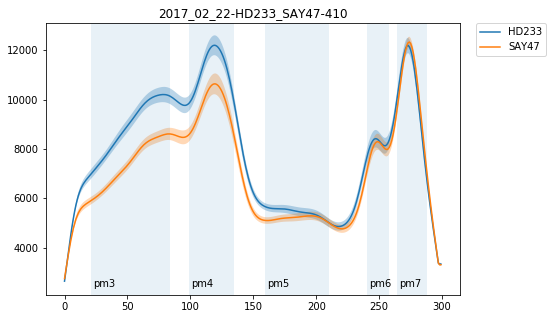

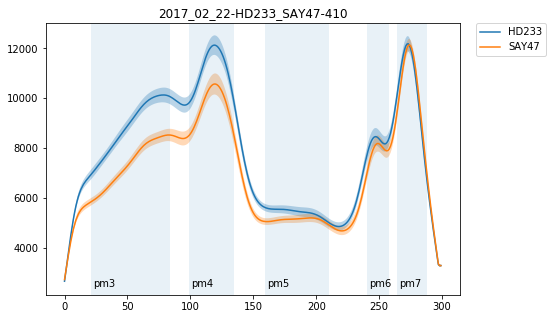

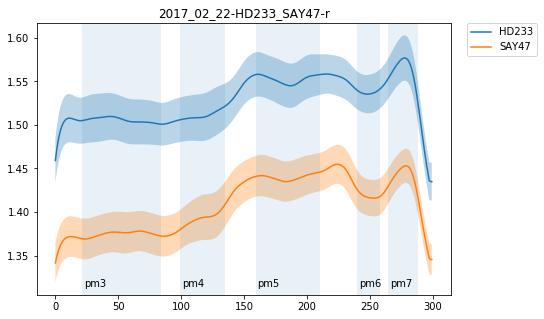

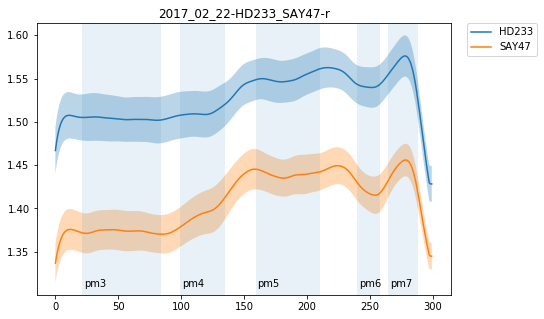

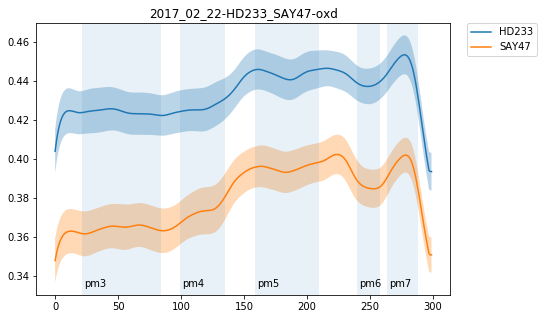

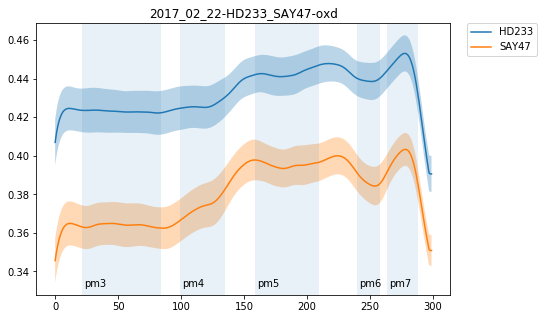

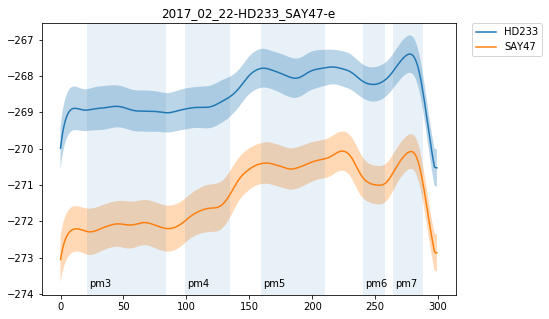

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

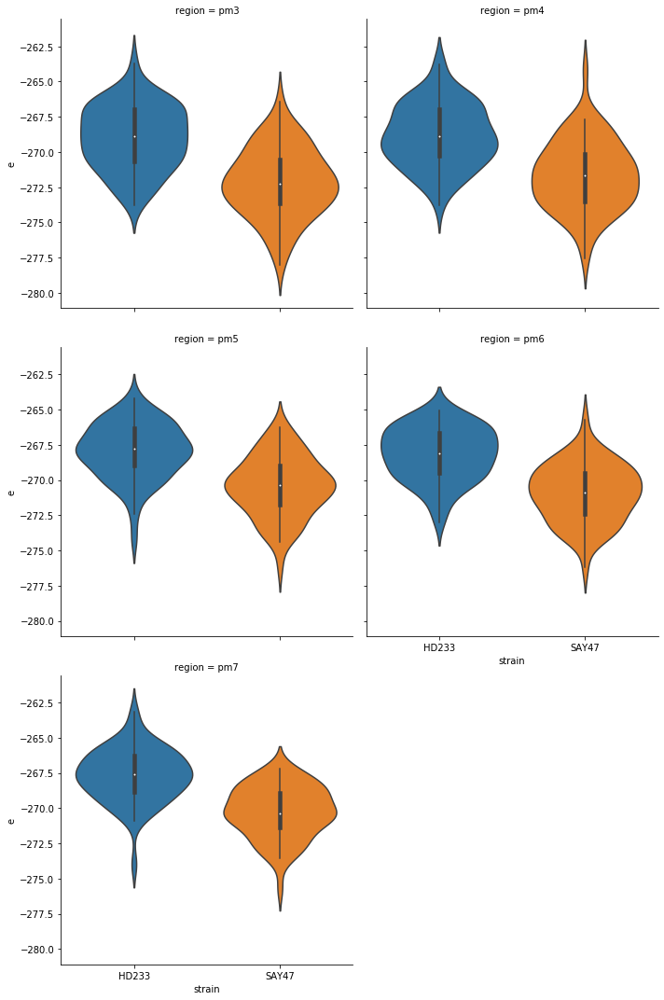

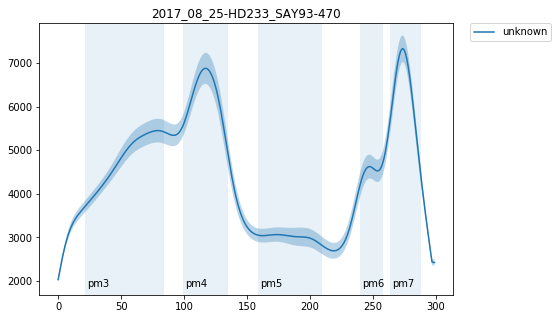

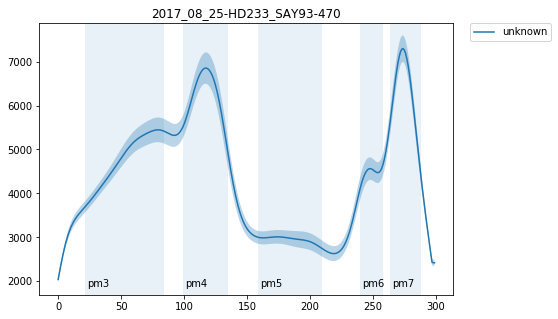

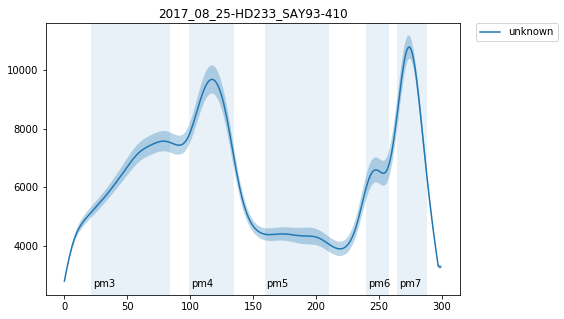

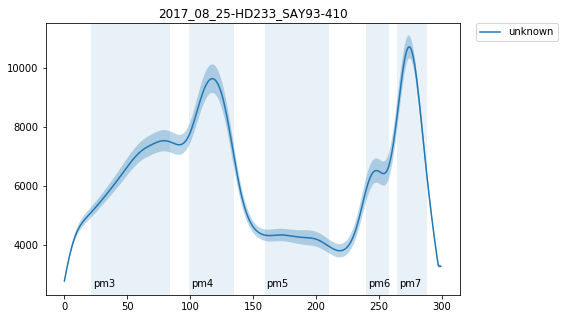

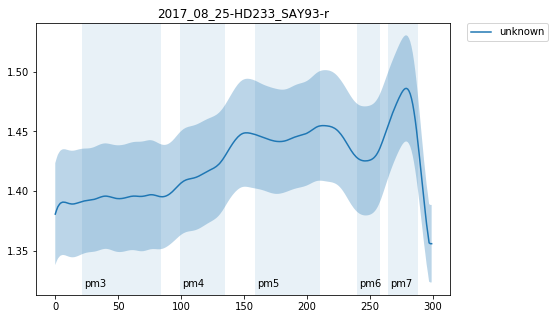

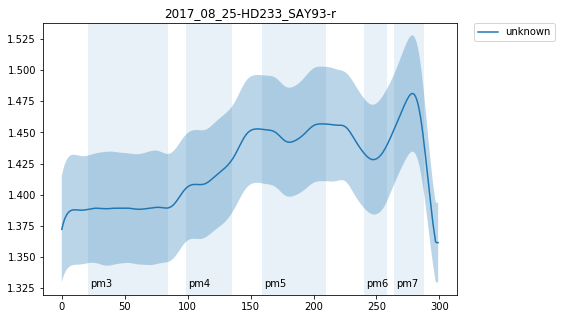

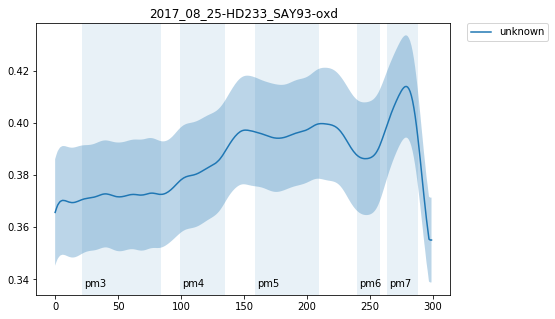

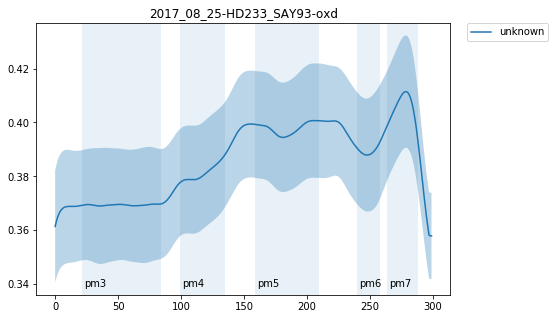

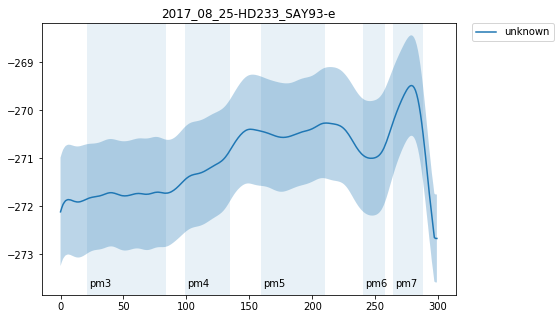

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

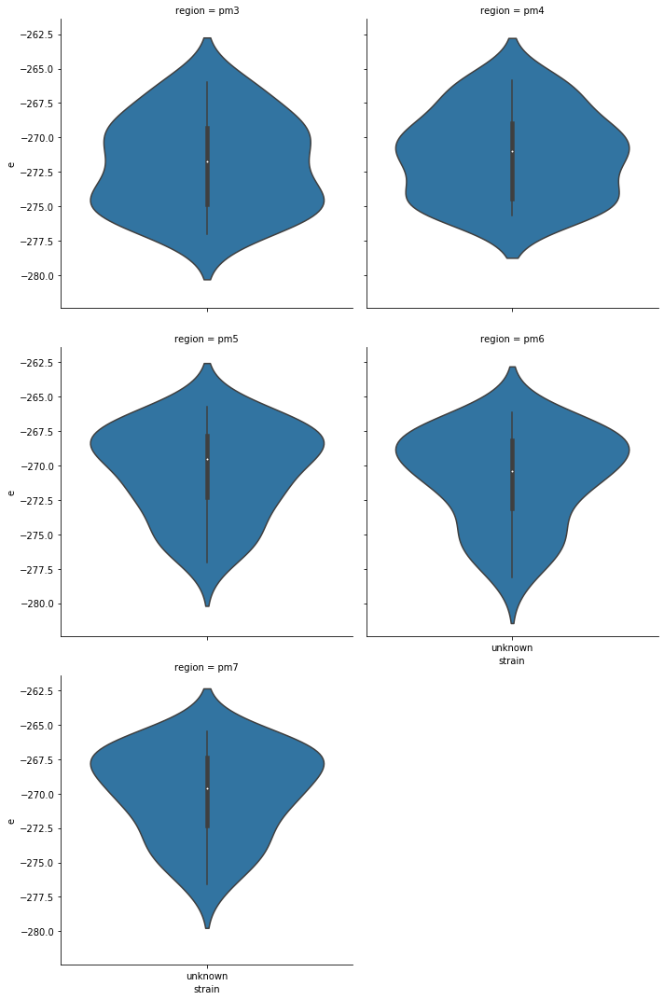

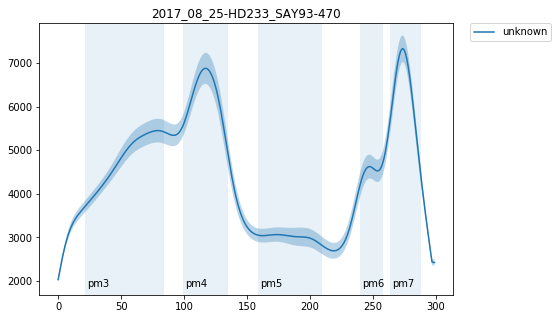

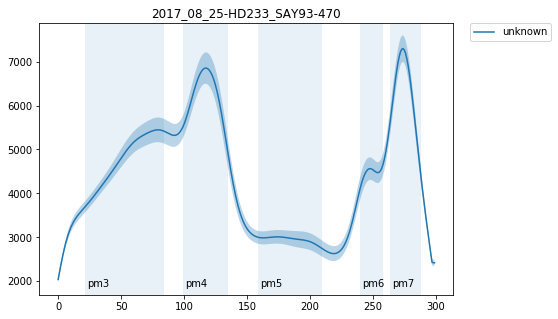

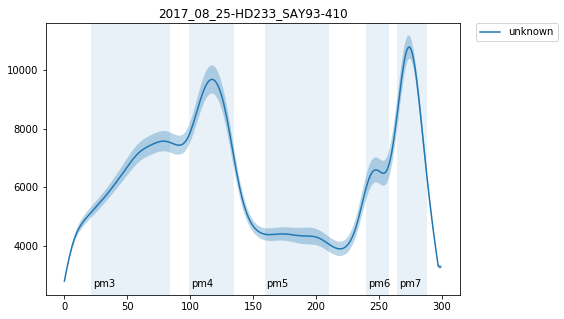

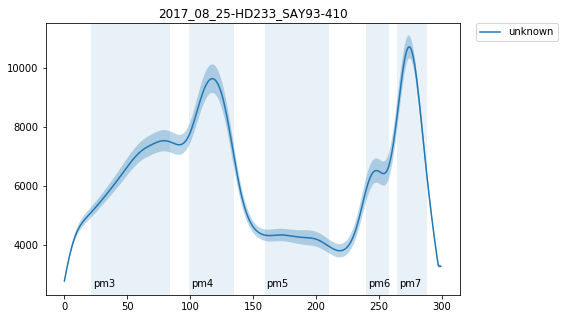

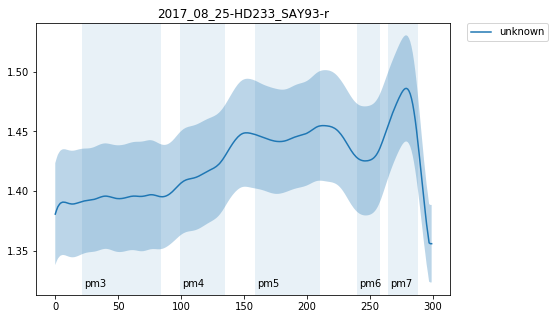

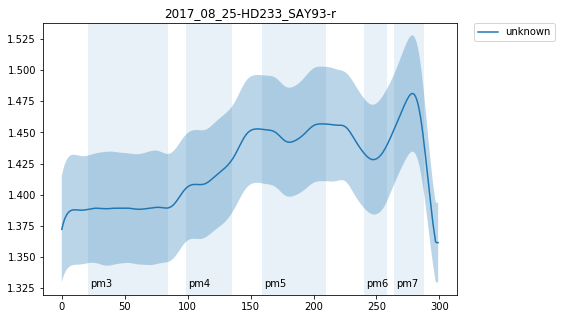

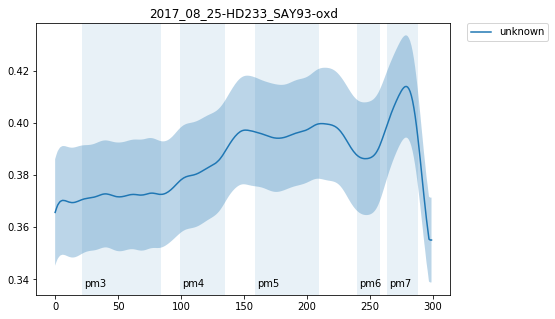

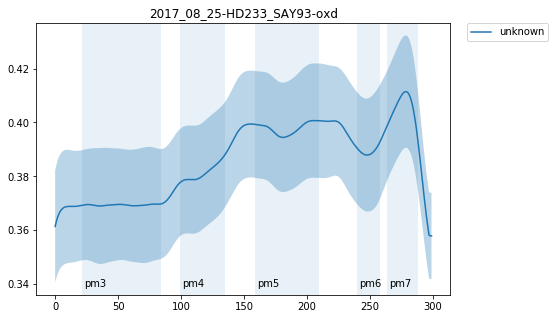

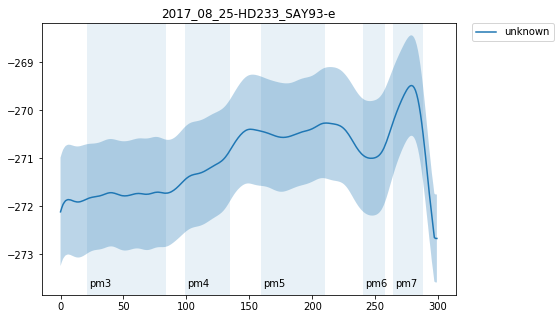

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

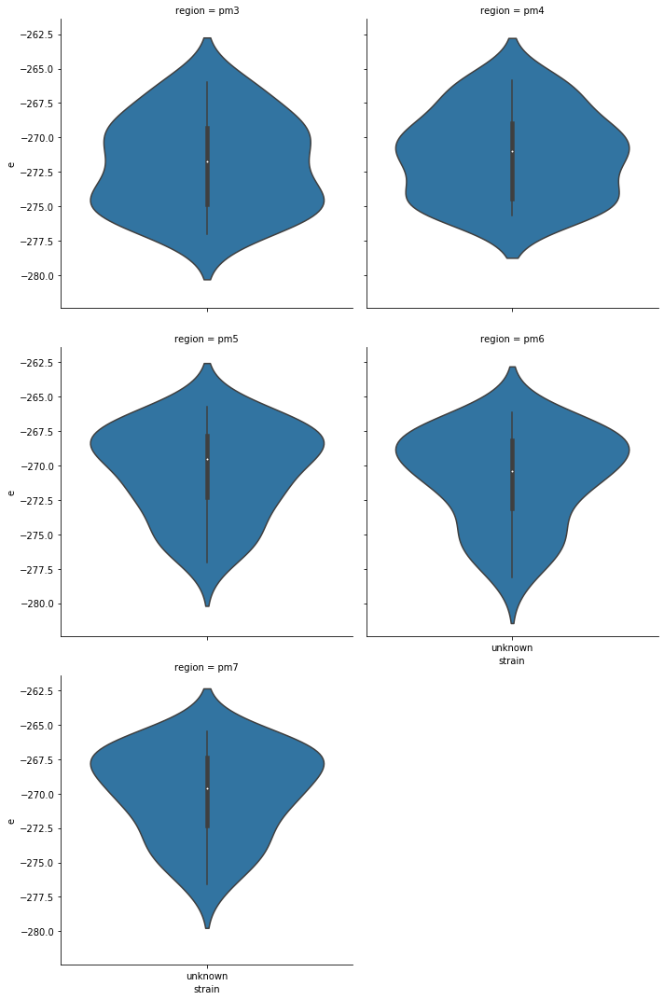

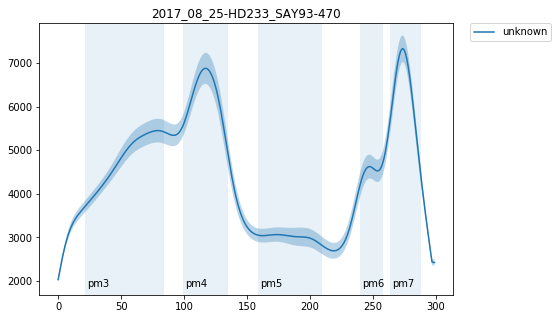

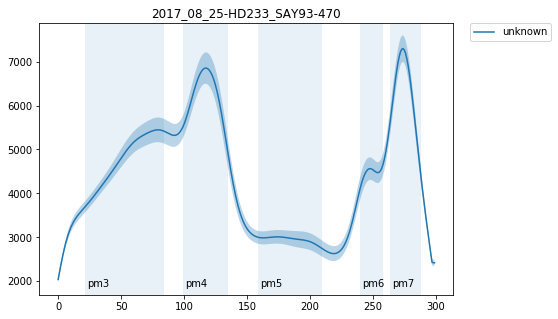

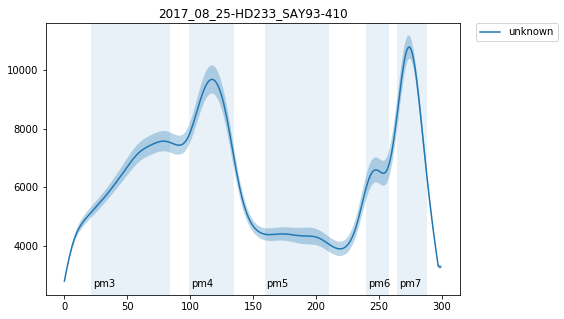

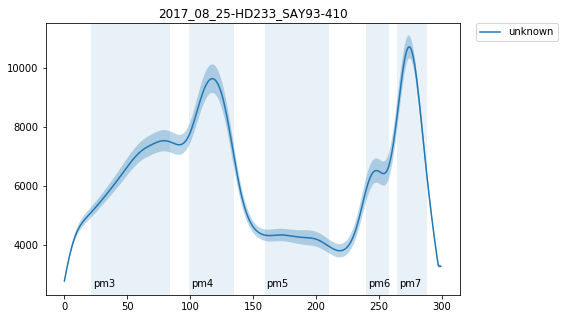

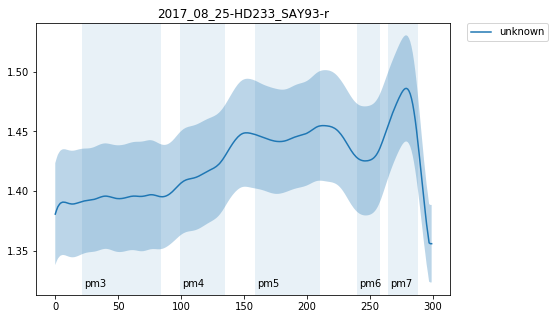

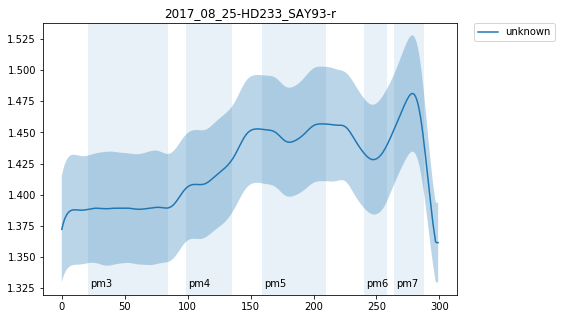

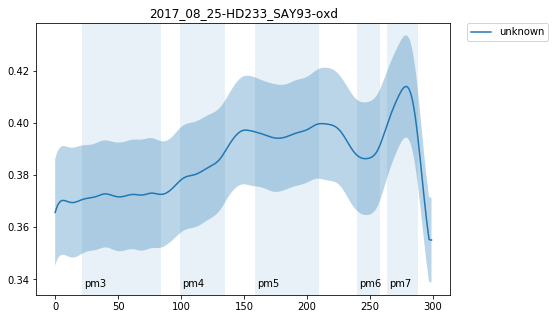

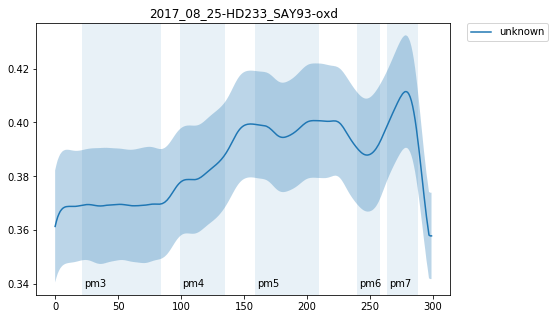

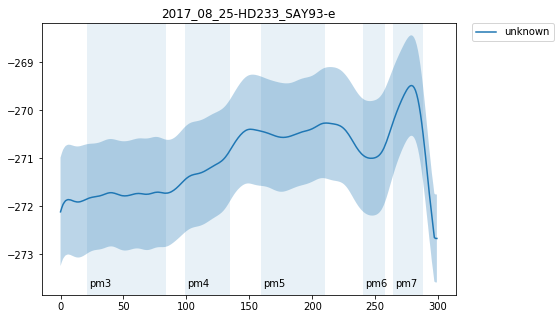

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

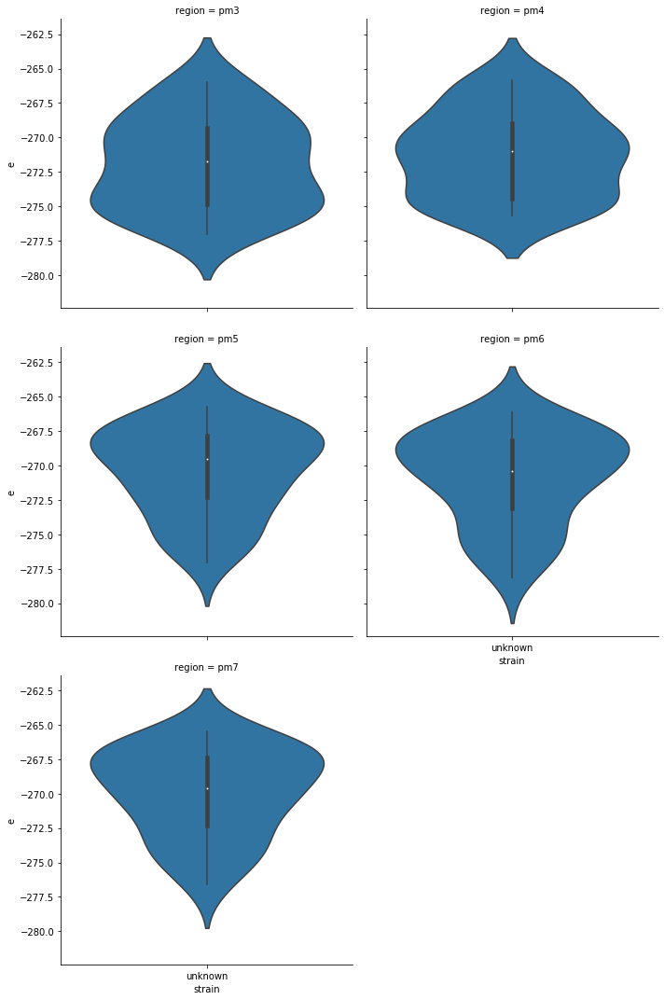

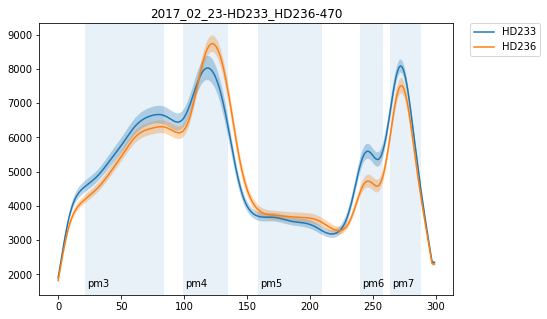

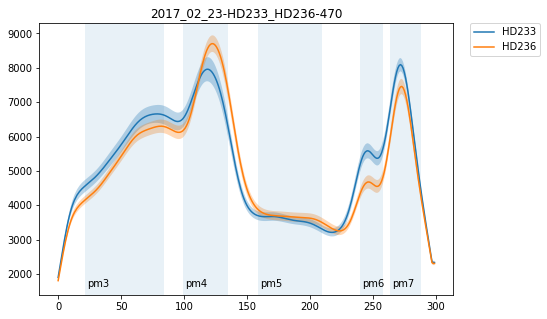

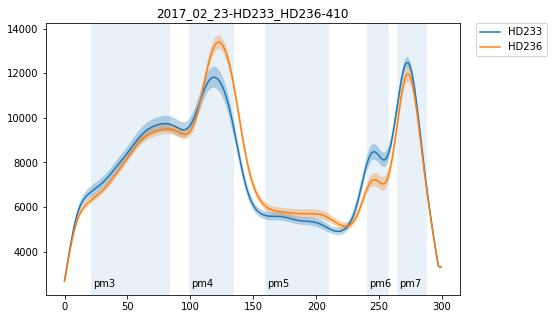

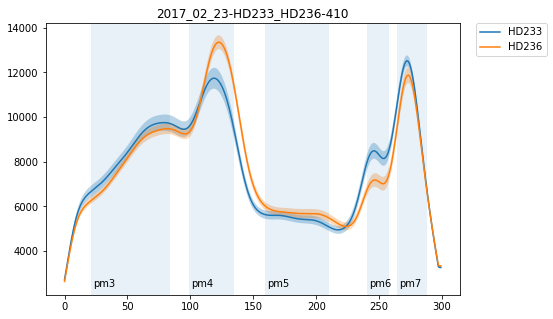

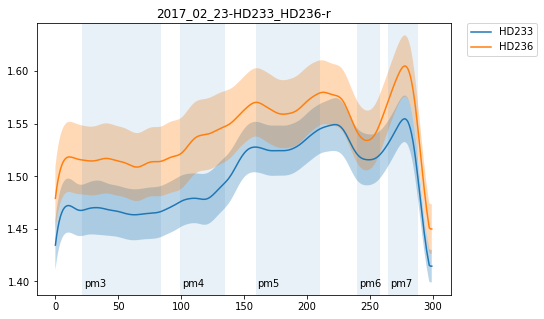

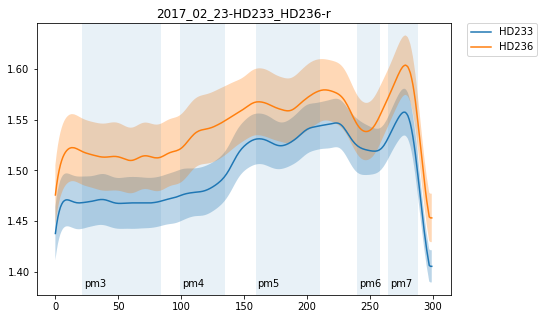

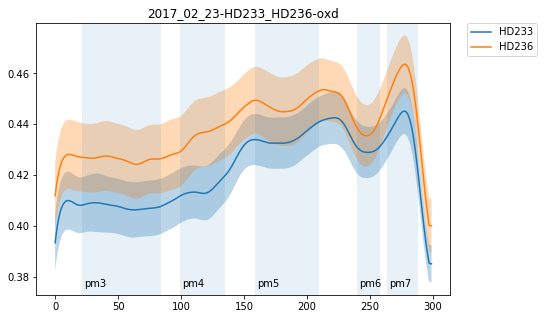

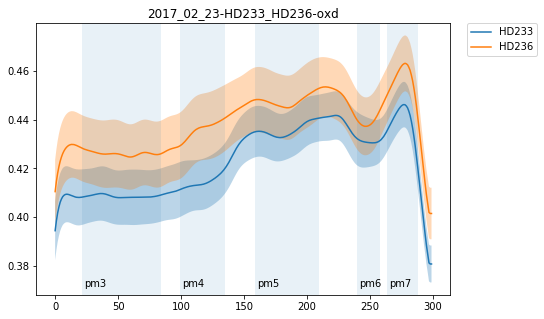

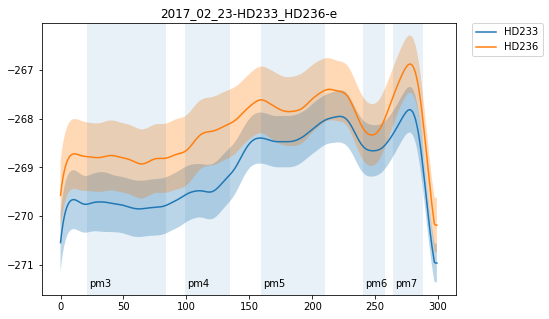

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

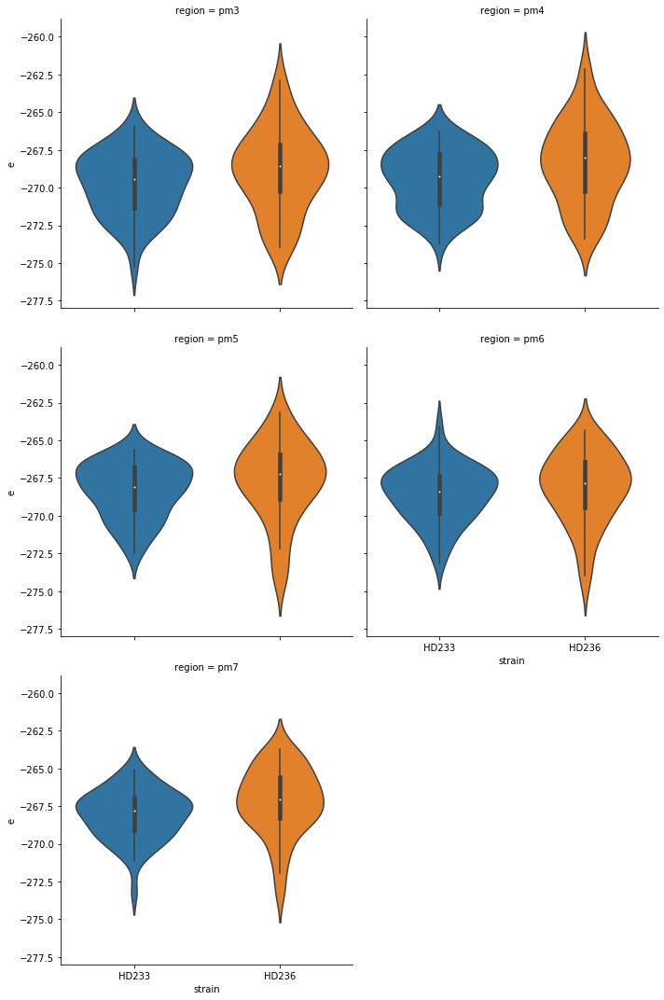

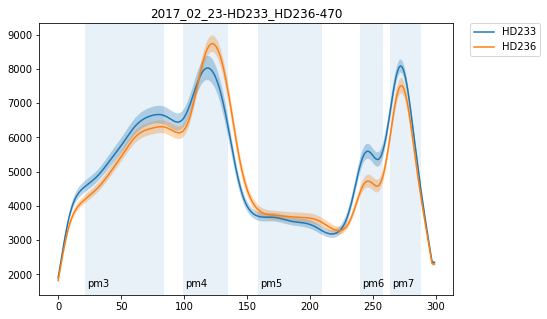

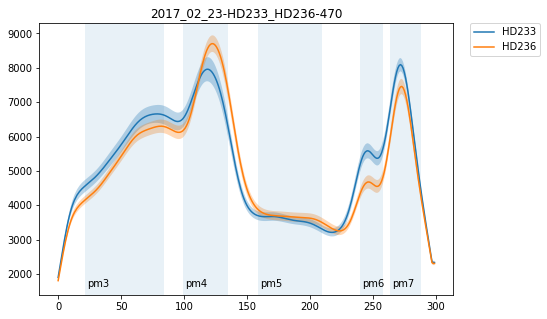

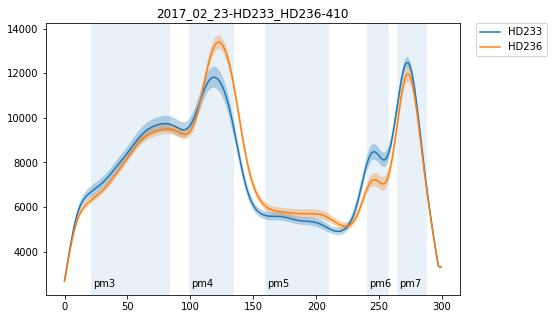

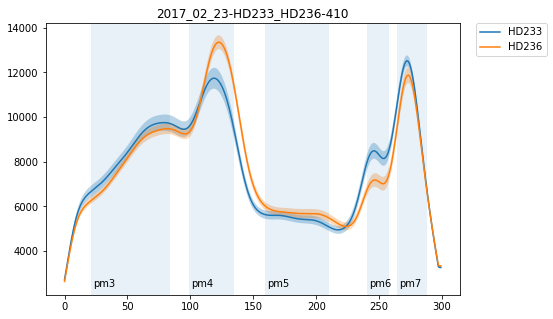

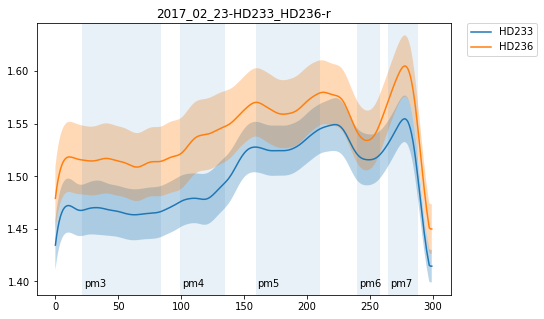

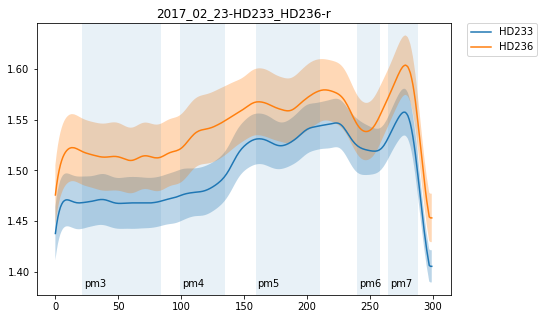

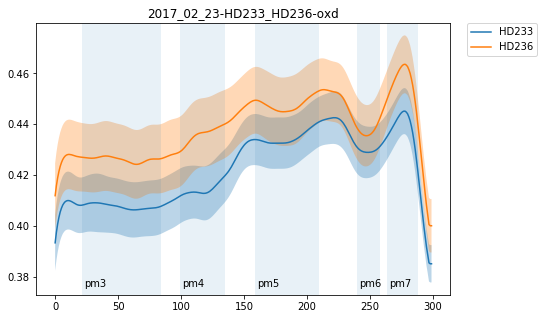

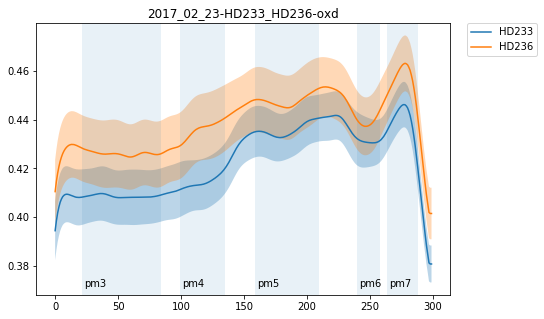

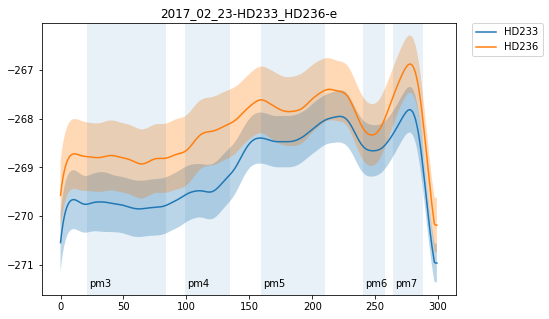

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

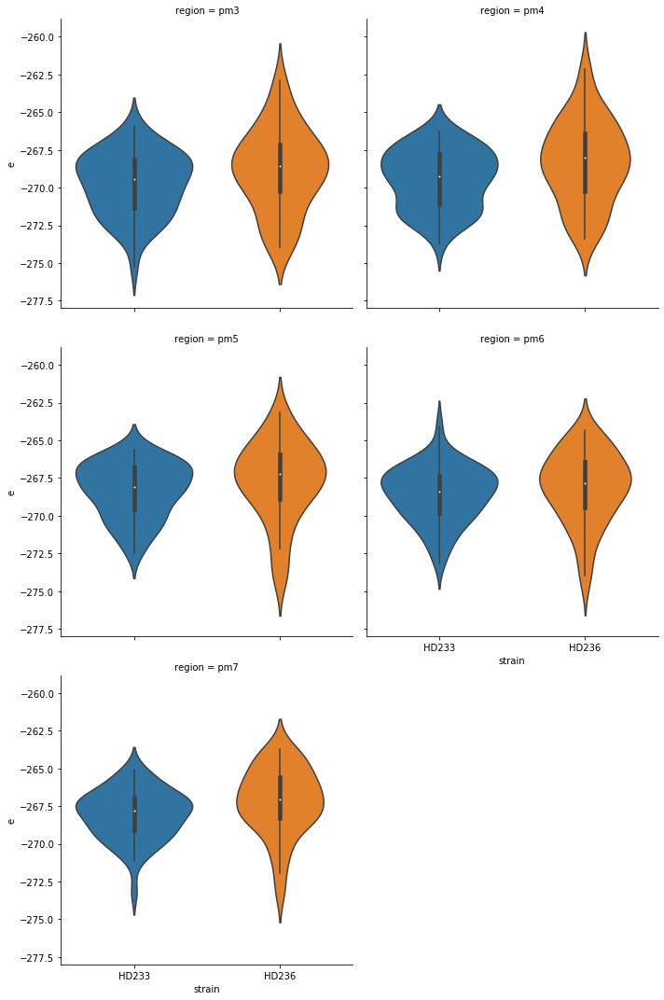

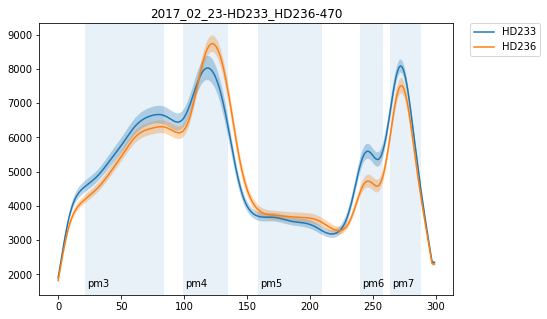

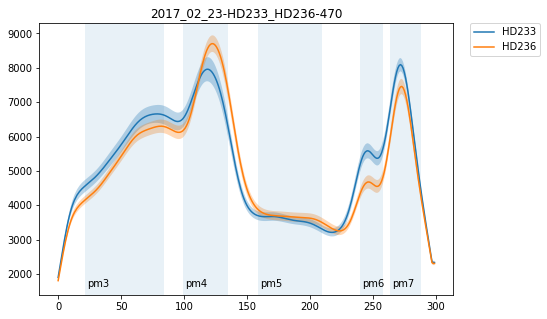

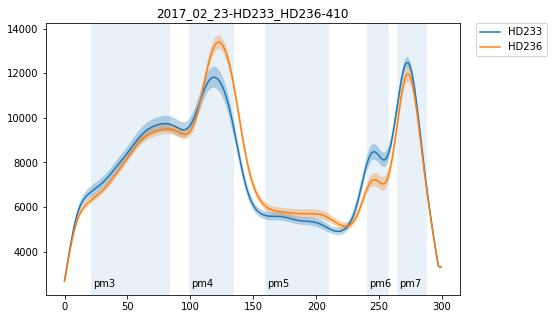

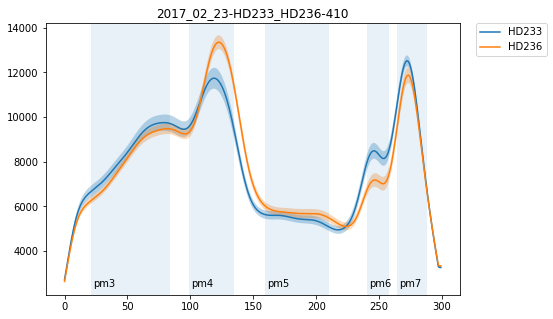

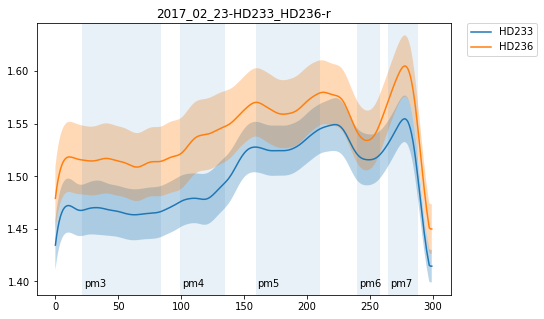

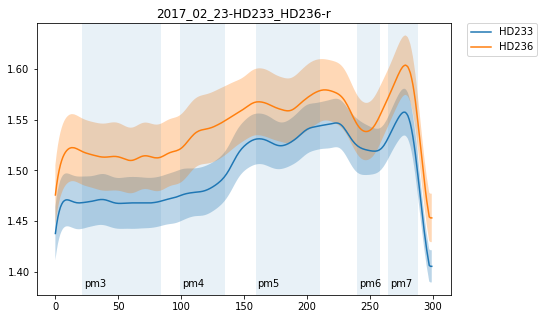

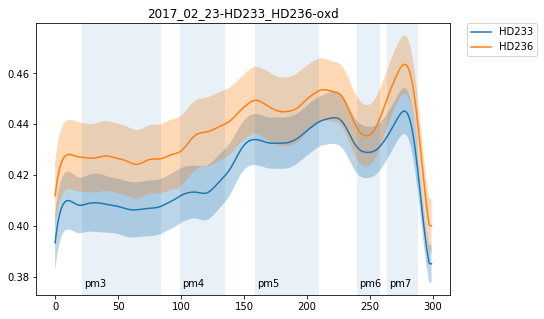

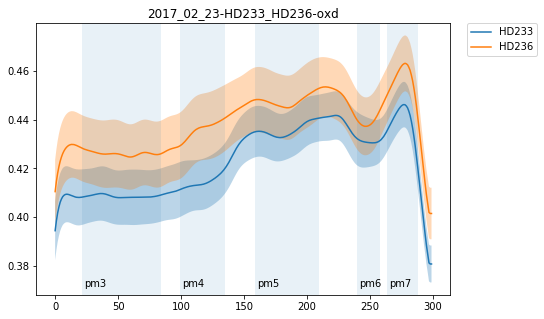

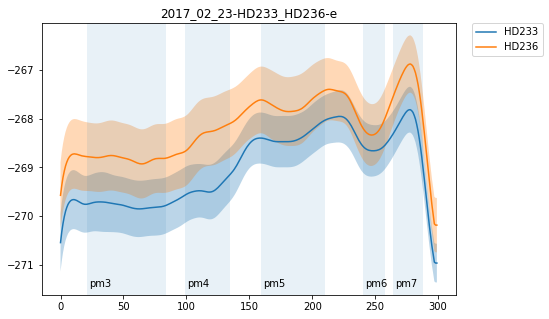

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

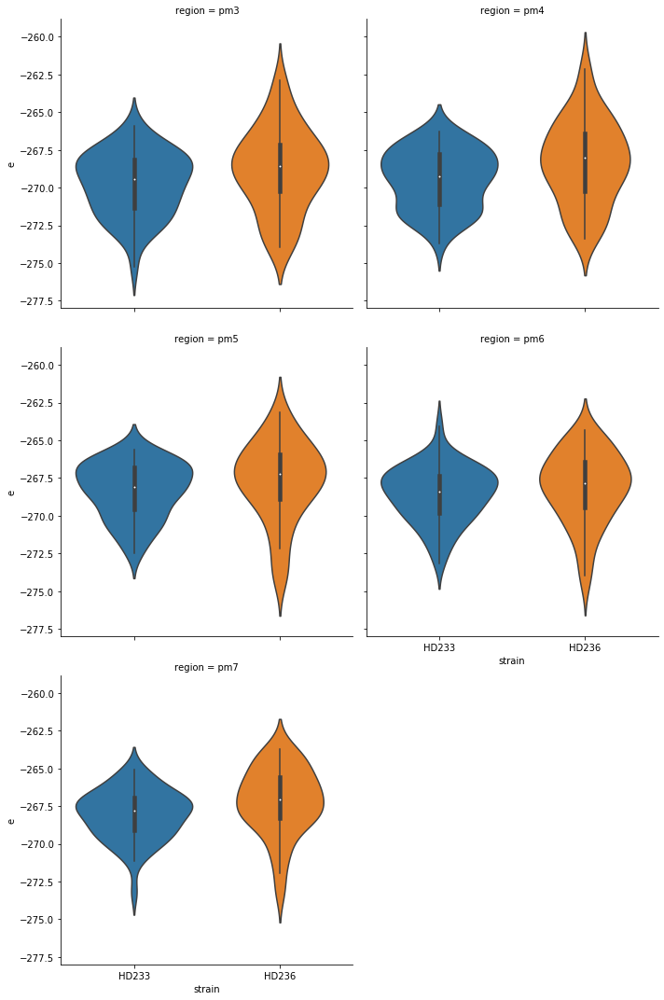

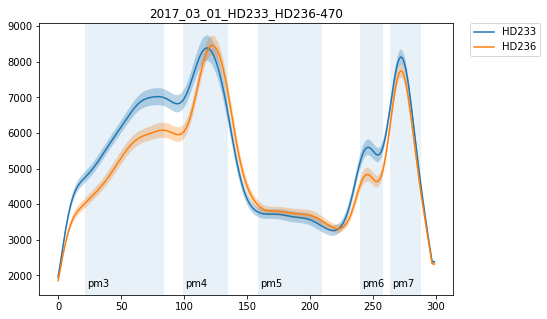

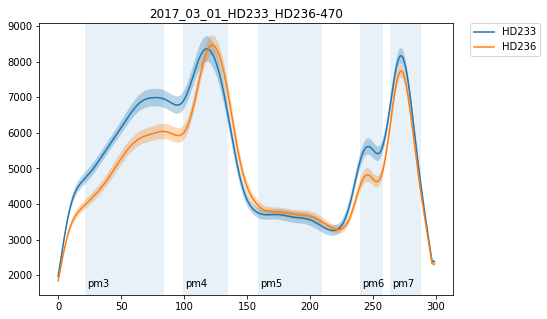

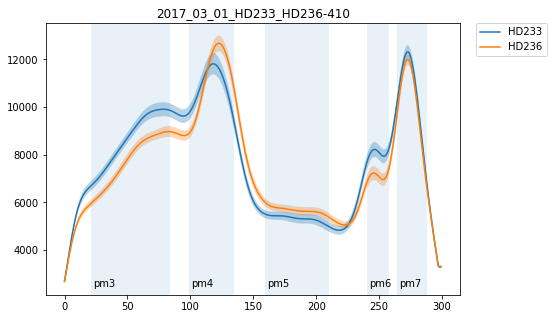

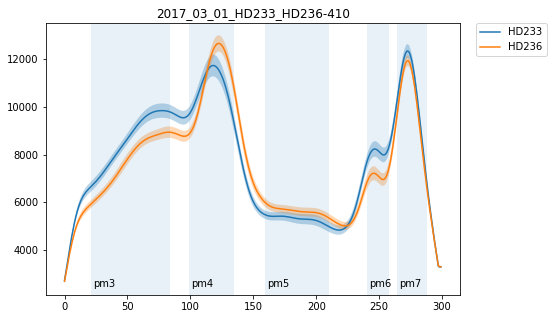

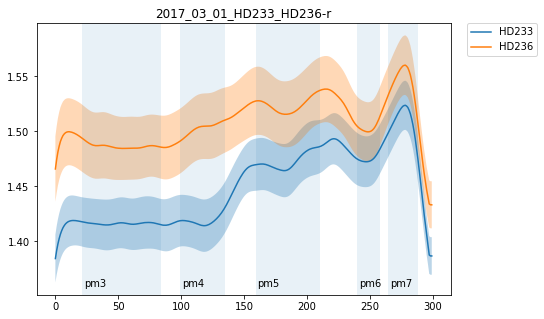

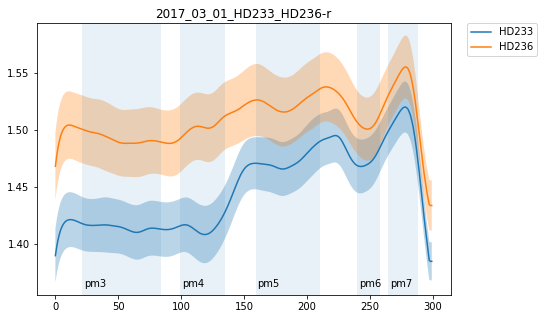

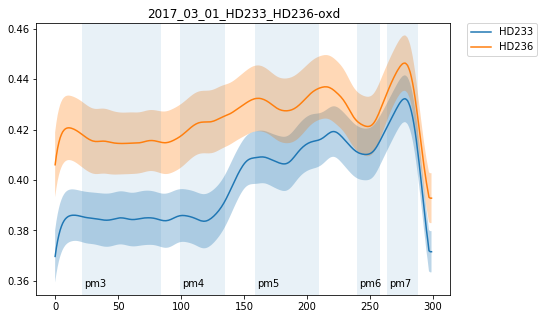

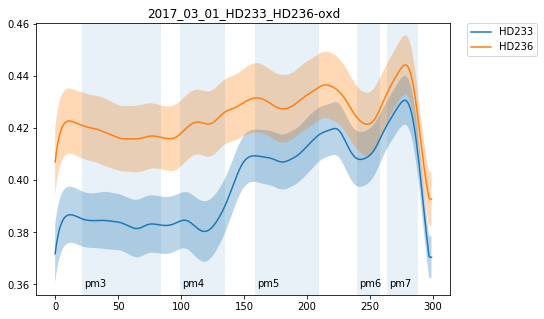

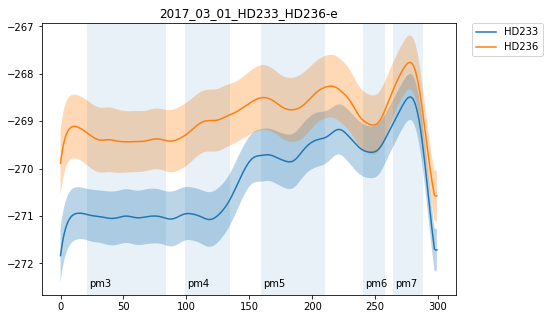

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

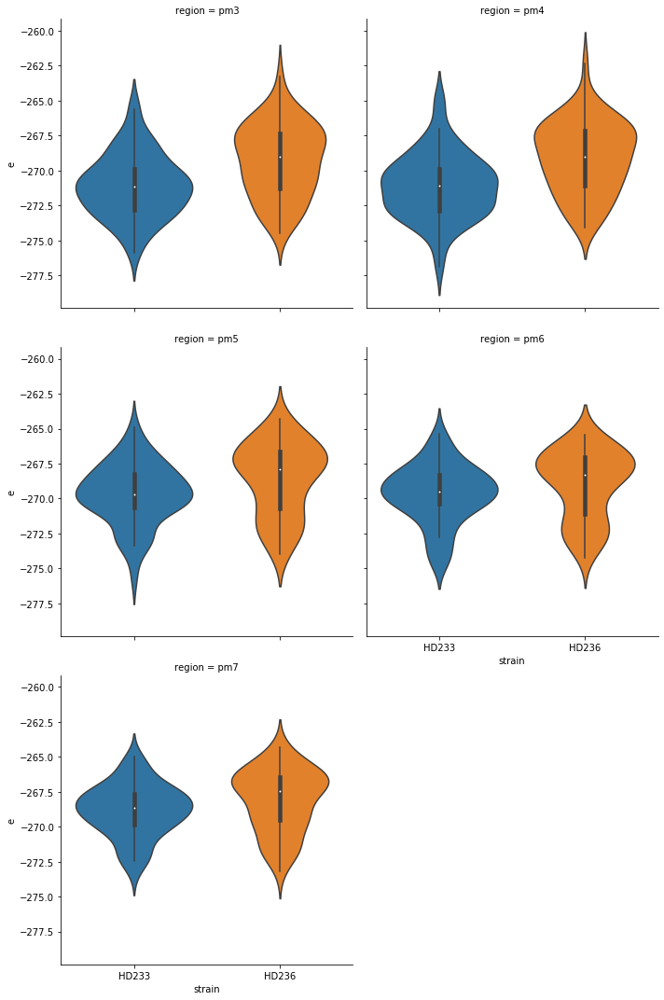

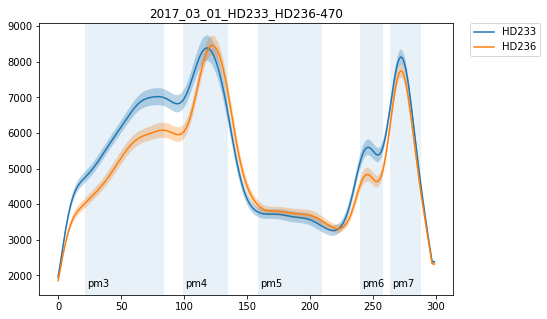

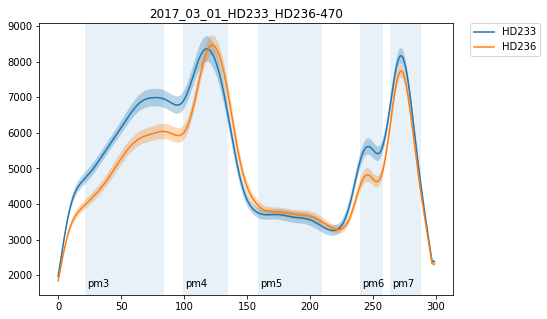

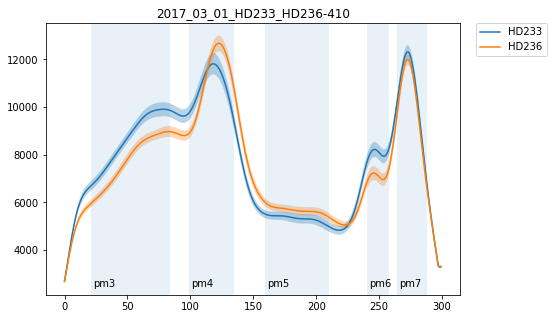

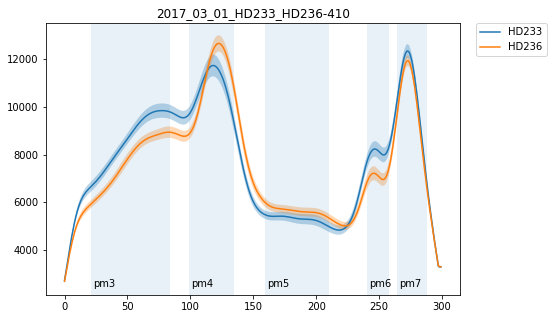

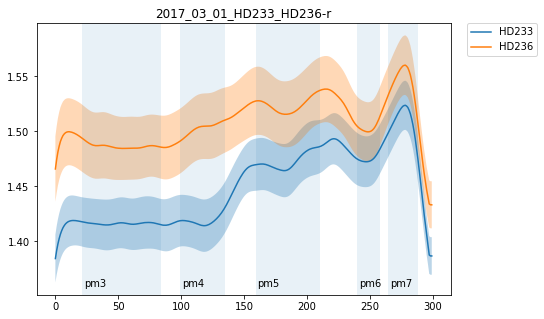

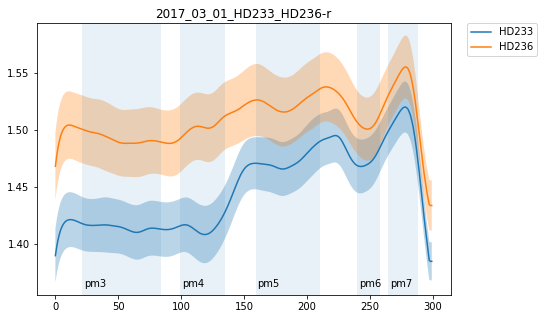

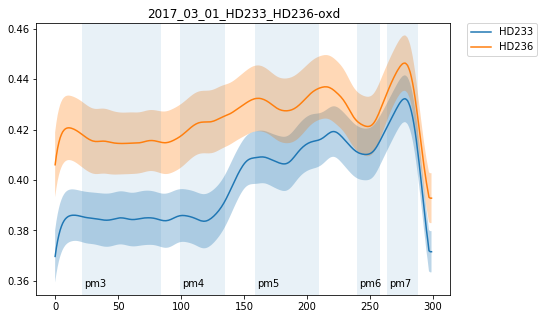

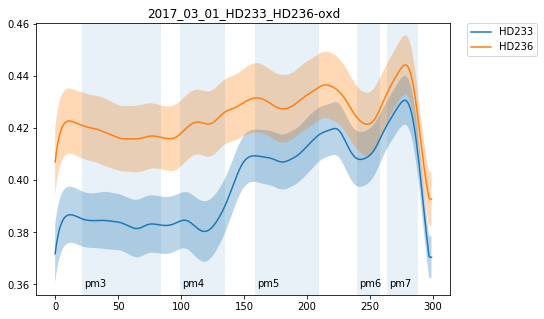

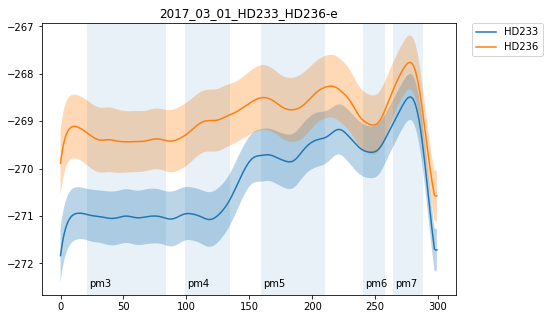

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

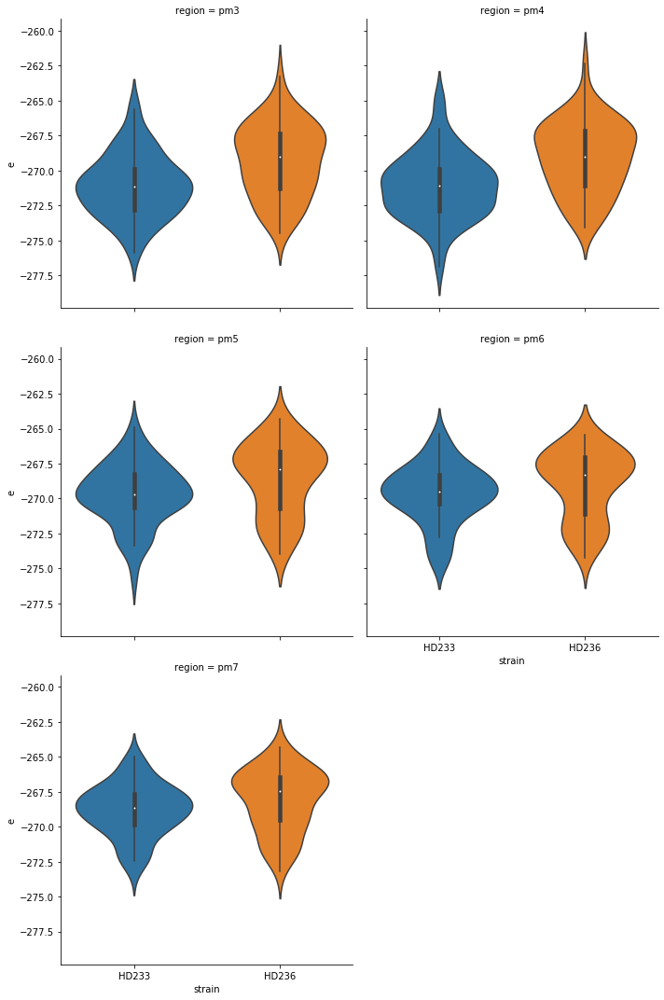

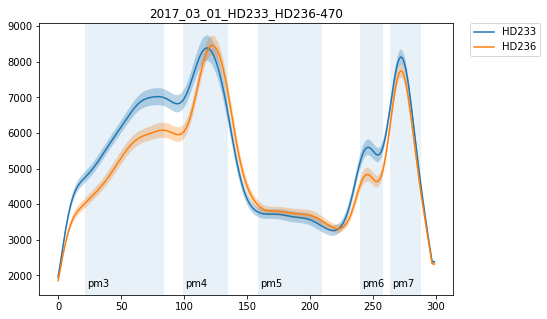

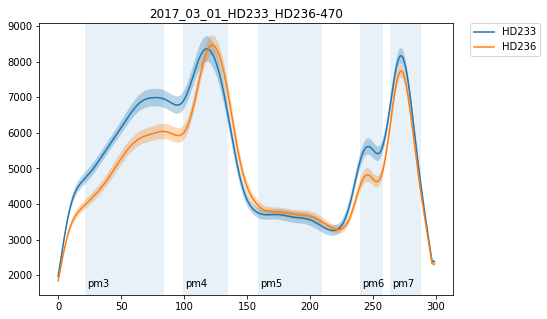

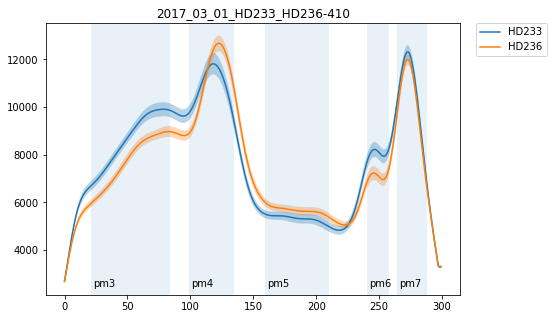

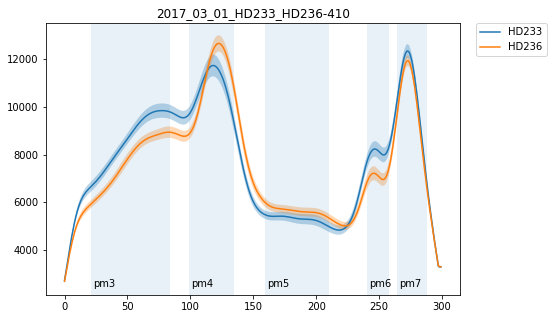

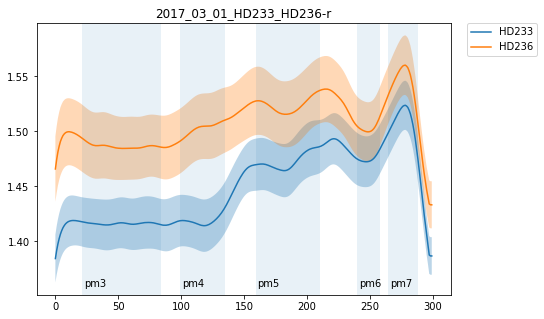

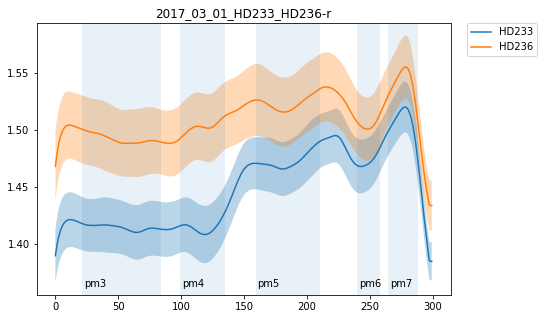

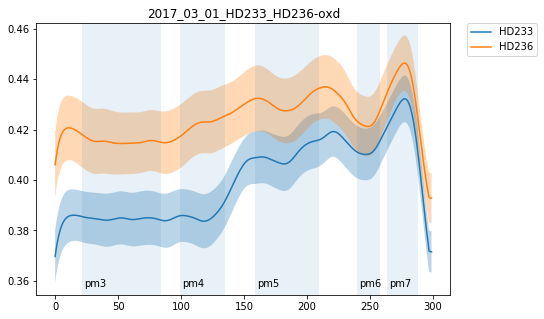

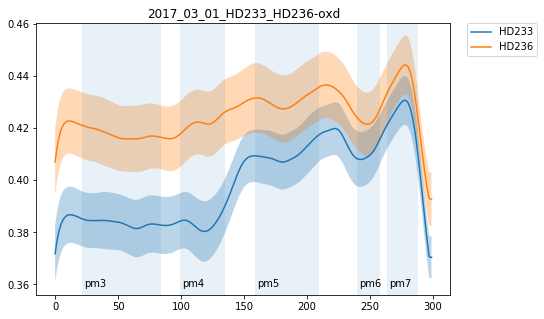

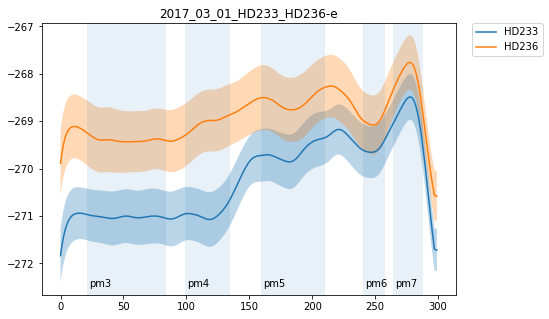

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

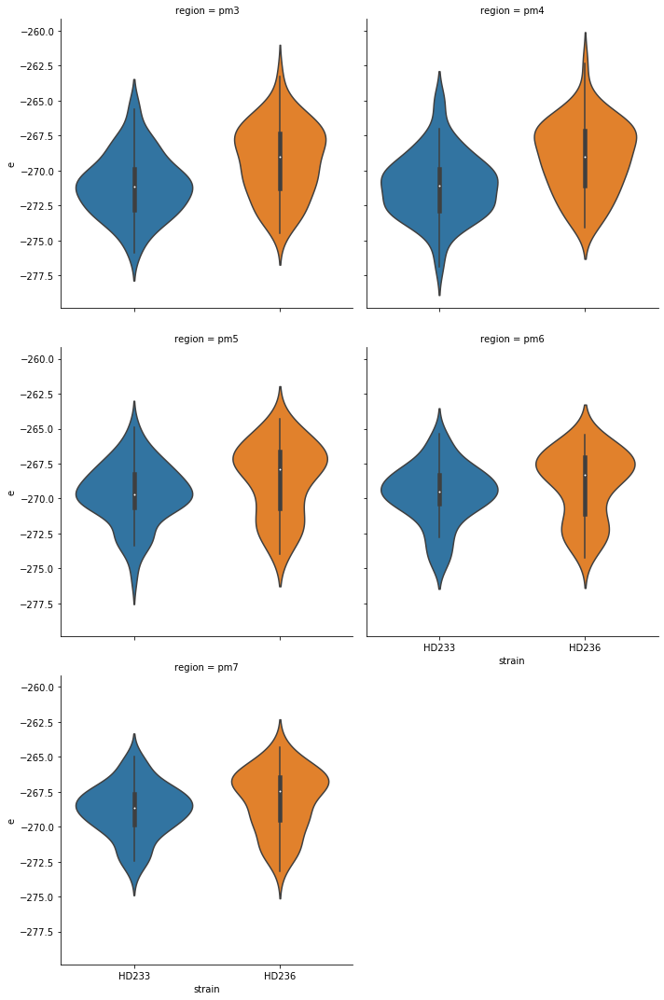

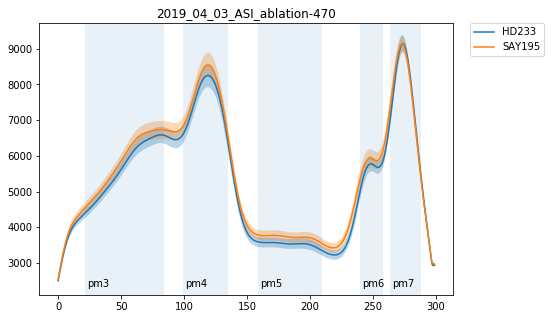

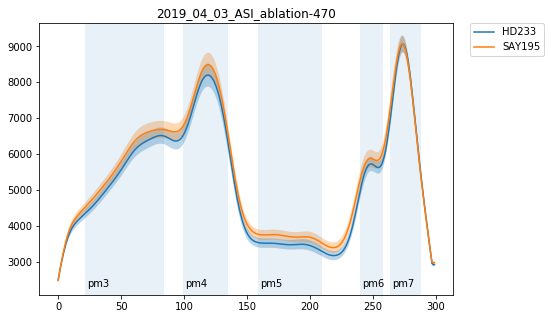

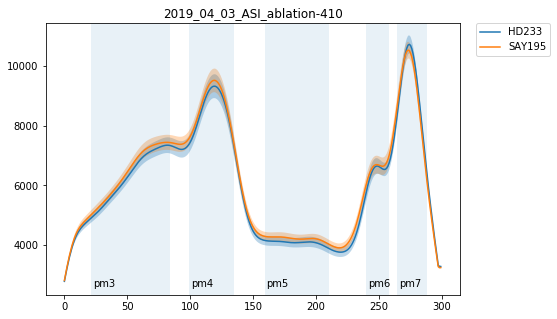

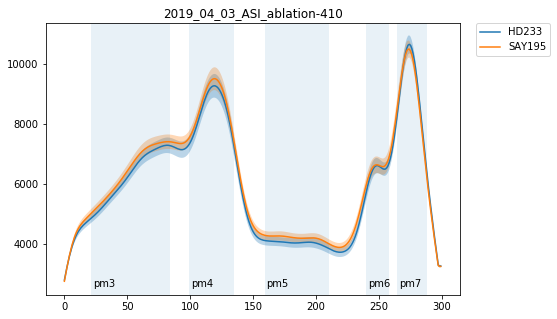

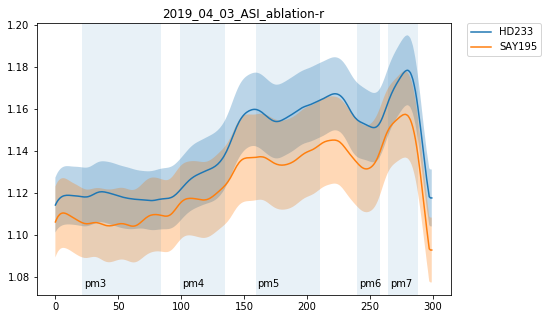

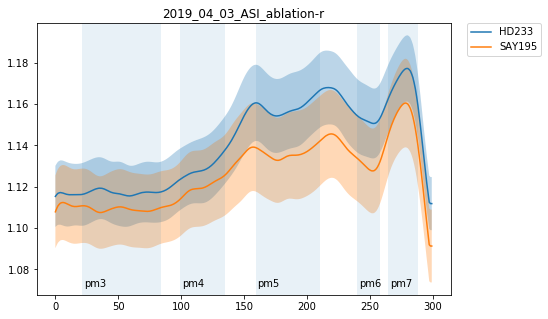

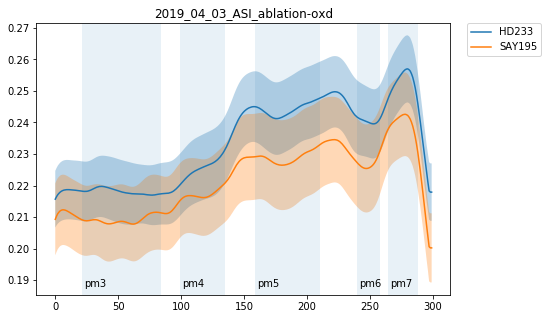

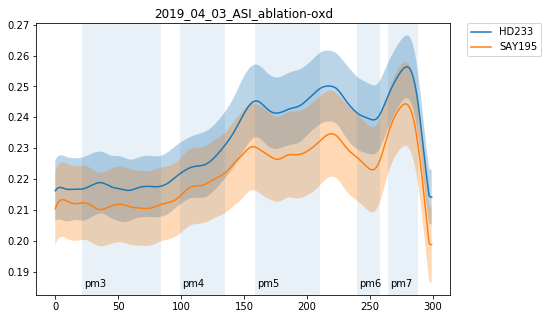

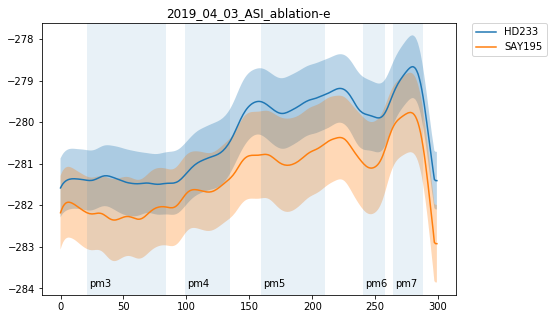

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

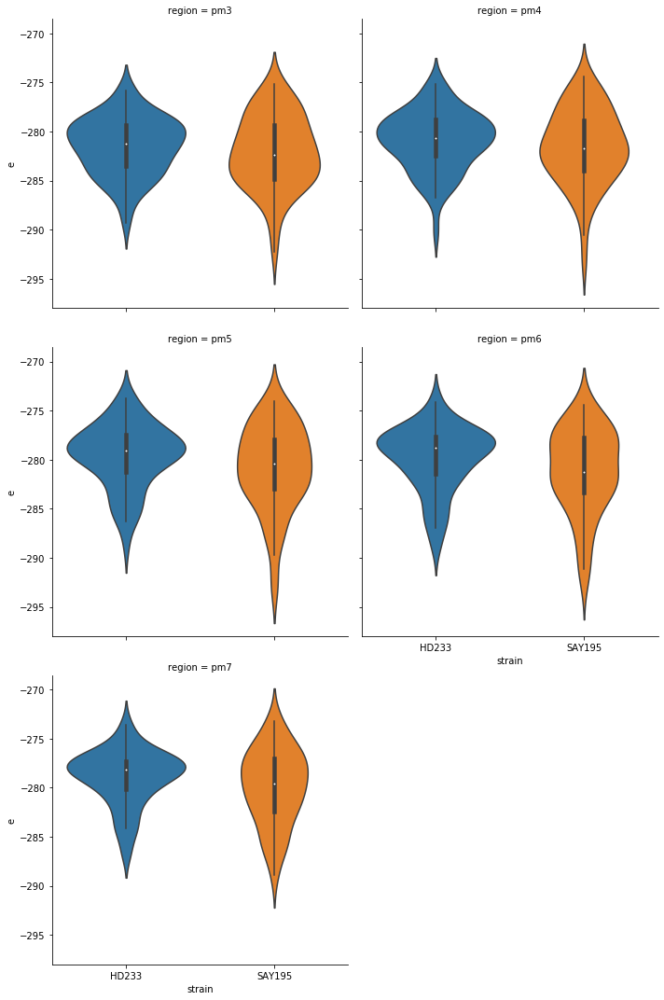

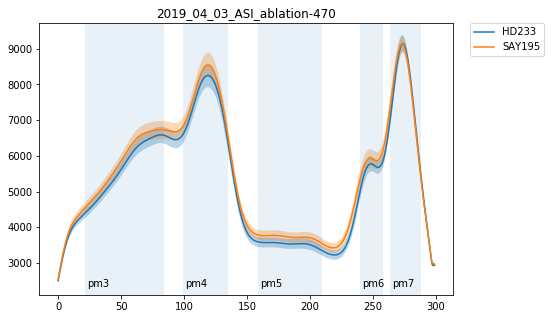

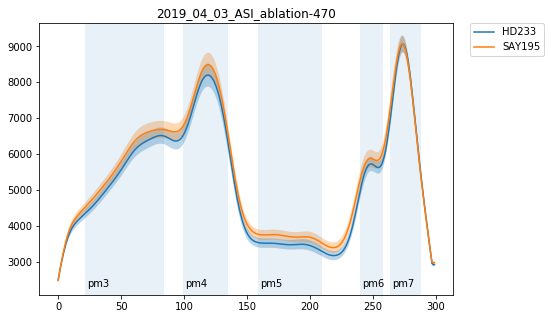

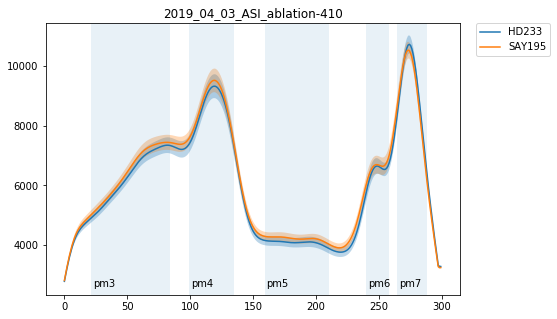

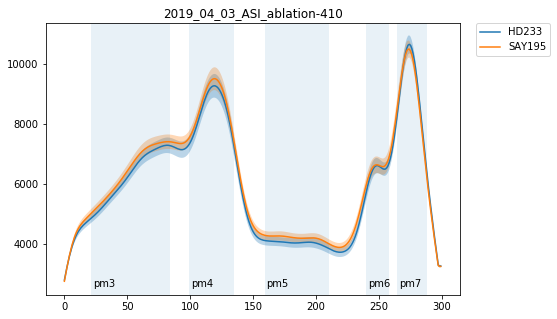

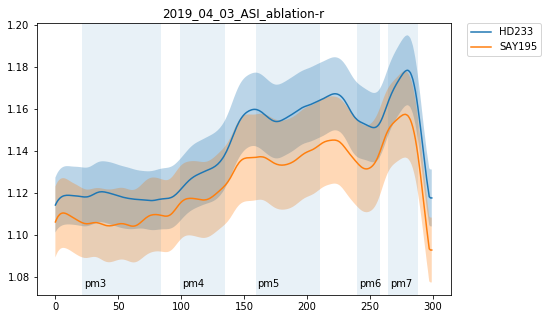

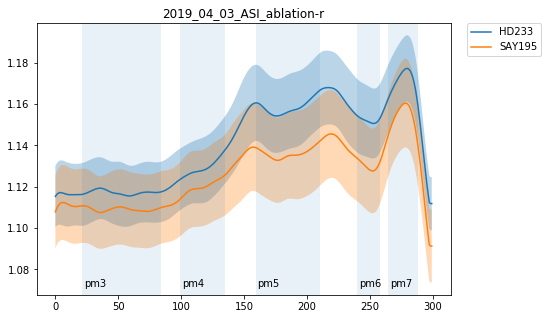

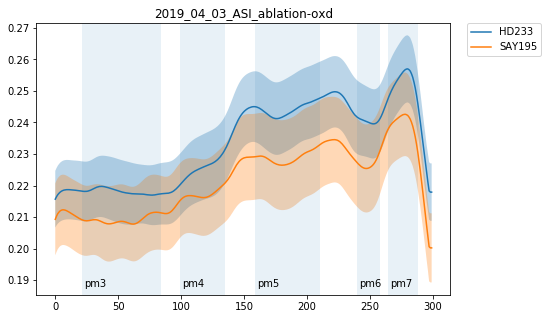

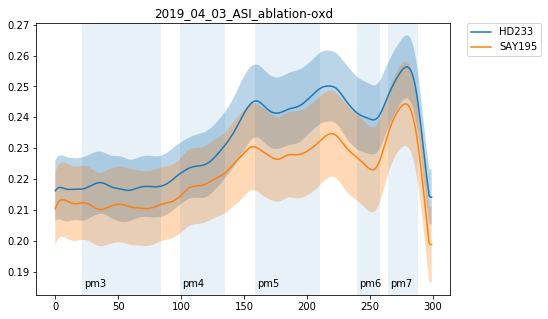

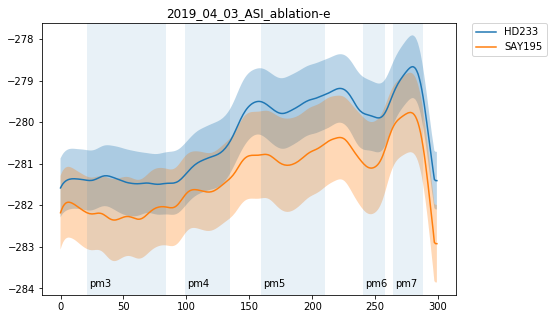

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

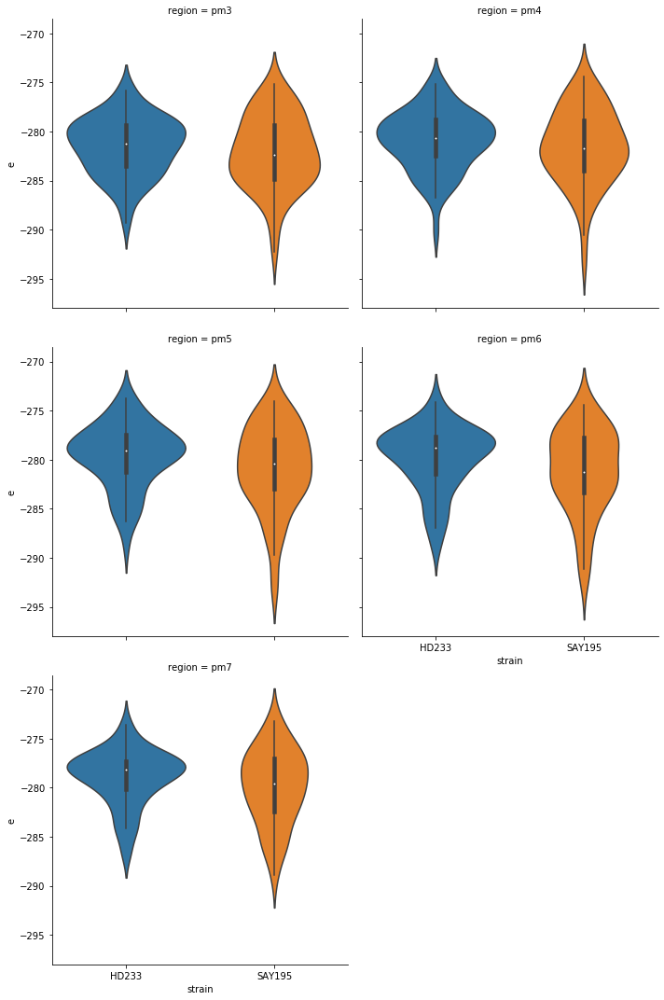

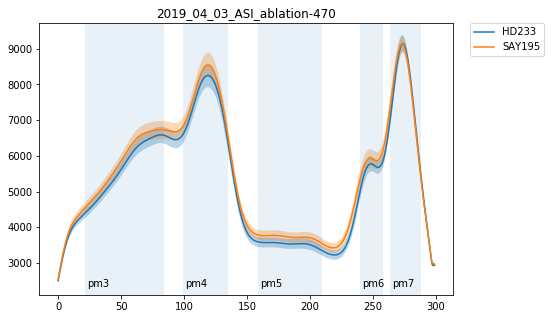

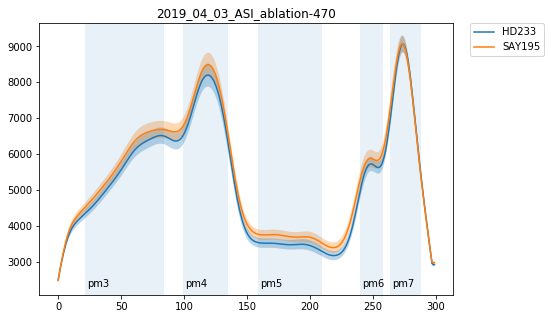

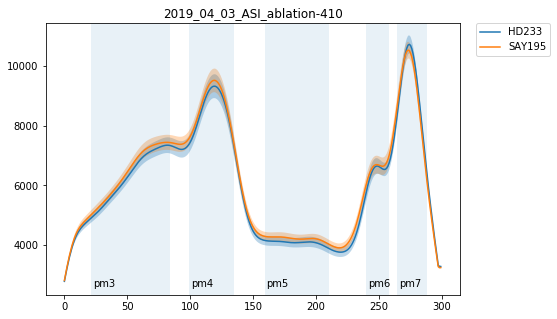

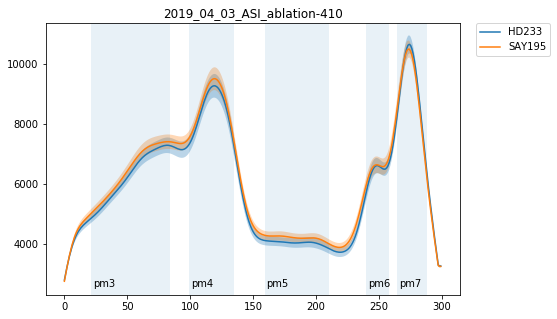

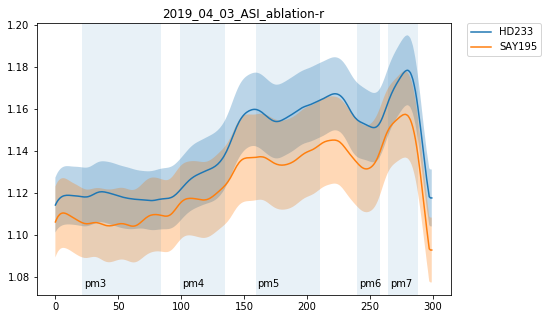

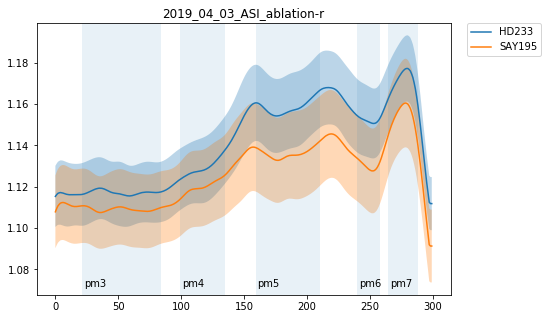

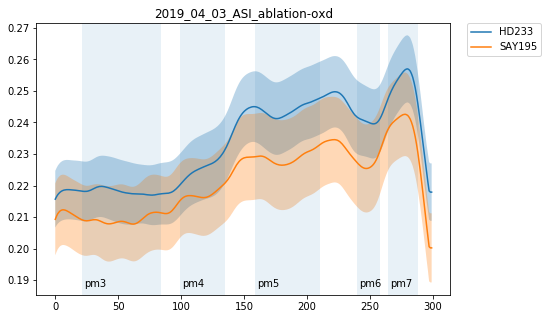

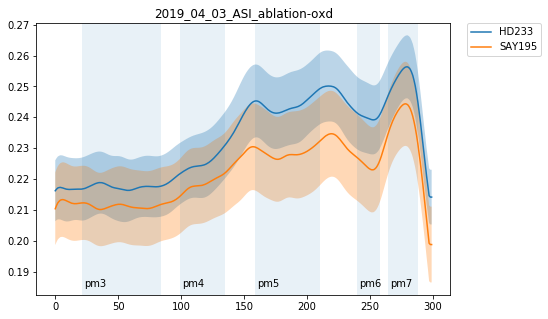

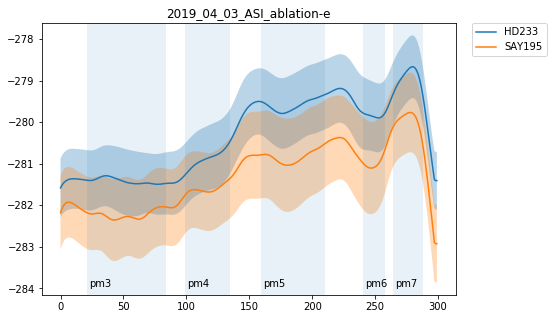

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

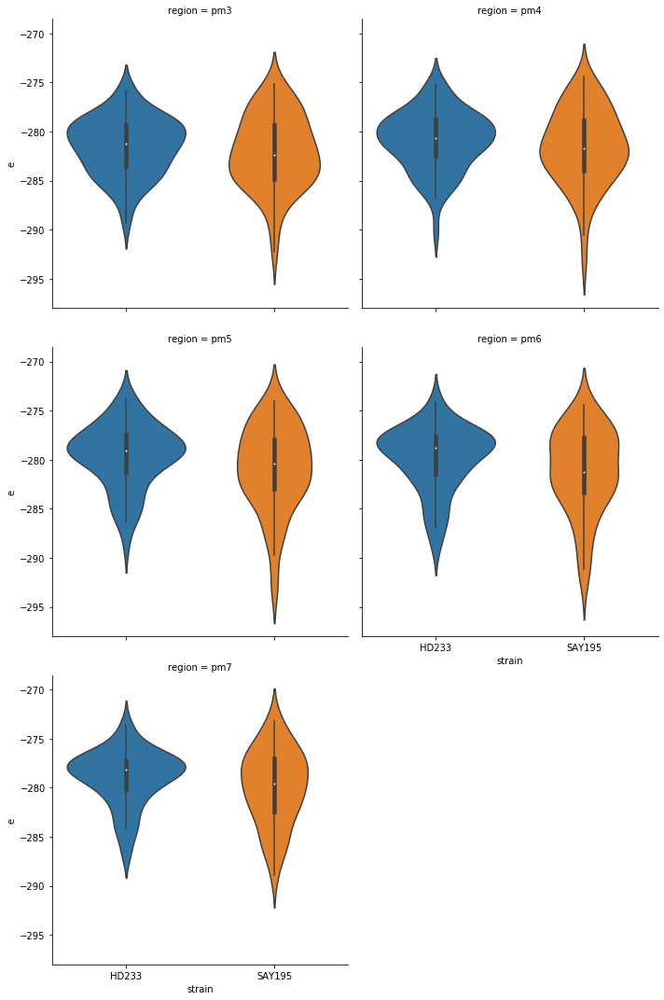

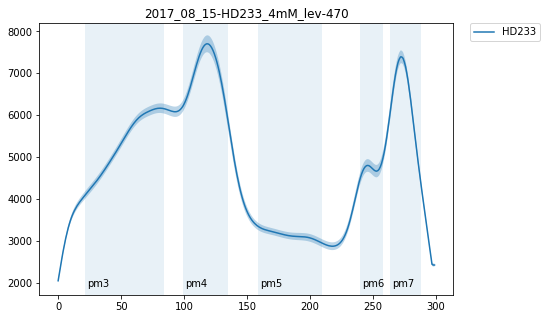

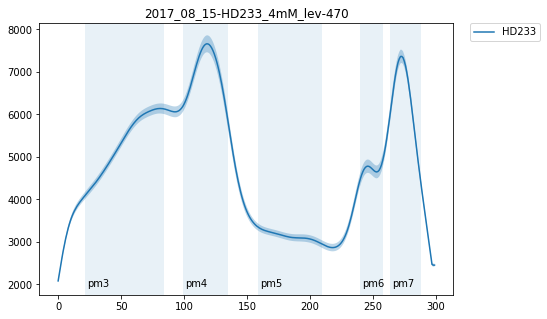

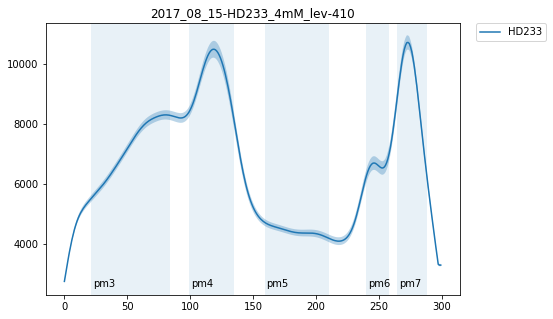

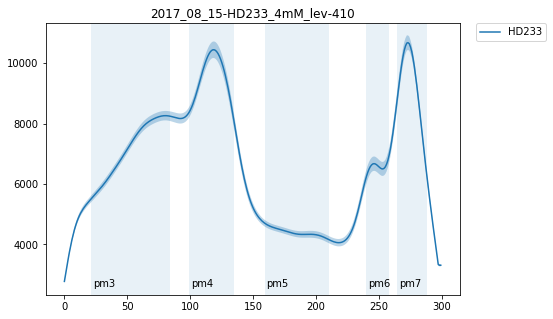

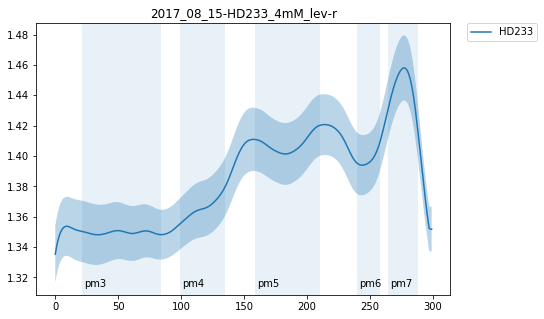

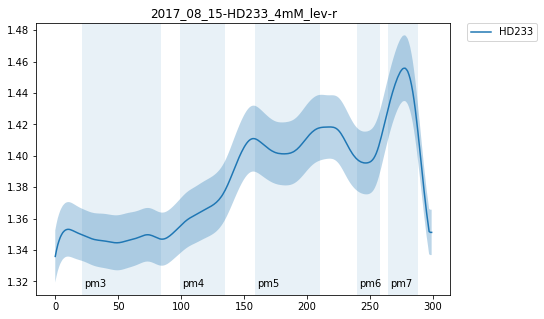

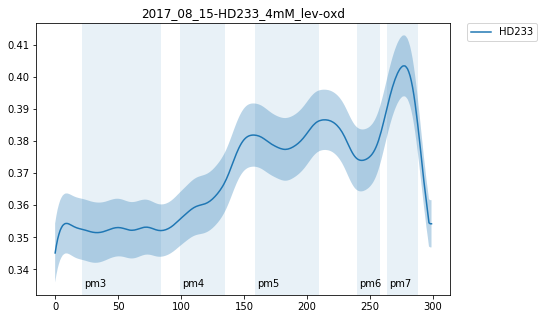

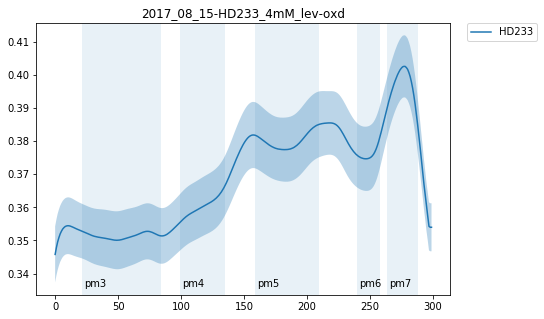

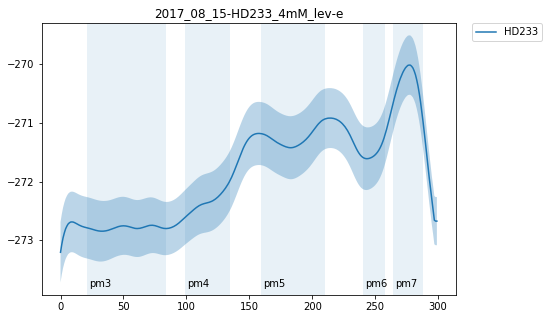

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

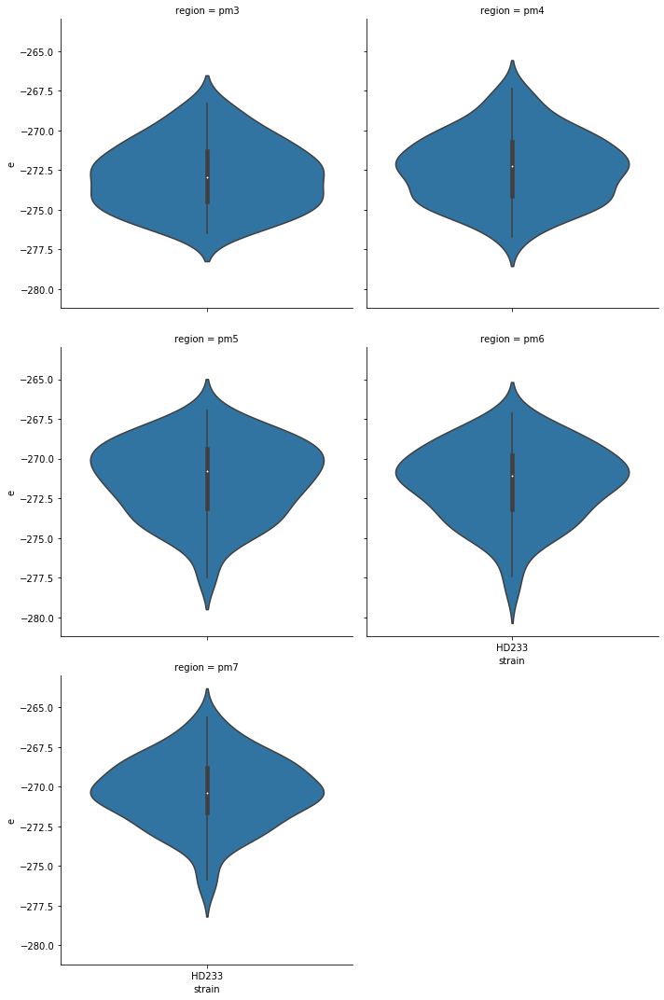

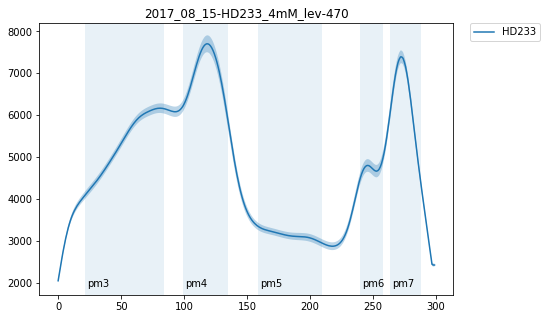

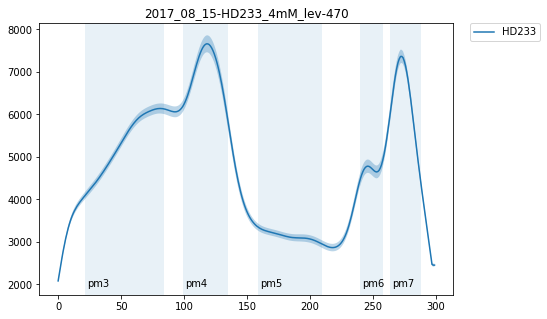

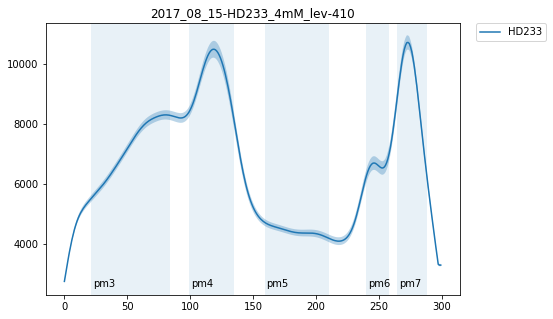

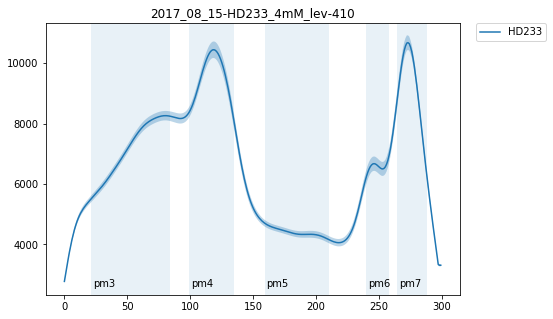

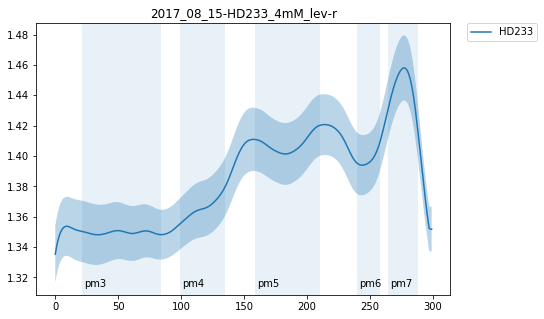

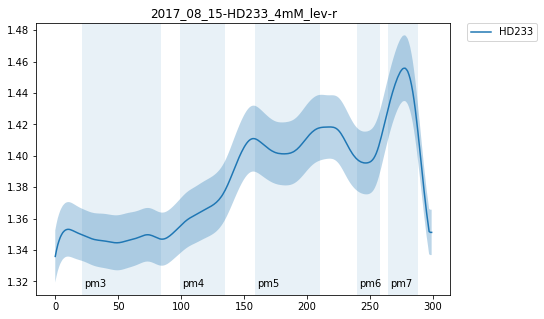

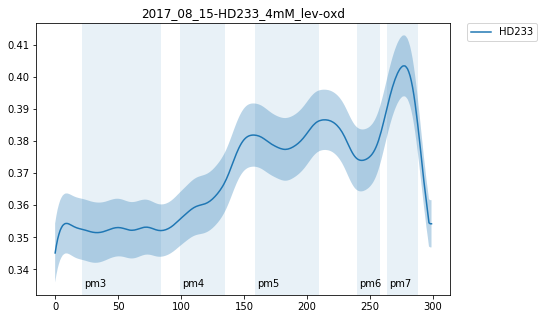

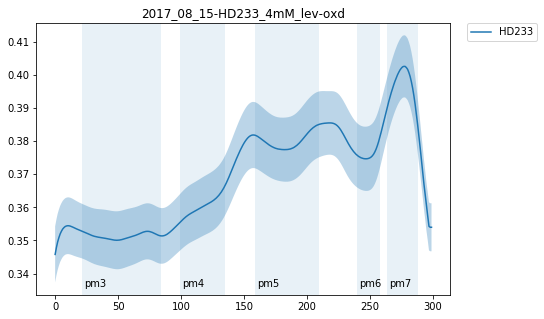

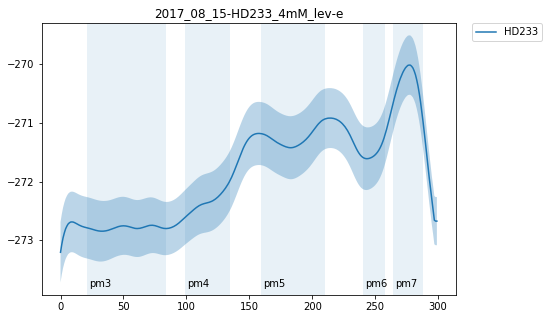

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

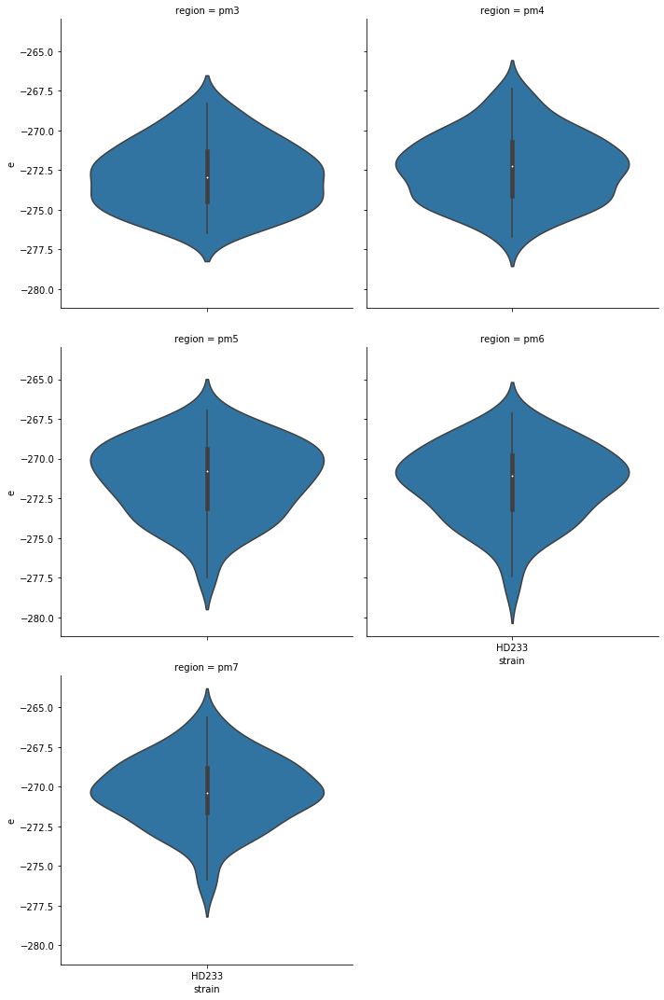

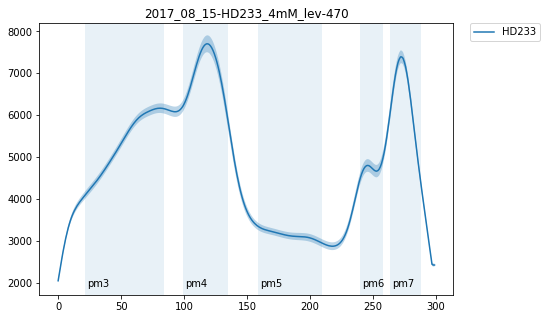

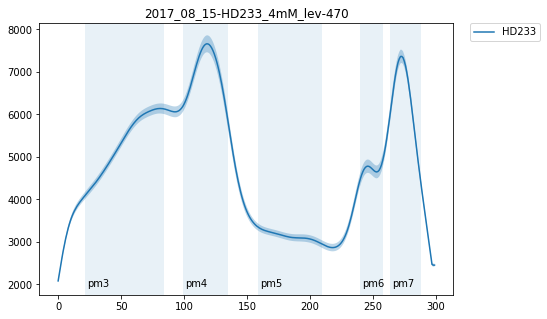

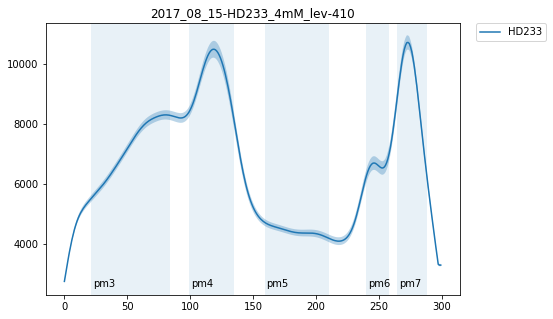

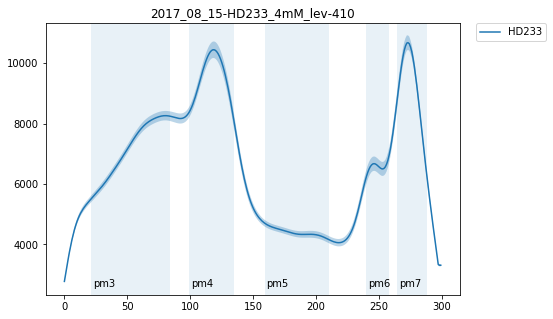

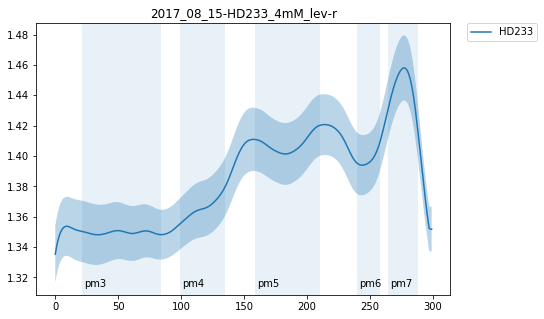

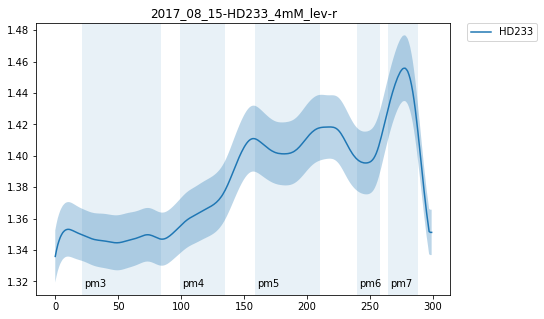

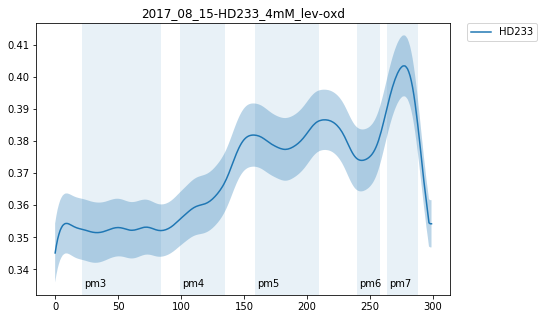

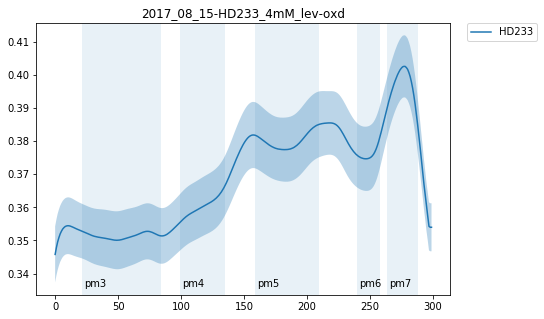

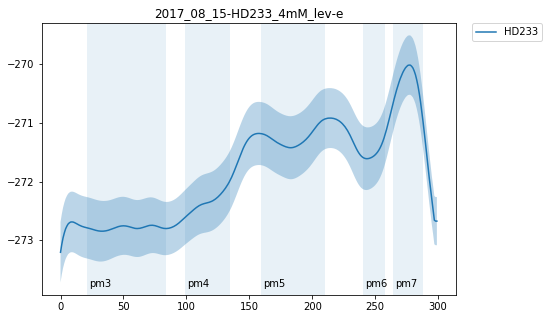

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

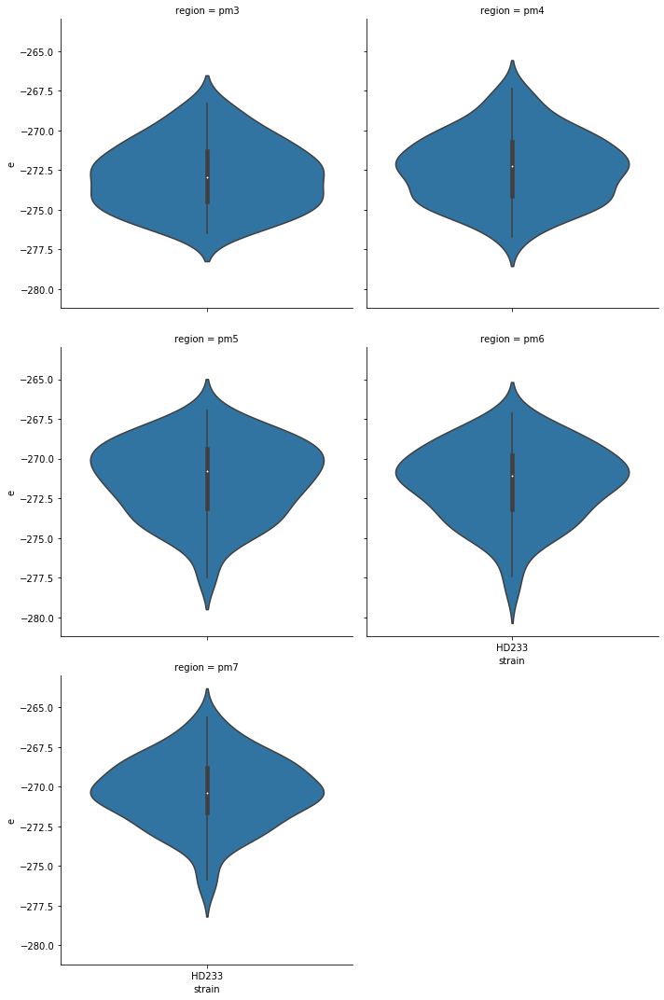

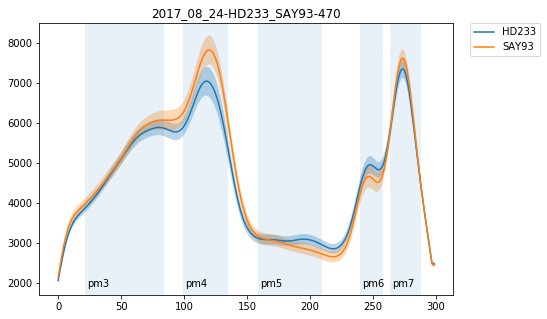

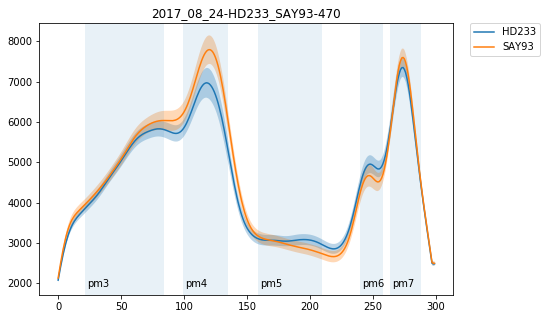

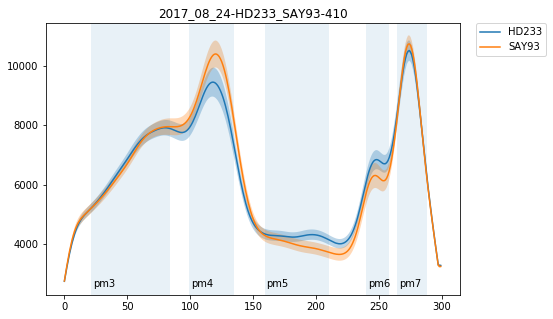

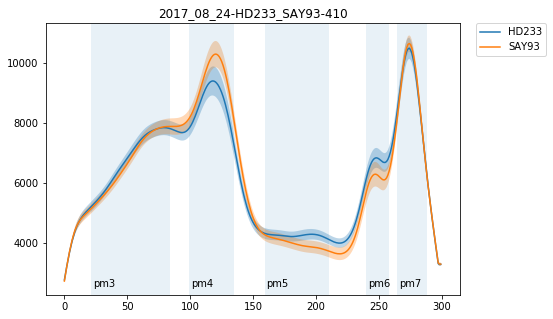

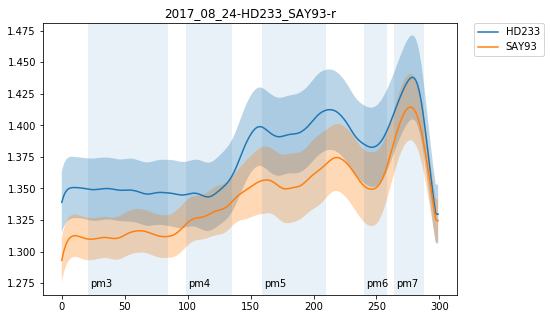

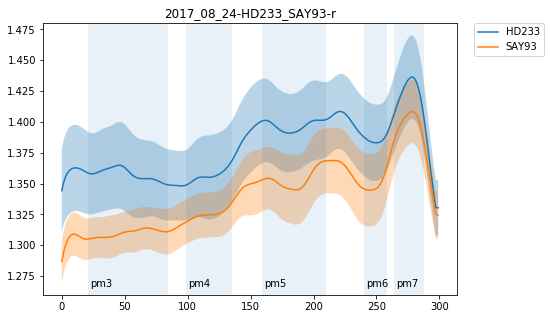

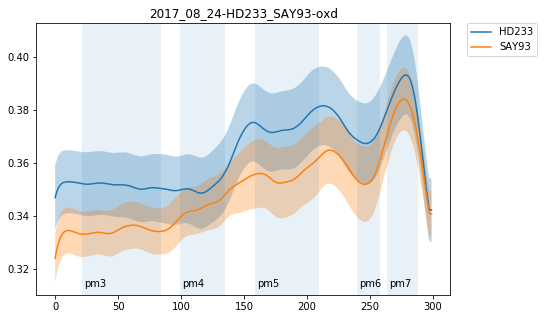

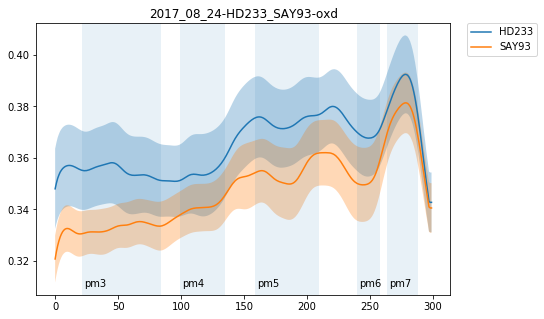

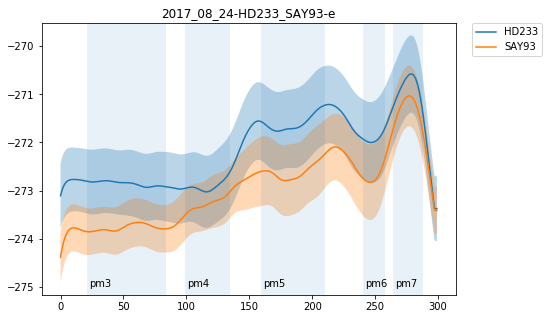

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

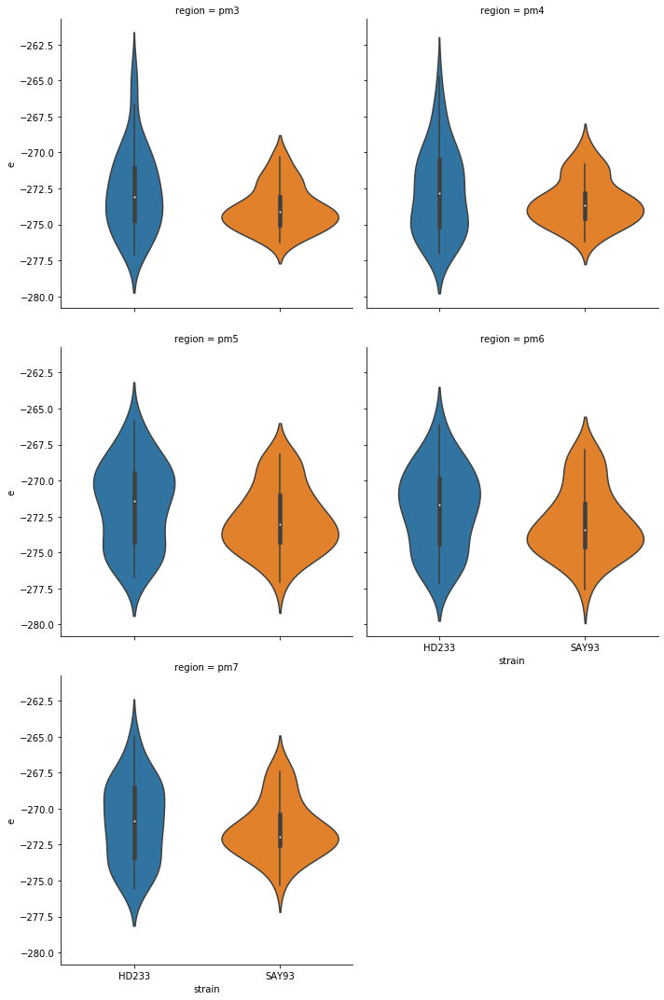

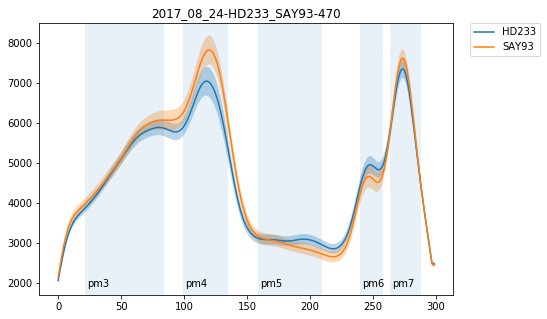

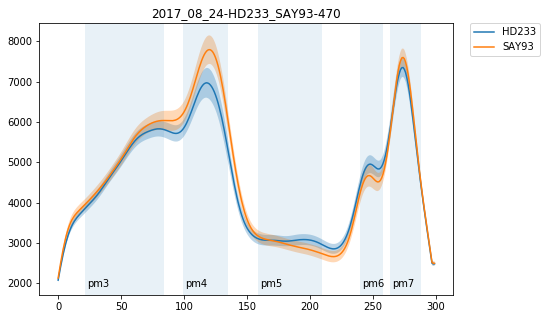

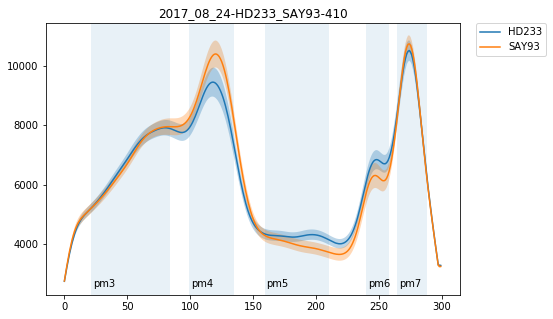

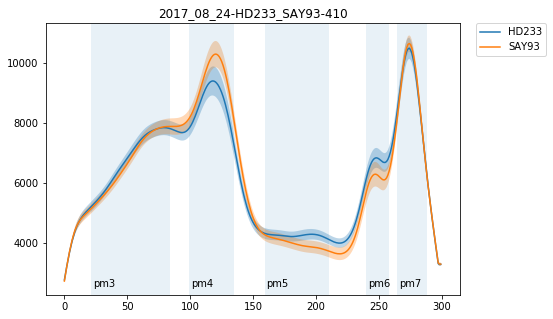

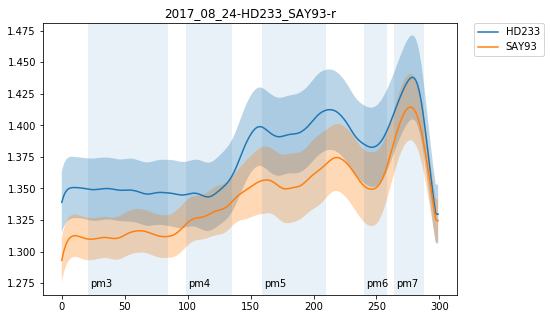

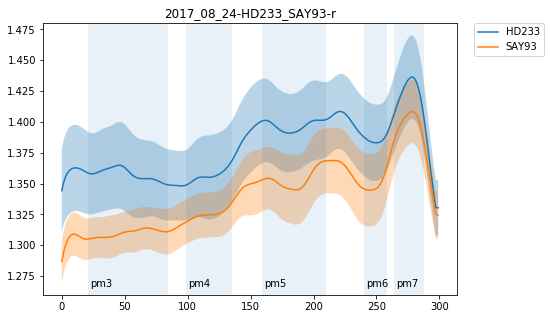

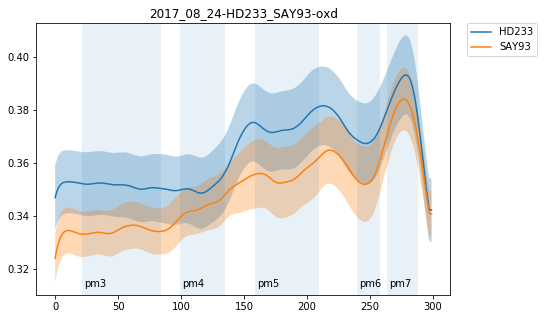

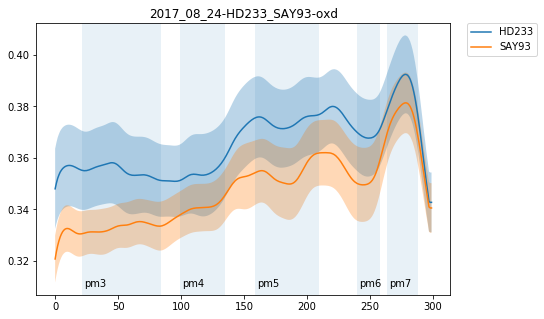

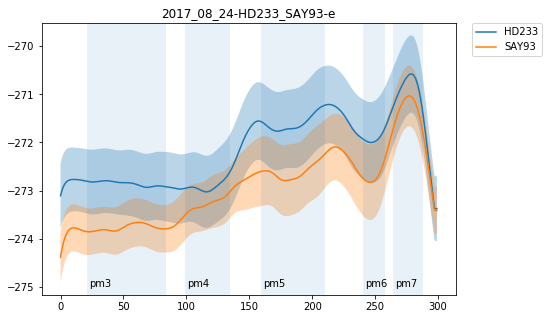

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

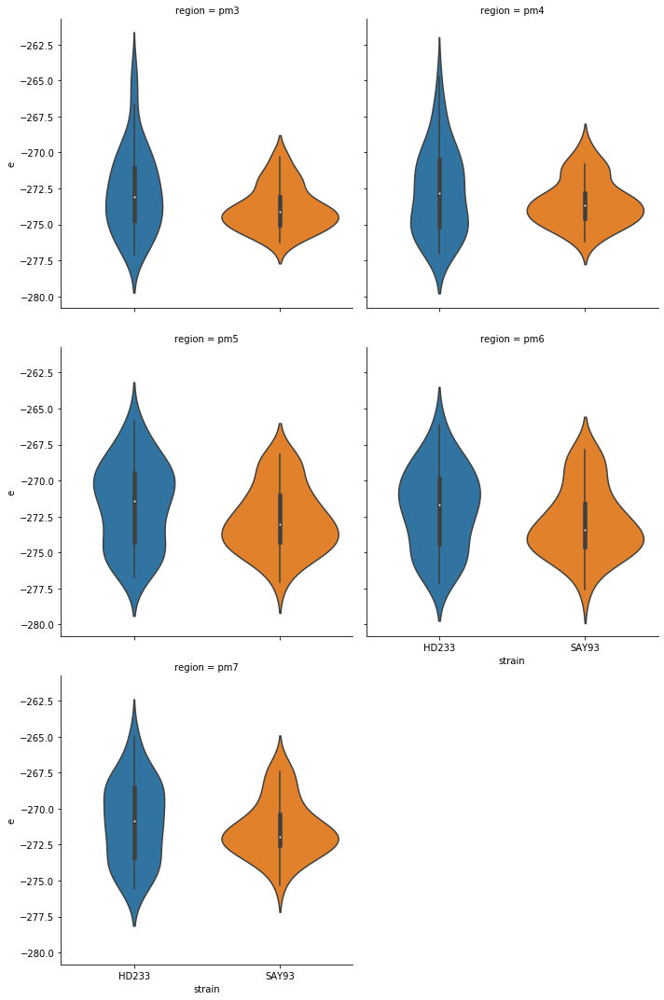

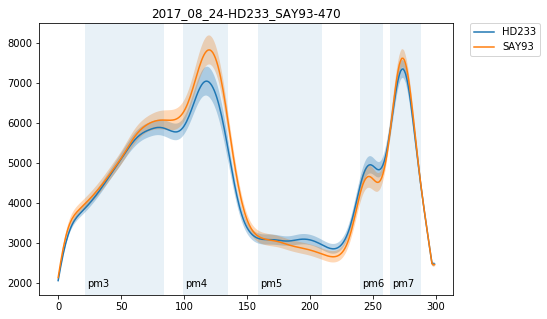

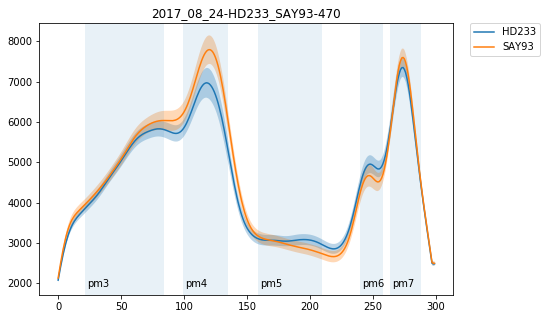

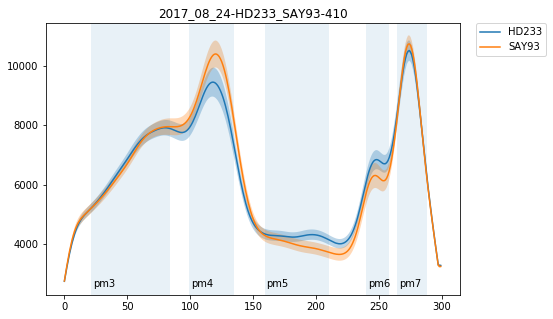

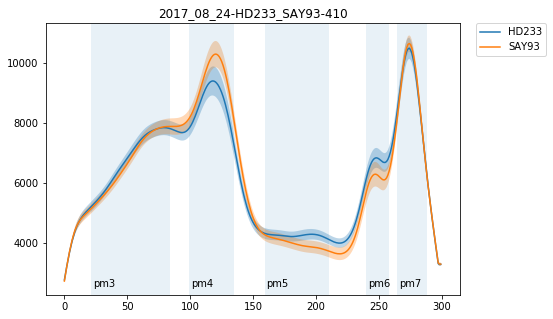

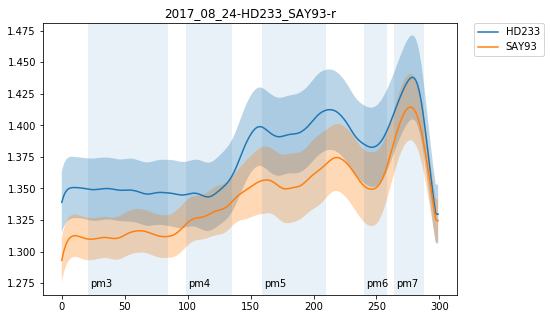

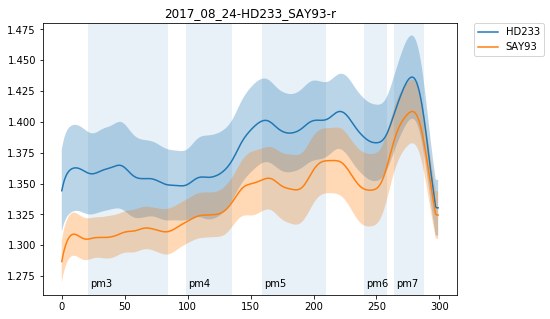

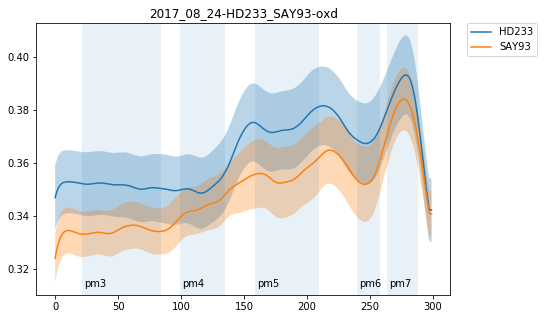

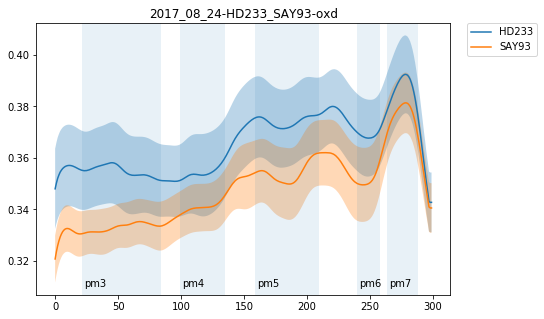

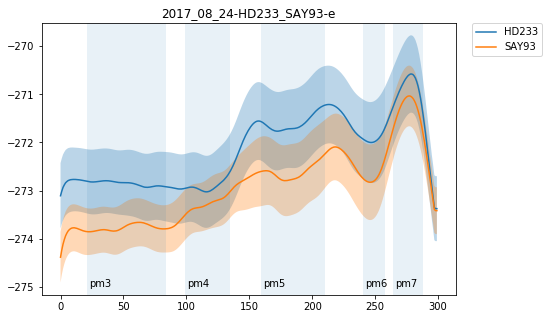

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

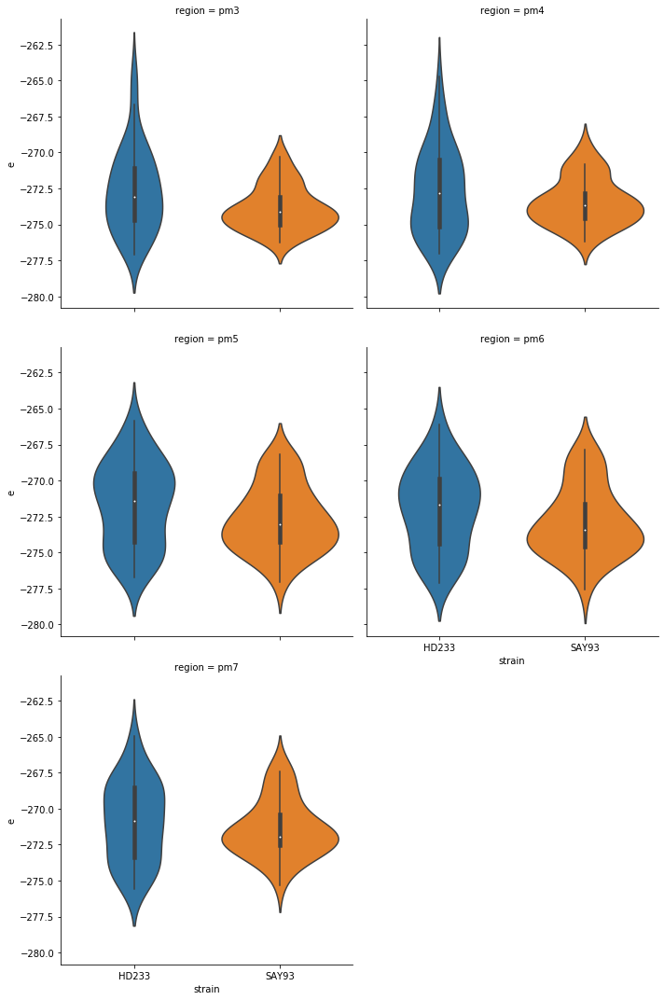

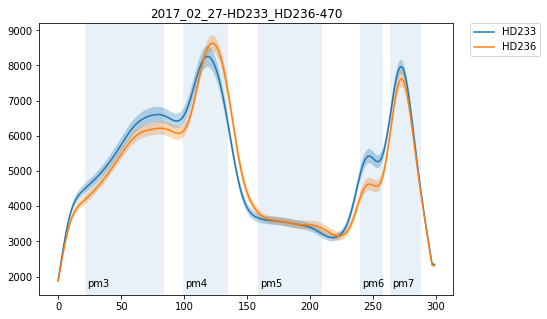

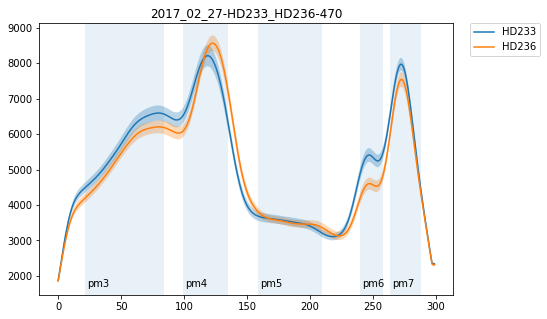

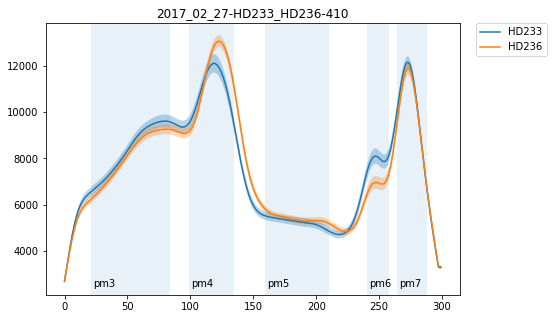

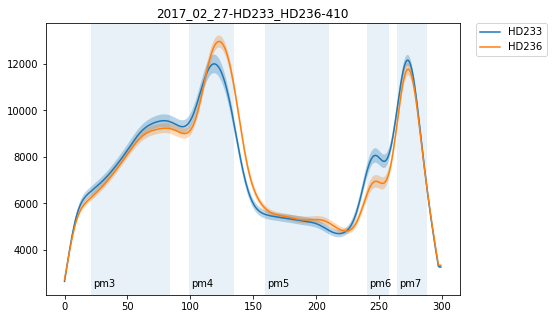

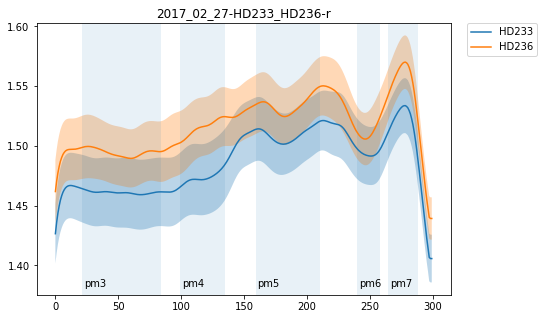

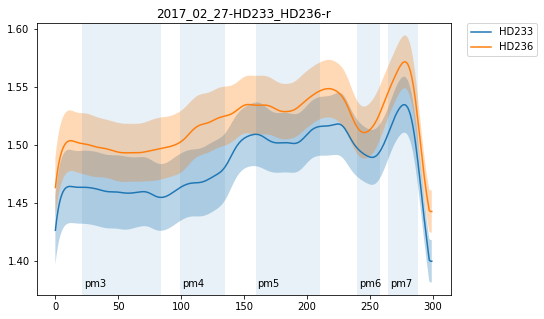

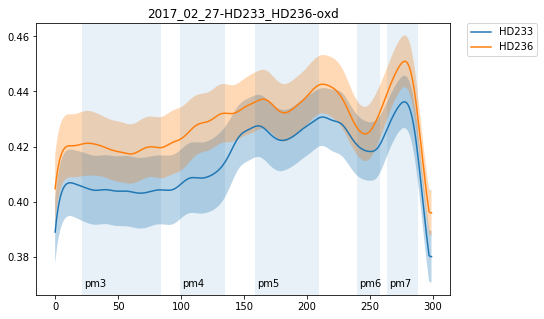

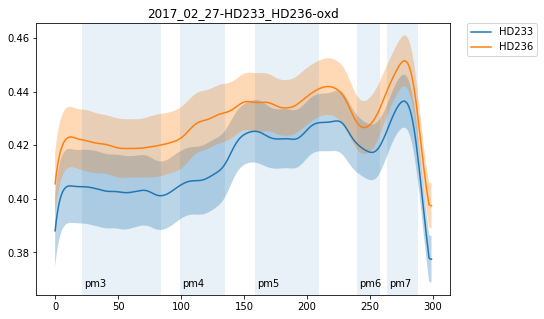

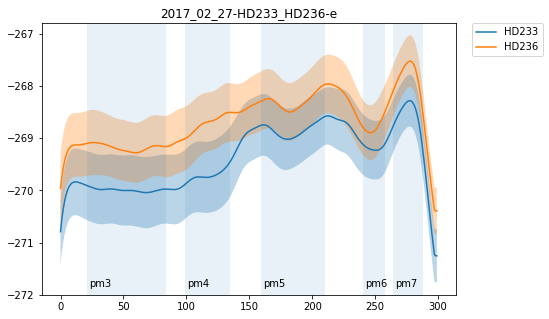

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

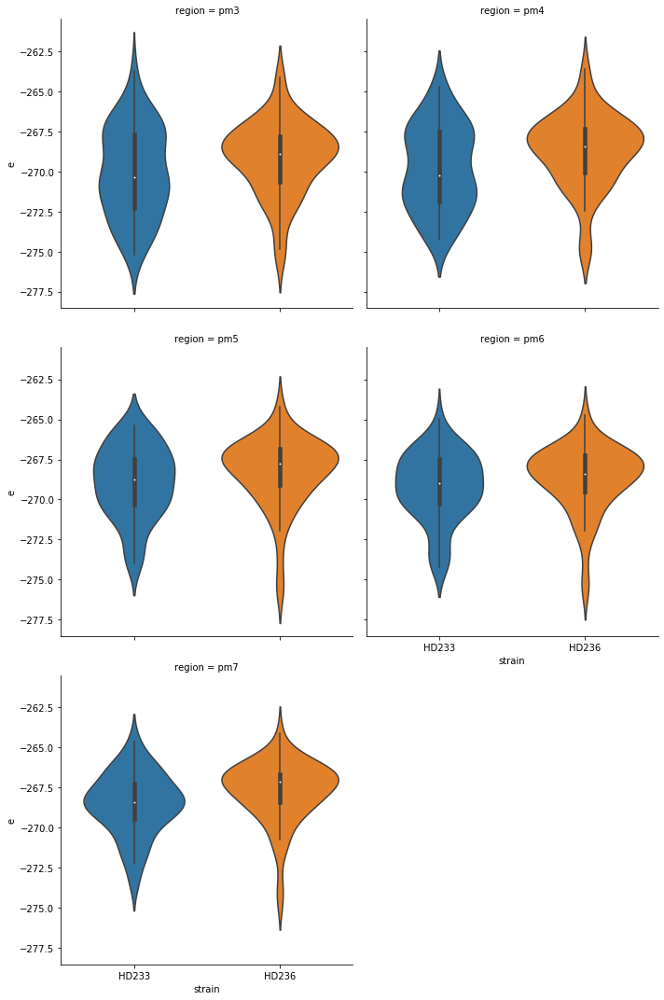

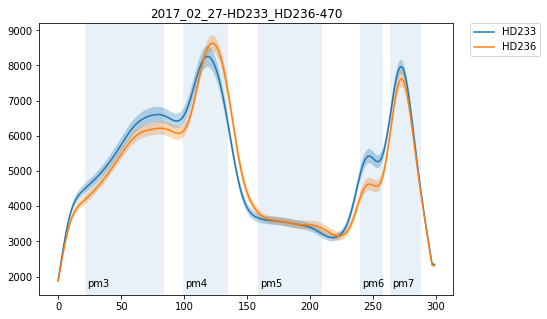

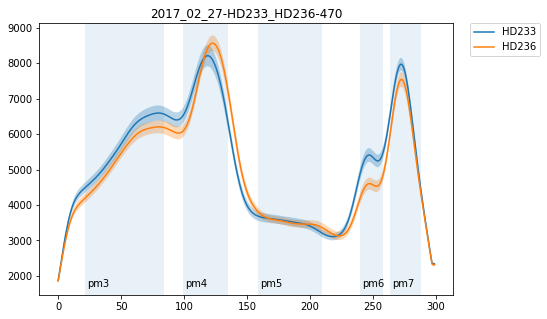

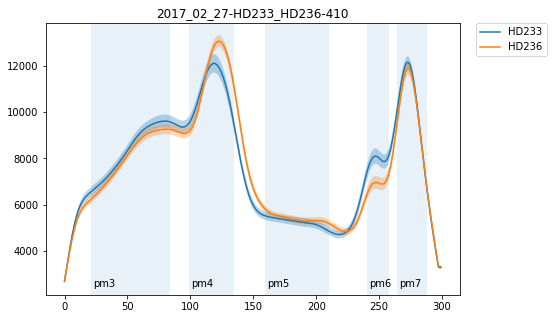

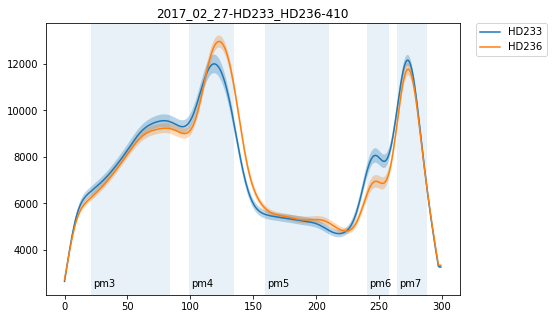

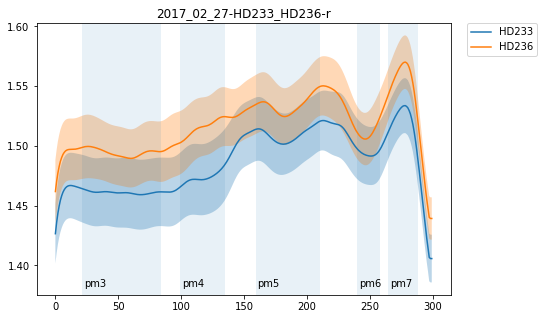

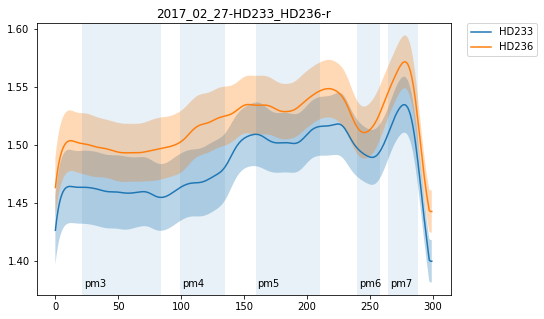

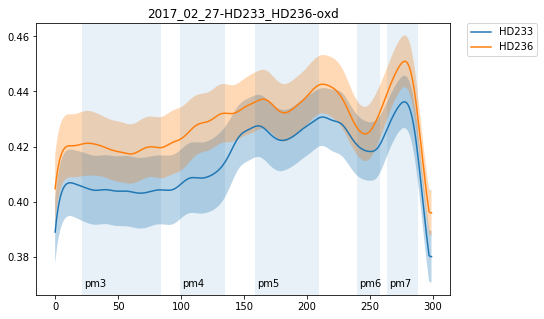

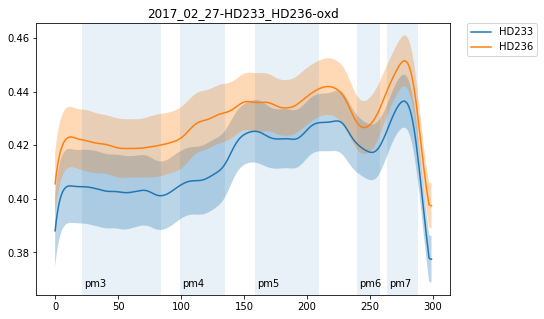

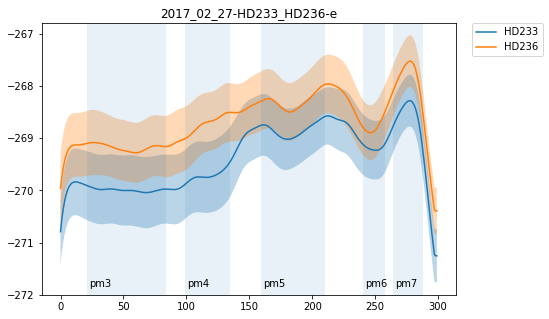

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

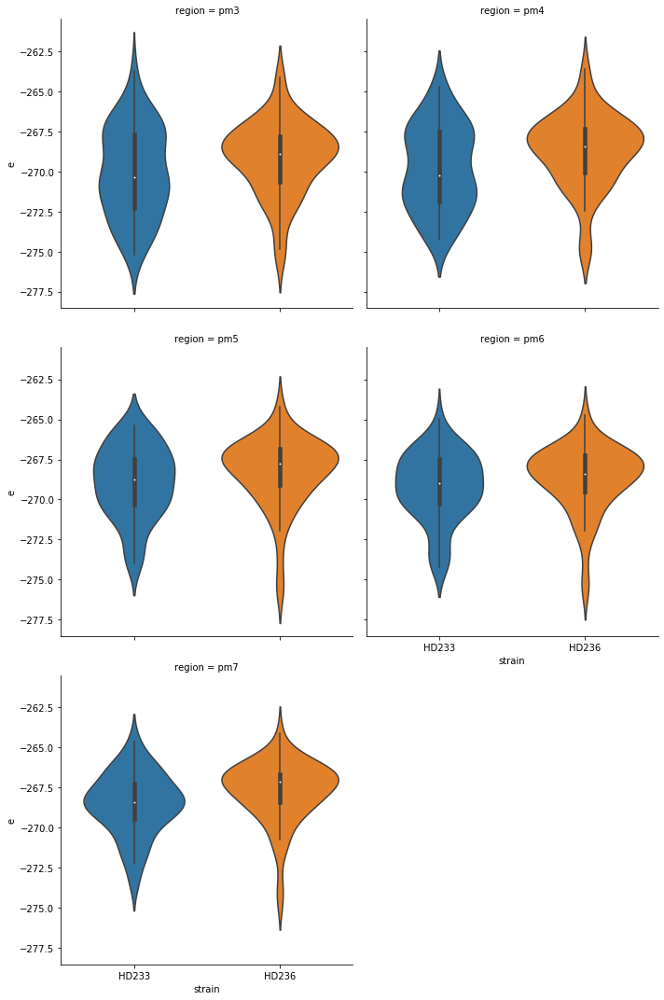

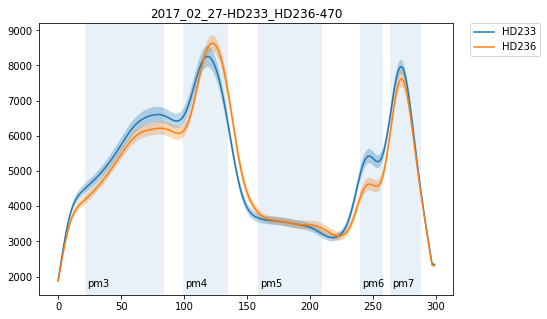

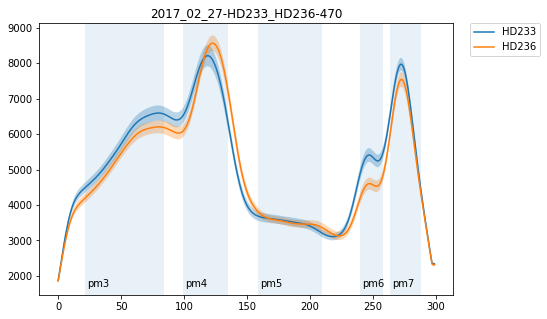

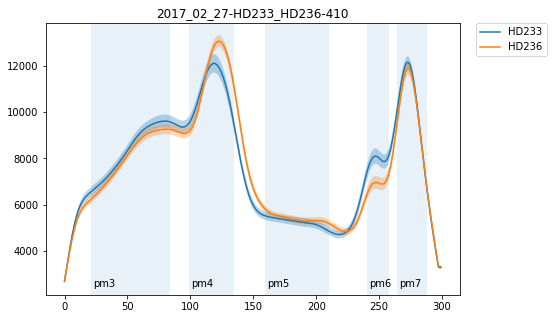

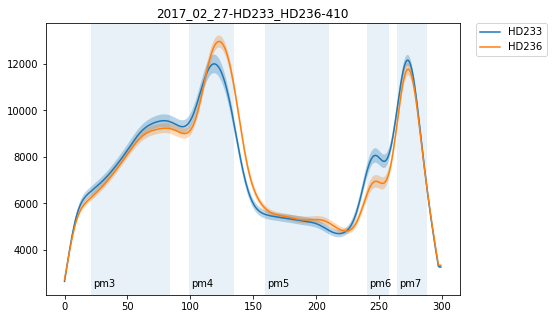

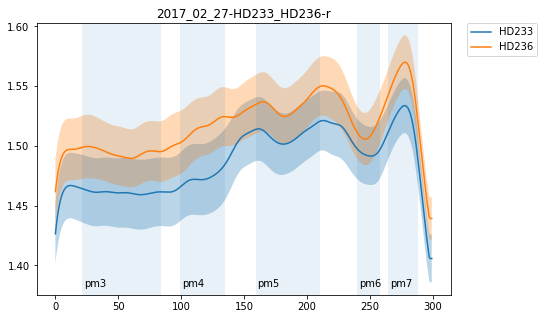

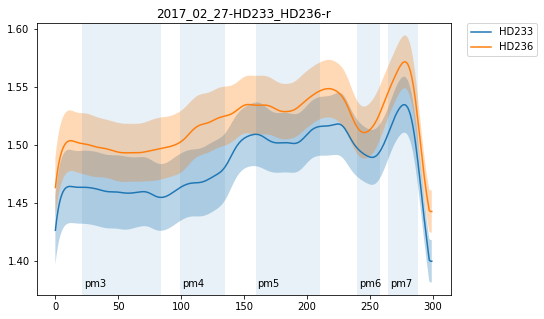

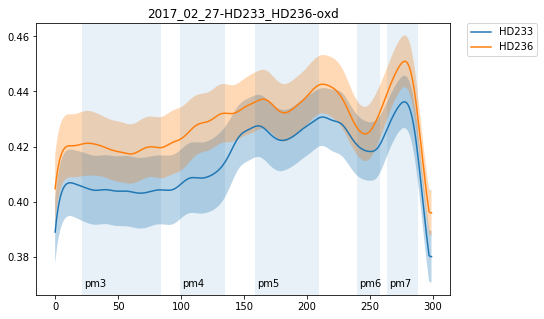

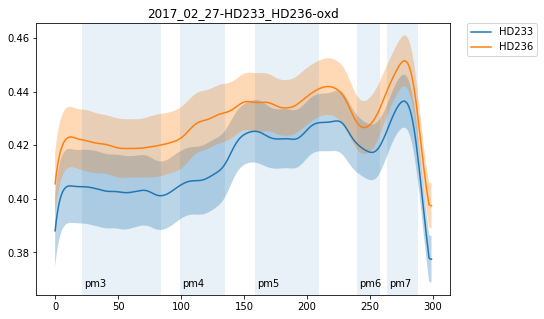

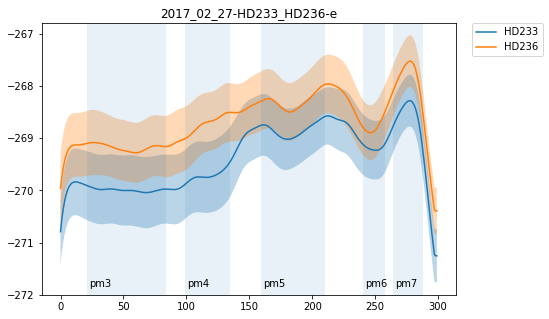

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

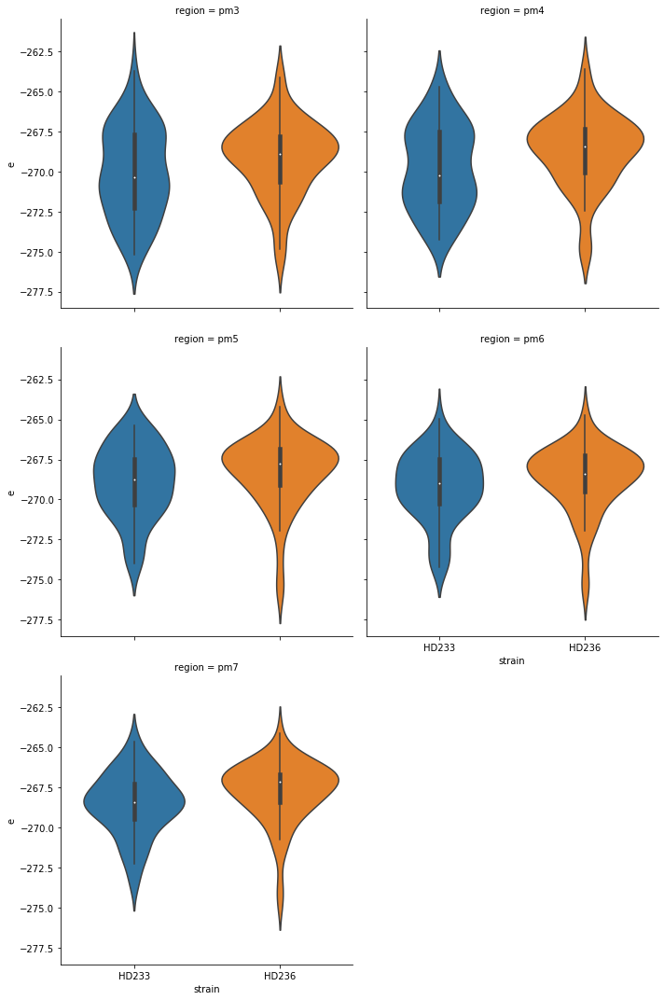

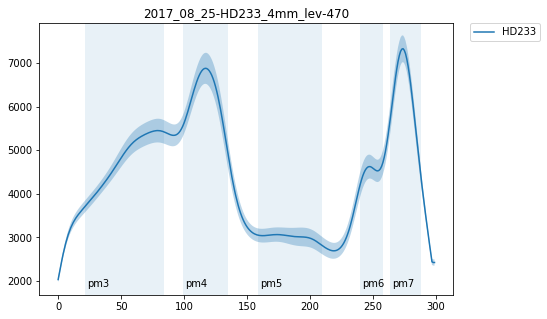

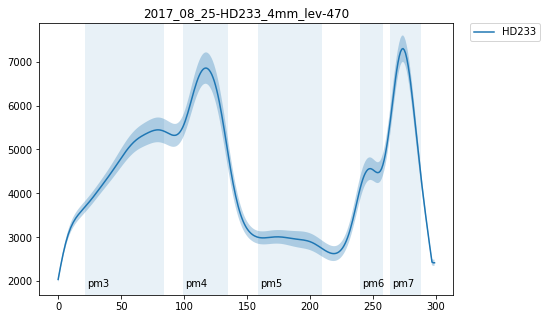

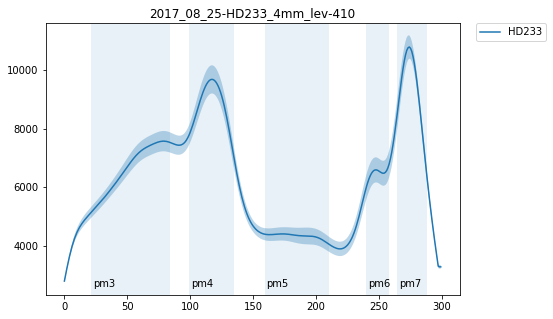

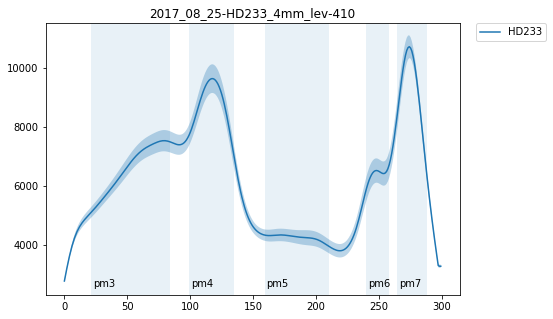

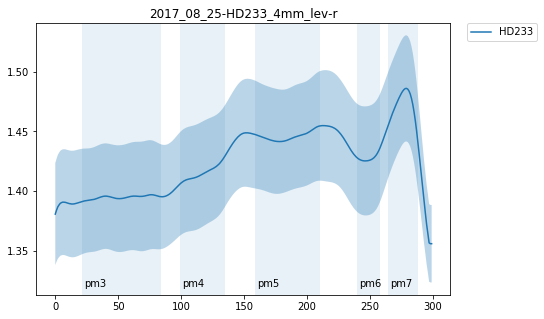

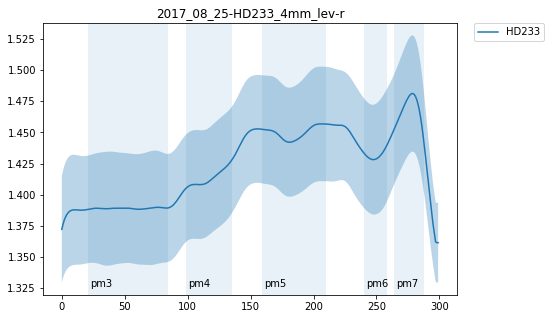

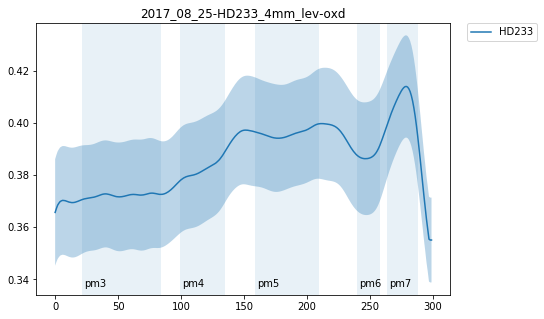

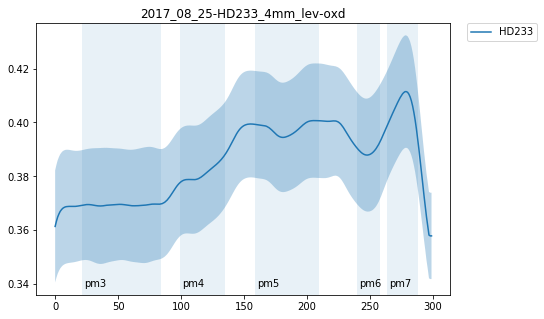

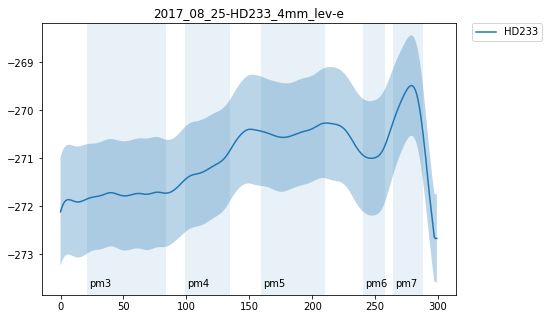

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

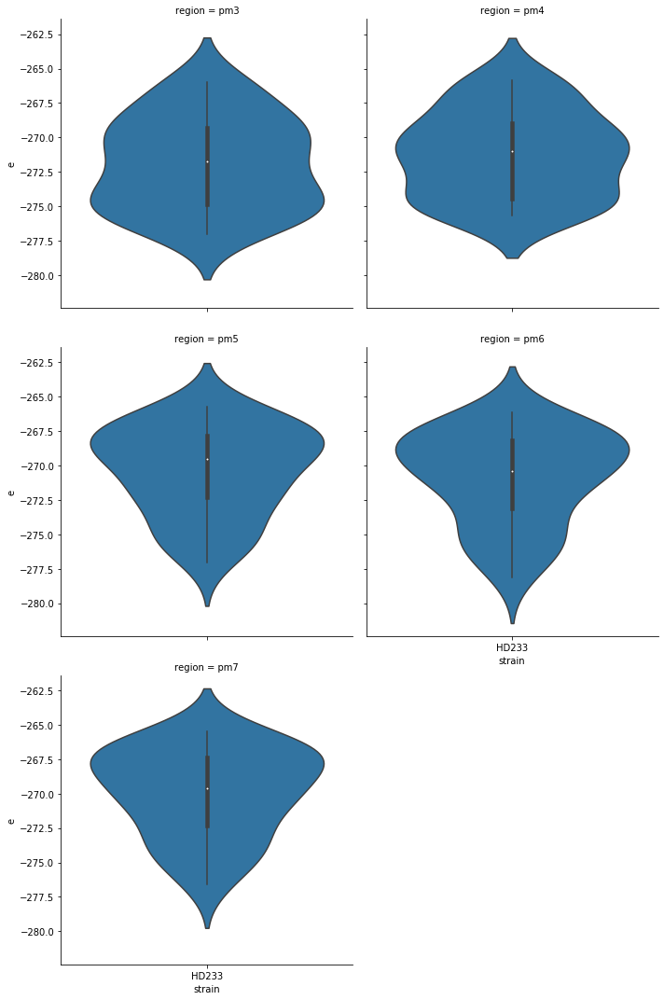

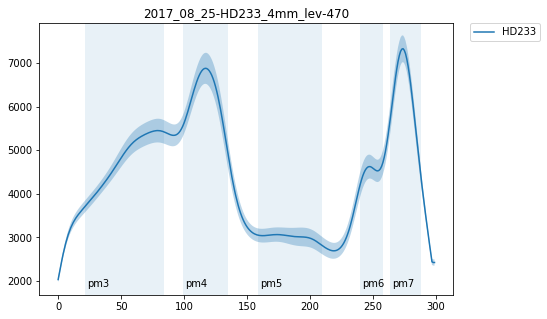

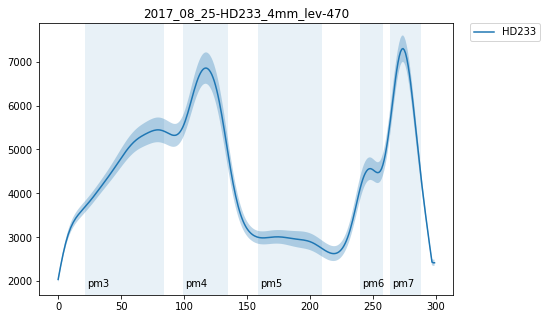

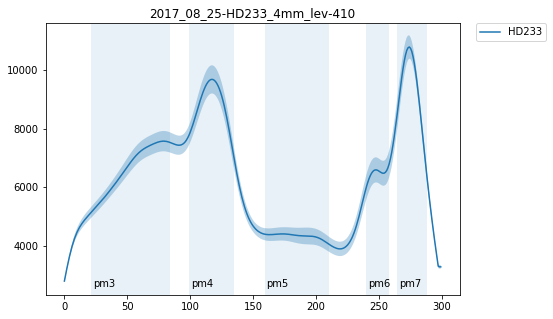

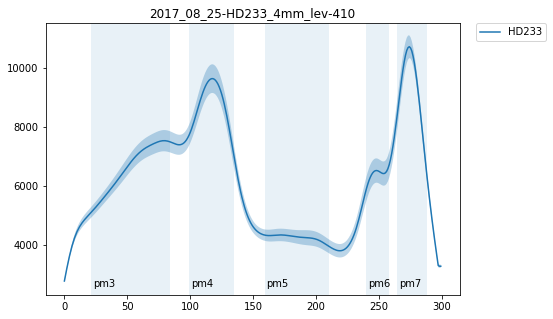

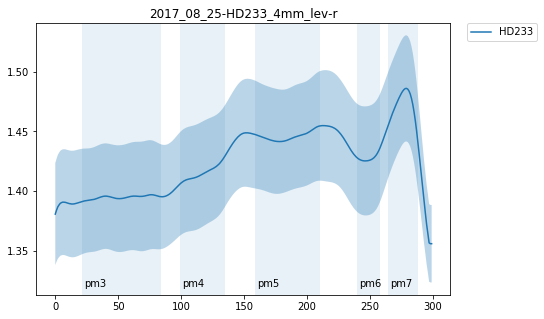

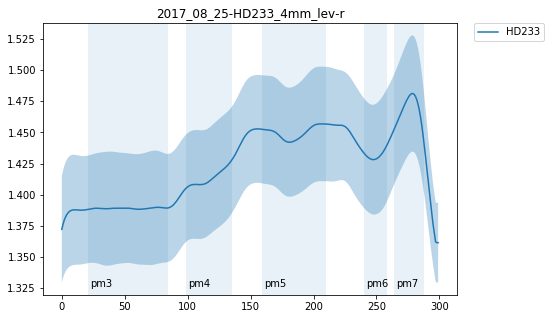

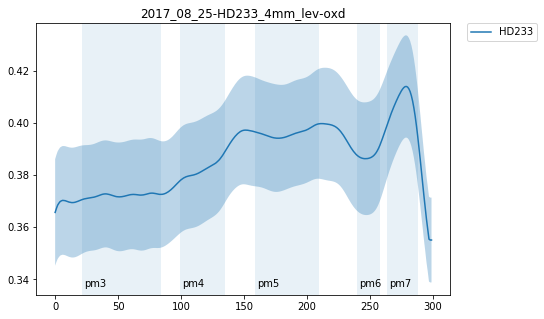

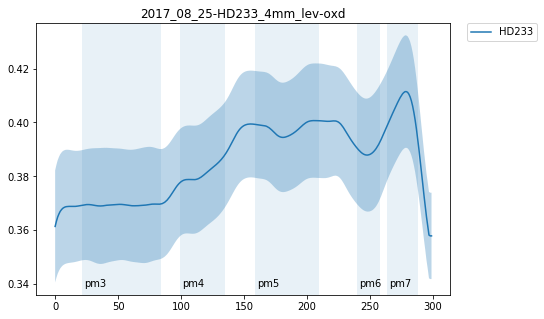

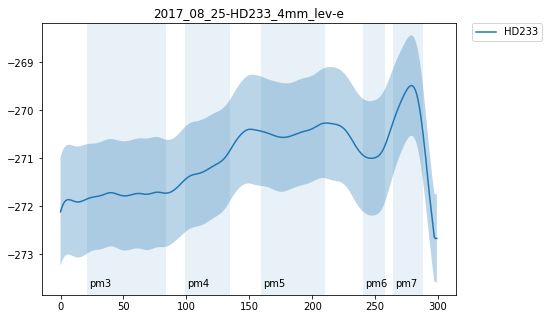

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

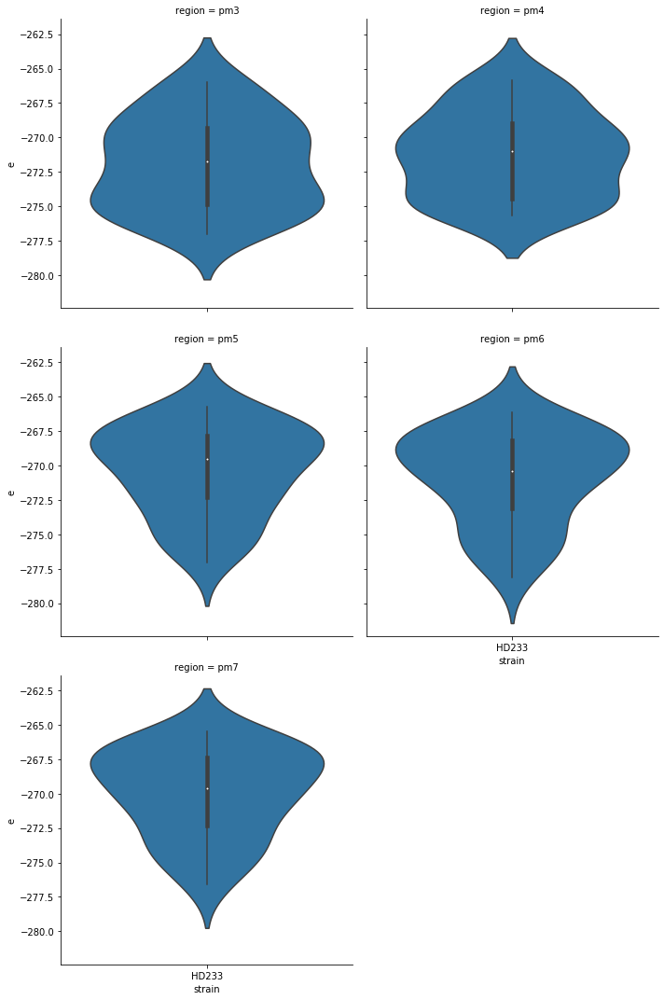

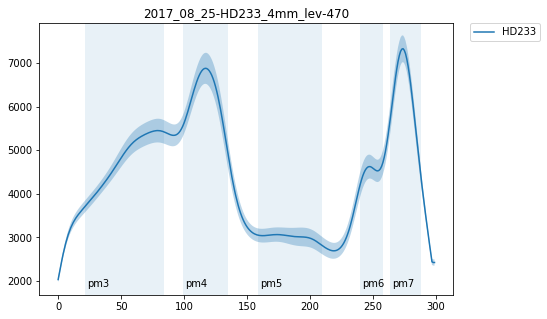

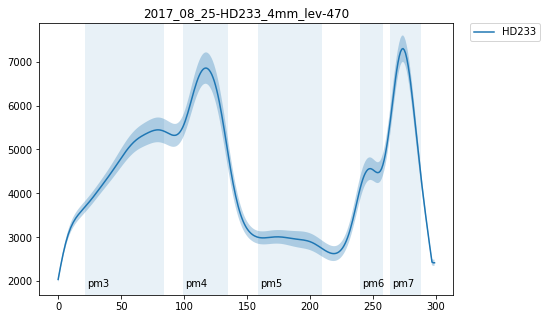

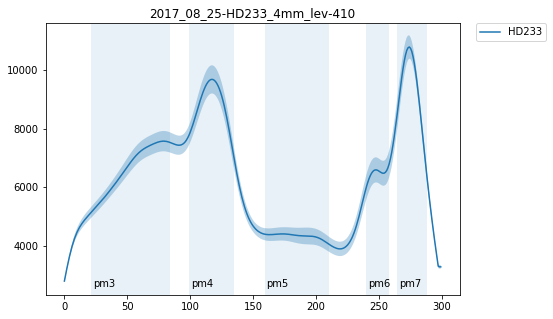

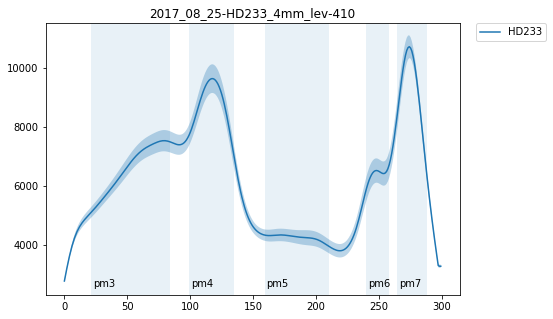

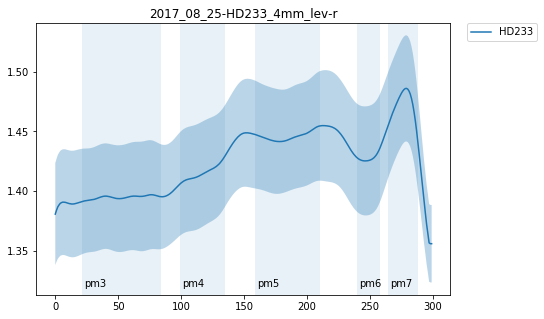

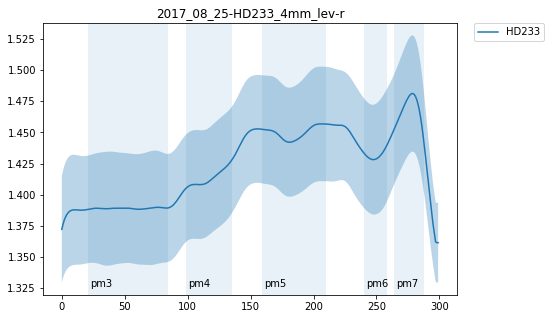

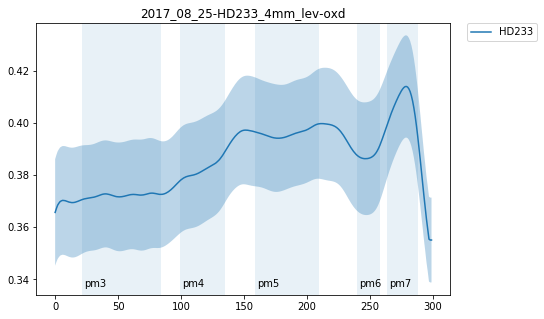

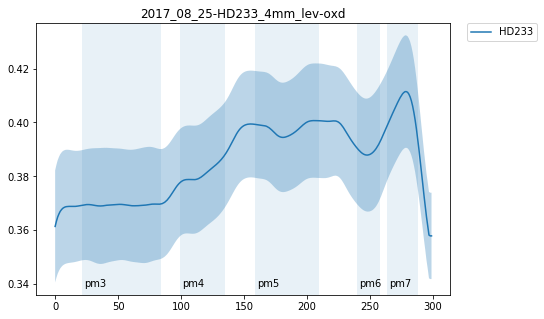

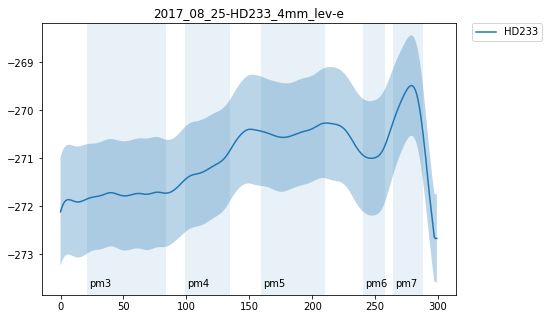

<Figure size 720x360 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

<Figure size 720x1080 with 0 Axes>

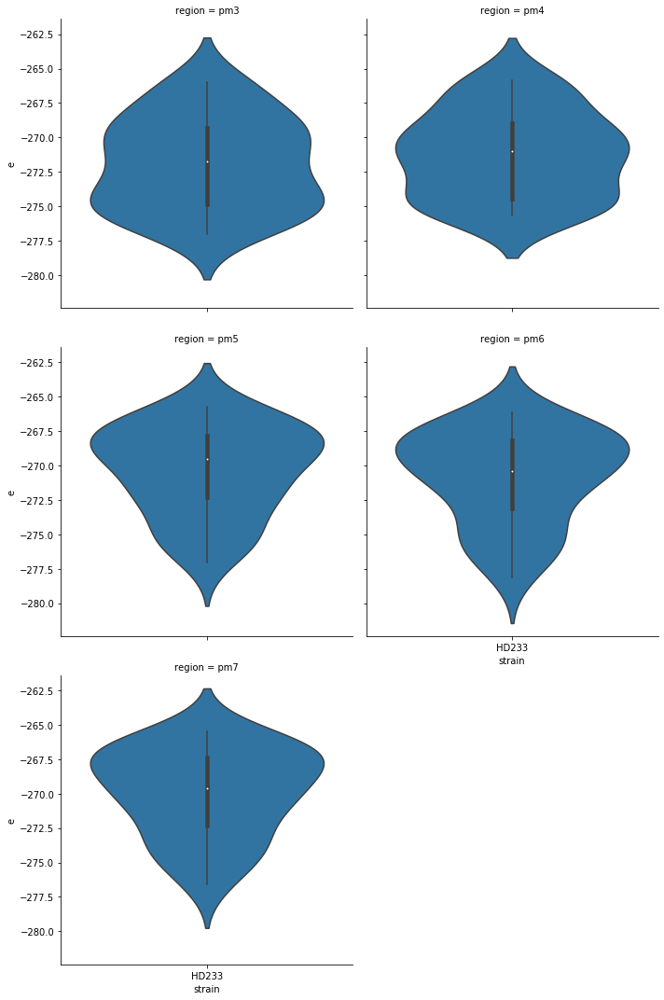

In [5]:
imaging_scheme = "TL/470/410/470/410"
for exp_dir in tqdm_notebook(list(Path("/Users/sean/code/wormAnalysis/data/paired_ratio").iterdir())):
    if exp_dir.is_dir():
        ex_unreg = experiment.PairExperiment(
            experiment_dir=exp_dir,
            imaging_scheme=imaging_scheme,
            trim_threshold=3000,
            save_summary_plots=False,
            strategy=f'single_reg_warp_lam={i}',
            should_register=False
        )
        ex_unreg.full_pipeline()
        for i in [0, 1, 10]:
            ex_reg = experiment.PairExperiment(
                experiment_dir=exp_dir,
                imaging_scheme=imaging_scheme,
                trim_threshold=3000,
                save_summary_plots=True,
                strategy=f'single_reg_warp_lam={i}',
                should_register=True,
                warp_lam=i
            )
            ex_reg.full_pipeline()
            plots.save_reg_diagnostics(ex_unreg, ex_reg, f"/Users/sean/Desktop/{ex_reg.experiment_id}_wlam={i}.pdf", **{})

In [6]:
reg_prof_wlam_0  = xr.concat((xr.load_dataarray(x) for x in (sorted(Path("/Users/sean/code/wormAnalysis/data/paired_ratio").glob("**/*warp*=0/*.nc")))), dim='strain')
reg_prof_wlam_1  = xr.concat((xr.load_dataarray(x) for x in (sorted(Path("/Users/sean/code/wormAnalysis/data/paired_ratio").glob("**/*warp*=1/*.nc")))), dim='strain')
reg_prof_wlam_10 = xr.concat((xr.load_dataarray(x) for x in (sorted(Path("/Users/sean/code/wormAnalysis/data/paired_ratio").glob("**/*warp*=10/*.nc")))), dim='strain')

raw_prof = xr.concat((xr.load_dataarray(x) for x in (sorted(Path("/Users/sean/code/wormAnalysis/data/paired_ratio").glob("**/*_unreg/*.nc")))), dim='strain')

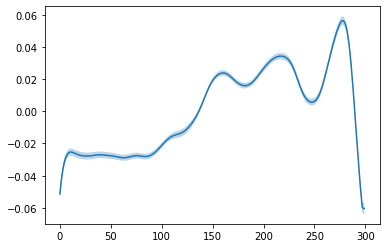

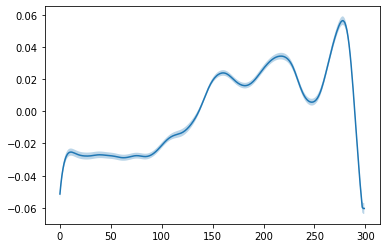

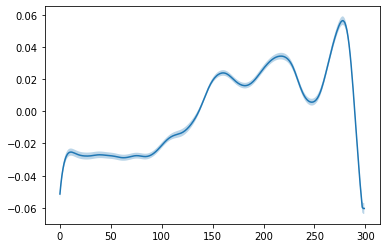

In [9]:
plots.plot_profile_avg_with_bounds((reg_prof_wlam_0  - reg_prof_wlam_0.mean(dim='position')).sel(wavelength='r', pair=0))
plots.plot_profile_avg_with_bounds((reg_prof_wlam_1  - reg_prof_wlam_1.mean(dim='position')).sel(wavelength='r', pair=0))
plots.plot_profile_avg_with_bounds((reg_prof_wlam_10 - reg_prof_wlam_10.mean(dim='position')).sel(wavelength='r', pair=0))

# Load all Profile Data

In [26]:
reg_prof = xr.concat((xr.load_dataarray(x) for x in (sorted(Path("/Users/sean/code/wormAnalysis/data/paired_ratio").glob("**/*_reg/*.nc")))), dim='strain')
raw_prof = xr.concat((xr.load_dataarray(x) for x in (sorted(Path("/Users/sean/code/wormAnalysis/data/paired_ratio").glob("**/*_unreg/*.nc")))), dim='strain')

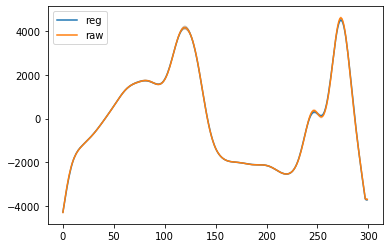

In [62]:
ax = plots.plot_profile_avg_with_bounds((reg_prof - reg_prof.mean(dim='position')).sel(wavelength='410', pair=0))
plots.plot_profile_avg_with_bounds((raw_prof - raw_prof.mean(dim='position')).sel(wavelength='410', pair=0), ax=ax);
plt.legend(['reg', 'raw'])

# Load all summary tables

In [65]:
reg_summary = pd.concat((pd.read_csv(x) for x in (sorted(Path("/Users/sean/code/wormAnalysis/data/paired_ratio").glob("**/*_reg/*.csv")))))
raw_summary = pd.concat((pd.read_csv(x) for x in (sorted(Path("/Users/sean/code/wormAnalysis/data/paired_ratio").glob("**/*_unreg/*.csv")))))

In [66]:
reg_summary.head()

,animal,strain,region,experiment,strategy,pair,470,410,r,oxd,e,anterior,posterior,sides_of_tip,tip
0,0,HD233,pm3,2017_02_22-HD233_SAY47,single_reg,0,5718.751210,7854.541172,1.374892,0.366903,-271.938935,0,0,0,1
1,1,HD233,pm3,2017_02_22-HD233_SAY47,single_reg,0,5256.916294,7595.136115,1.445211,0.399922,-270.160861,0,0,1,0
2,2,HD233,pm3,2017_02_22-HD233_SAY47,single_reg,0,6983.400833,9303.510173,1.332624,0.345788,-273.108825,0,0,0,0
3,3,HD233,pm3,2017_02_22-HD233_SAY47,single_reg,0,6151.727654,8658.061738,1.408538,0.383026,-271.063534,0,0,0,0
4,4,HD233,pm3,2017_02_22-HD233_SAY47,single_reg,0,6844.490478,9606.846030,1.402374,0.380122,-271.219973,0,0,0,0
